# Is there downwelling?

In [2]:
from functions.correlation_maps import simpleCorrelationMap, correlationMap_1D_v3, correlationMap_2D_v3#, correlationMap_2D, correlationMap_1D,
from functions.loading_and_processing_data import loadMITgcmData
from functions.other_functions import computeBuoyancy
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

In [20]:
wind=loadTimeSeriesData(filename='timeseries_final', members='all', kind='old')['amundsen_shelf_break_uwind_avg']
wind=wind.mean(dim='ens')

Loading number:0
../data/timeseries_final_PACE01.nc
Loading number:1
../data/timeseries_final_PACE02.nc
Loading number:2
../data/timeseries_final_PACE03.nc
Loading number:3
../data/timeseries_final_PACE04.nc
Loading number:4
../data/timeseries_final_PACE05.nc
Loading number:5
../data/timeseries_final_PACE06.nc
Loading number:6
../data/timeseries_final_PACE07.nc
Loading number:7
../data/timeseries_final_PACE08.nc
Loading number:8
../data/timeseries_final_PACE09.nc
Loading number:9
../data/timeseries_final_PACE10.nc
Loading number:10
../data/timeseries_final_PACE11.nc
Loading number:11
../data/timeseries_final_PACE12.nc
Loading number:12
../data/timeseries_final_PACE13.nc
Loading number:13
../data/timeseries_final_PACE14.nc
Loading number:14
../data/timeseries_final_PACE15.nc
Loading number:15
../data/timeseries_final_PACE16.nc
Loading number:16
../data/timeseries_final_PACE17.nc
Loading number:17
../data/timeseries_final_PACE18.nc
Loading number:18
../data/timeseries_final_PACE19.nc
Loa

Start preparing for correlation map!
NOTE: this is version 3!
...Making sure interpolate everything to the center of the cells
Loading number:0
../02_data/maps/EXFuwind_ens1.nc


/users/grejan/conda-envs/amundsen/lib/python3.9/site-packages/xarray/core/missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
/users/grejan/conda-envs/amundsen/lib/python3.9/site-packages/xarray/core/missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
/users/grejan/conda-envs/amundsen/lib/python3.9/site-packages/xarray/core/missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
/users/grejan/conda-envs/amundsen/lib/python3.9/site-packages/xarray/core/missing.py:563: FutureWarning: Passing metho

...Compute the absolute combined value
...Applying land mask.
...Selecting times between: 1920 and 2013
...Detrending data
...Computing correlation coefficients
...Looking at lag: -24
...Looking at lag: -23
...Looking at lag: -22
...Looking at lag: -21
...Looking at lag: -20
...Looking at lag: -19
...Looking at lag: -18
...Looking at lag: -17
...Looking at lag: -16
...Looking at lag: -15
...Looking at lag: -14
...Looking at lag: -13
...Looking at lag: -12
...Looking at lag: -11
...Looking at lag: -10
...Looking at lag: -9
...Looking at lag: -8
...Looking at lag: -7
...Looking at lag: -6
...Looking at lag: -5
...Looking at lag: -4
...Looking at lag: -3
...Looking at lag: -2
...Looking at lag: -1
...Looking at lag: 0
...Looking at lag: 1
...Looking at lag: 2
...Looking at lag: 3
...Looking at lag: 4
...Looking at lag: 5
...Looking at lag: 6
...Looking at lag: 7
...Looking at lag: 8
...Looking at lag: 9
...Looking at lag: 10
...Looking at lag: 11
...Looking at lag: 12
...Looking at lag: 1

ValueError: Dimensions {'YC'} do not exist. Expected one or more of Frozen({'XC': 600, 'ens_time': 1128})

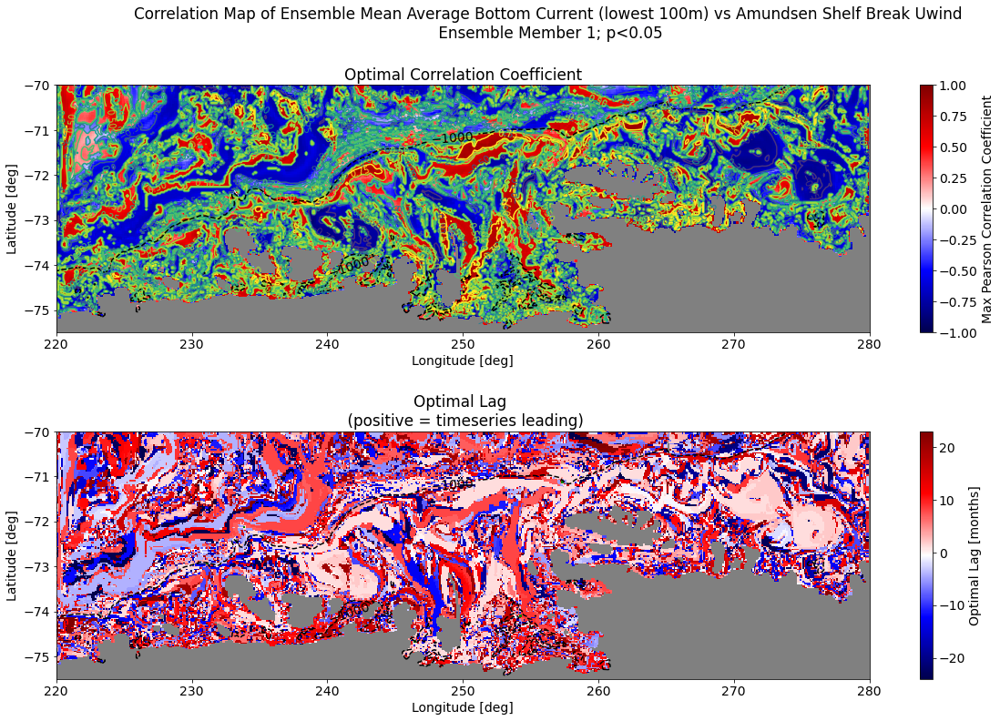

In [24]:
window=1
correlationMap_2D_v3(members='all',
                  data=[u_ensmean.expand_dims('ens'), v_ensmean.expand_dims('ens')], datafn='bottom100m_averaged_UVEL', datavar='UVEL', datakind='old',
                  ind=wind.to_dataset(name='amundsen_shelf_break_uwind_avg').expand_dims('ens'), indfn='timeseries_final', indvar='amundsen_shelf_break_uwind_avg', lags=range(-24, 24),
                  detrend=True, window=window, title='Correlation Map of Ensemble Mean Average Bottom Current (lowest 100m) vs Amundsen Shelf Break Uwind', ymax=-70, save=False, savefn='bottom100m_VEL_amundsen_shelf_break_uwind_'+str(window)+'month_dt',
                  draw_box=False, box_x=[360-115, 360-102],box_y=[-71.8, -70.2],
                  inverse=False,
                  give_back=False, save_results=False)

In [22]:
u_ensmean

<xarray.Dataset>
Dimensions:  (time: 1488, YC: 384, XG: 600)
Coordinates:
  * time     (time) object 1890-02-01 00:00:00 ... 2014-01-01 00:00:00
  * YC       (YC) float32 -75.64 -75.61 -75.59 -75.56 ... -62.48 -62.44 -62.39
  * XG       (XG) float32 220.0 220.1 220.2 220.3 ... 279.6 279.7 279.8 279.9
Data variables:
    UVEL     (time, YC, XG) float32 nan nan nan ... -0.01771 -0.02114 -0.007488

In [3]:
from functions.other_functions import computeBuoyancy
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from functions.loading_and_processing_data import loadMITgcmData, loadPACEData, detrend_and_average_MITgcmData, read_all_data, loadTimeSeriesData

import sys
sys.path.append('/data/hpcdata/users/grejan/mitgcm/') #Make sure we can also import Kaitlins code.
from mitgcm_python_master.grid import ERA5Grid, PACEGrid, Grid, dA_from_latlon, pierre_obs_grid

In [4]:
gp='/data/oceans_output/shelf/kaight/mitgcm/PAS_grid/'
grid = Grid(gp)

/users/kaight/MITgcm/utils/python/MITgcmutils/MITgcmutils/netcdf.py:330: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if hasattr(self, 'mode') and self.mode is 'w':
/users/kaight/MITgcm/utils/python/MITgcmutils/MITgcmutils/netcdf.py:705: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if typecode is not 'c':


In [5]:
dataU=loadMITgcmData(filename='bottom100m_averaged_UVEL', members='all', kind='old')
dataV=loadMITgcmData(filename='bottom100m_averaged_VVEL', members='all', kind='old')
melt=loadTimeSeriesData(filename='timeseries_final', members='all', kind='old')['dotson_to_cosgrove_massloss']

Loading number:0
../data/bottom100m_averaged_UVEL_ens1.nc
Loading number:1
../data/bottom100m_averaged_UVEL_ens2.nc
Loading number:2
../data/bottom100m_averaged_UVEL_ens3.nc
Loading number:3
../data/bottom100m_averaged_UVEL_ens4.nc
Loading number:4
../data/bottom100m_averaged_UVEL_ens5.nc
Loading number:5
../data/bottom100m_averaged_UVEL_ens6.nc
Loading number:6
../data/bottom100m_averaged_UVEL_ens7.nc
Loading number:7
../data/bottom100m_averaged_UVEL_ens8.nc
Loading number:8
../data/bottom100m_averaged_UVEL_ens9.nc
Loading number:9
../data/bottom100m_averaged_UVEL_ens10.nc
Loading number:10
../data/bottom100m_averaged_UVEL_ens11.nc
Loading number:11
../data/bottom100m_averaged_UVEL_ens12.nc
Loading number:12
../data/bottom100m_averaged_UVEL_ens13.nc
Loading number:13
../data/bottom100m_averaged_UVEL_ens14.nc
Loading number:14
../data/bottom100m_averaged_UVEL_ens15.nc
Loading number:15
../data/bottom100m_averaged_UVEL_ens16.nc
Loading number:16
../data/bottom100m_averaged_UVEL_ens17.nc

In [ ]:
dataU1=loadMITgcmData(filename='depth_averaged_UVEL', members='all', kind='old')
dataV1=loadMITgcmData(filename='depth_averaged_VVEL', members='all', kind='old')
dataU=dataU-dataU1
dataV=dataV-dataV1

Loading number:0
../data/depth_averaged_UVEL_ens1.nc
Loading number:1
../data/depth_averaged_UVEL_ens2.nc
Loading number:2
../data/depth_averaged_UVEL_ens3.nc
Loading number:3
../data/depth_averaged_UVEL_ens4.nc
Loading number:4
../data/depth_averaged_UVEL_ens5.nc
Loading number:5
../data/depth_averaged_UVEL_ens6.nc
Loading number:6
../data/depth_averaged_UVEL_ens7.nc
Loading number:7
../data/depth_averaged_UVEL_ens8.nc
Loading number:8
../data/depth_averaged_UVEL_ens9.nc
Loading number:9
../data/depth_averaged_UVEL_ens10.nc


In [ ]:
meltrm=melt.sel(time=slice('1920', '2013')).rolling(time=24, center=True).mean()
umean=dataU.where(meltrm>meltrm.quantile(0.9)).mean(dim=['time', 'ens'])
vmean=dataV.where(meltrm>meltrm.quantile(0.9)).mean(dim=['time', 'ens'])

In [ ]:
umean2=dataU.where(meltrm<meltrm.quantile(0.1)).mean(dim=['time', 'ens'])
vmean2=dataV.where(meltrm<meltrm.quantile(0.1)).mean(dim=['time', 'ens'])

In [ ]:
umean=umean.where(umean.YC<-70, drop=True)
vmean=vmean.where(vmean.YG<-70, drop=True)
umean2=umean2.where(umean2.YC<-70, drop=True)
vmean2=vmean2.where(vmean2.YG<-70, drop=True)

In [ ]:
step1=2
step2=4
scale=2

plt.rcParams.update({'font.size': 22})

plt.figure(figsize=(20,10))
plt.suptitle('Mean Flow Direction and Magnitude In Baroclinic Component \n Members 1 to 20')
ax=plt.subplot(1,2,1)
plt.pcolor(360+grid.lon_2d[grid.lat_1d<-70,:], grid.lat_2d[grid.lat_1d<-70,:], grid.land_mask[grid.lat_1d<-70,:], cmap='Greys', vmax=1.5)
Q=plt.quiver(vmean.XC[::step2], umean.YC[::step1], umean['UVEL'].values[::step1, ::step2], vmean['VVEL'].values[::step1, ::step2], vmean['VVEL'].values[::step1, ::step2], scale=scale, cmap='seismic')
qk = ax.quiverkey(Q, 0.9, 0.9, 0.1, r'$0.1 \frac{m}{s}$', labelpos='E',
                   coordinates='figure')
plt.title('When melt above 90th percentile')
plt.xlabel('Longitude [deg]')
plt.ylabel('Latitude [deg]')

ax=plt.subplot(1,2,2)
plt.pcolor(360+grid.lon_2d[grid.lat_1d<-70,:], grid.lat_2d[grid.lat_1d<-70,:], grid.land_mask[grid.lat_1d<-70,:], cmap='Greys', vmax=1.5)
Q=plt.quiver(vmean2.XC[::step2], umean2.YC[::step1], umean2['UVEL'].values[::step1, ::step2], vmean2['VVEL'].values[::step1, ::step2], vmean2['VVEL'].values[::step1, ::step2], scale=scale, cmap='seismic')
qk = ax.quiverkey(Q, 0.9, 0.9, 0.1, r'$0.1 \frac{m}{s}$', labelpos='E',
                   coordinates='figure')
plt.title('When melt below 10th percentile')
plt.xlabel('Longitude [deg]')
plt.ylabel('Latitude [deg]')

from datetime import date
today = date.today()
today=today.strftime("%Y%m%d")

plt.subplots_adjust(top=0.85)
#plt.savefig('../03_output/other/'+today+'_mean_flow_direction_versus_melt.png')

# plt.subplot(2,2,2)
# plt.plot(melt.sel(time=slice('1920', '2013')).indexes['time'].to_datetimeindex(), 
#          melt.mean(dim='ens').sel(time=slice('1920', '2013')).rolling(time=24, center=True).mean(), c='b')
# plt.grid(True)

# plt.subplot(2,2,3)
# plt.quiver(umean2.values[::step1, ::step2], vmean2.values[::step1, ::step2], vmean2.values[::step1, ::step2], scale=scale, cmap='seismic')
# plt.subplot(2,2,4)
# plt.plot(melt.sel(time=slice('1920', '2013')).indexes['time'].to_datetimeindex(), 
#          melt.mean(dim='ens').sel(time=slice('1920', '2013')).rolling(time=24, center=True).mean(), c='b')
# plt.grid(True)

In [18]:
u_ensmean=dataU.mean(dim='ens')
u_ensmean.to_netcdf('/data/hpcdata/users/grejan/mitgcm/02_data/maps/bottom100m_averaged_UVEL_ensmean.nc')
v_ensmean=dataV.mean(dim='ens')
v_ensmean.to_netcdf('/data/hpcdata/users/grejan/mitgcm/02_data/maps/bottom100m_averaged_VVEL_ensmean.nc')

In [27]:
meltrm=melt.mean(dim='ens').sel(time=slice('1920', '2013')).rolling(time=24, center=True).mean()
umean=dataU.where(meltrm>meltrm.quantile(0.9)).mean(dim='time')
vmean=dataV.where(meltrm>meltrm.quantile(0.9)).mean(dim='time')

In [46]:
umean2=dataU.where(meltrm<meltrm.quantile(0.1)).mean(dim='time')
vmean2=dataV.where(meltrm<meltrm.quantile(0.1)).mean(dim='time')

In [109]:
np.shape(grid.land_mask)

(384, 600)

In [115]:
np.shape(grid.lat_2d[grid.lat_1d<-70,:])

(193, 600)

In [114]:
np.shape(grid.land_mask[grid.lat_1d<-70,:])

(193, 600)

<a list of 36 text.Text objects>

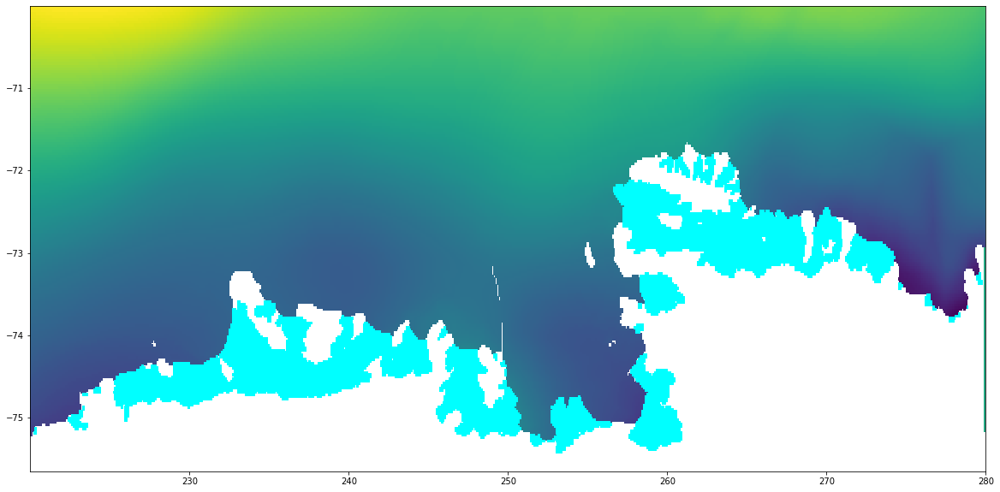

In [155]:
plt.figure(figsize=(20,10))
m=np.sum(grid.lat_1d<=-70)
ax=plt.subplot(1,1,1)
plt.pcolor(a.XC, a.YC[:m], a.isel(time=-2).where(a.isel(time=-2)!=0)[:m,:])
plt.pcolor(grid.lon_2d[:m,:]+360, grid.lat_2d[:m,:], np.where(grid.ice_mask, np.ones(np.shape(grid.ice_mask)), np.nan*np.ones(np.shape(grid.ice_mask)))[:m,:], cmap='cool')
#bath=plt.contour(grid.lon_2d[:m,:]+360, grid.lat_2d[:m,:], grid.bathy[:m,:], levels=[-1000], colors=['black'])
plt.clabel(bath, [-1000])
#ax.set_facecolor('grey')

In [147]:
m

600

In [74]:
np.ones(np.shape(grid.ice_mask))[grid.ice_mask==True]

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

In [56]:
c

<xarray.DataArray 'EXFuwind' (time: 1488, YC: 384, XC: 600)>
array([[[ 0.       ,  0.       ,  0.       , ...,  0.       ,
          0.       ,  0.       ],
        [ 0.       ,  0.       ,  0.       , ...,  0.       ,
          0.       ,  0.       ],
        [ 0.       ,  0.       ,  0.       , ...,  0.       ,
          0.       ,  0.       ],
        ...,
        [ 1.8317356,  1.8497486,  1.8560492, ...,  1.0056815,
          1.0024687,  1.0012943],
        [ 1.86693  ,  1.8663832,  1.8526634, ...,  1.0153958,
          1.013727 ,  1.0254736],
        [ 1.8916404,  1.87165  ,  1.8524053, ...,  1.034233 ,
          1.0327885,  1.0483048]],

       [[ 0.       ,  0.       ,  0.       , ...,  0.       ,
          0.       ,  0.       ],
        [ 0.       ,  0.       ,  0.       , ...,  0.       ,
          0.       ,  0.       ],
        [ 0.       ,  0.       ,  0.       , ...,  0.       ,
          0.       ,  0.       ],
...
        [ 9.66157  ,  9.640189 ,  9.6246   , ...,  6.2625003,
          6.2431803,  6.2501125],
        [ 9.684134 ,  9.648753 ,  9.606316 , ...,  6.3024287,
          6.29755  ,  6.3122883],
        [ 9.702474 ,  9.719744 ,  9.737555 , ...,  6.369472 ,
          6.365165 ,  6.373572 ]],

       [[ 0.       ,  0.       ,  0.       , ...,  0.       ,
          0.       ,  0.       ],
        [ 0.       ,  0.       ,  0.       , ...,  0.       ,
          0.       ,  0.       ],
        [ 0.       ,  0.       ,  0.       , ...,  0.       ,
          0.       ,  0.       ],
        ...,
        [10.290901 , 10.262339 , 10.239336 , ...,  7.613257 ,
          7.6237764,  7.629678 ],
        [10.33484  , 10.287031 , 10.227901 , ...,  7.626818 ,
          7.6627502,  7.694142 ],
        [10.373068 , 10.371563 , 10.370343 , ...,  7.7431626,
          7.7528815,  7.7576303]]], dtype=float32)
Coordinates:
    iter     (time) int64 ...
  * time     (time) object 1890-02-01 00:00:00 ... 2014-01-01 00:00:00
  * XC       (XC) float32 220.1 220.1 220.2 220.4 ... 279.6 279.8 279.9 280.0
  * YC       (YC) float32 -75.64 -75.61 -75.59 -75.56 ... -62.48 -62.44 -62.39
    Depth    (YC, XC) float32 ...
    rA       (YC, XC) float32 ...
Attributes:
    units:          m/s
    long_name:      zonal 10-m wind speed, >0 eastward
    standard_name:  EXFuwind

Loading number:0
../data/timeseries_final_PACE01.nc
Loading number:1
../data/timeseries_final_PACE02.nc
Loading number:2
../data/timeseries_final_PACE03.nc
Loading number:3
../data/timeseries_final_PACE04.nc


Text(0.5, 1.0, 'Member 4')

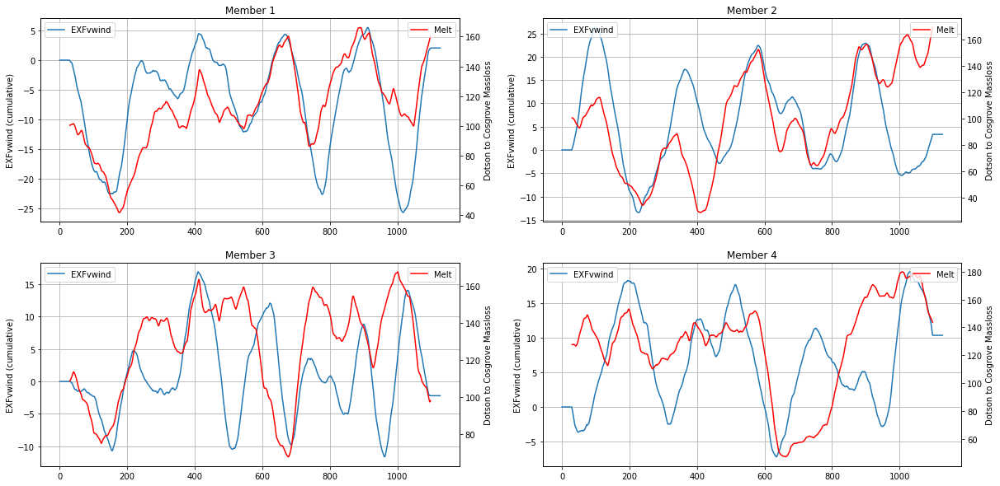

In [45]:

plt.figure(figsize=(20,10))
plt.subplot(2,2,1)
ens=1
data=xr.open_dataarray('../02_data/maps/EXFvwind_ens'+str(ens)+'.nc')
ind=data.sel(YC=slice(-72.2, -72), XC=slice(245,247)).mean(dim=['XC', 'YC'])
melt=loadTimeSeriesData(filename='timeseries_final', members=[ens-1,ens], kind='old')
indnew=-1*(ind.sel(time=slice('1920', '2013')).rolling(time=60, center=True).mean()-ind.sel(time=slice('1920', '2013')).rolling(time=25*12, center=True, min_periods=5*12).mean()).cumsum()
plt.plot(indnew, label='EXFvwind')
plt.grid()
plt.legend(loc='upper left')
plt.ylabel('EXFvwind (cumulative)')
plt.twinx()
plt.plot(melt['dotson_to_cosgrove_massloss'].sel(time=slice('1920', '2013')).mean(dim='ens').rolling(time=60, center=True).mean(), c='r', label='Melt')
plt.legend(loc='upper right')
plt.ylabel('Dotson to Cosgrove Massloss')
plt.title('Member '+str(ens))

plt.subplot(2,2,2)
ens=2
data=xr.open_dataarray('../02_data/maps/EXFvwind_ens'+str(ens)+'.nc')
ind=data.sel(YC=slice(-72.2, -72), XC=slice(245,247)).mean(dim=['XC', 'YC'])
melt=loadTimeSeriesData(filename='timeseries_final', members=[ens-1,ens], kind='old')
indnew=-1*(ind.sel(time=slice('1920', '2013')).rolling(time=60, center=True).mean()-ind.sel(time=slice('1920', '2013')).rolling(time=25*12, center=True, min_periods=5*12).mean()).cumsum()
plt.plot(indnew, label='EXFvwind')
plt.grid()
plt.legend(loc='upper left')
plt.ylabel('EXFvwind (cumulative)')
plt.twinx()
plt.plot(melt['dotson_to_cosgrove_massloss'].sel(time=slice('1920', '2013')).mean(dim='ens').rolling(time=60, center=True).mean(), c='r', label='Melt')
plt.legend(loc='upper right')
plt.ylabel('Dotson to Cosgrove Massloss')
plt.title('Member '+str(ens))

plt.subplot(2,2,3)
ens=3
data=xr.open_dataarray('../02_data/maps/EXFvwind_ens'+str(ens)+'.nc')
ind=data.sel(YC=slice(-72.2, -72), XC=slice(245,247)).mean(dim=['XC', 'YC'])
melt=loadTimeSeriesData(filename='timeseries_final', members=[ens-1,ens], kind='old')
indnew=-1*(ind.sel(time=slice('1920', '2013')).rolling(time=60, center=True).mean()-ind.sel(time=slice('1920', '2013')).rolling(time=25*12, center=True, min_periods=5*12).mean()).cumsum()
plt.plot(indnew, label='EXFvwind')
plt.grid()
plt.legend(loc='upper left')
plt.ylabel('EXFvwind (cumulative)')
plt.twinx()
plt.plot(melt['dotson_to_cosgrove_massloss'].sel(time=slice('1920', '2013')).mean(dim='ens').rolling(time=60, center=True).mean(), c='r', label='Melt')
plt.legend(loc='upper right')
plt.ylabel('Dotson to Cosgrove Massloss')
plt.title('Member '+str(ens))

plt.subplot(2,2,4)
ens=4
data=xr.open_dataarray('../02_data/maps/EXFvwind_ens'+str(ens)+'.nc')
ind=data.sel(YC=slice(-72.2, -72), XC=slice(245,247)).mean(dim=['XC', 'YC'])
melt=loadTimeSeriesData(filename='timeseries_final', members=[ens-1,ens], kind='old')
indnew=-1*(ind.sel(time=slice('1920', '2013')).rolling(time=60, center=True).mean()-ind.sel(time=slice('1920', '2013')).rolling(time=25*12, center=True, min_periods=5*12).mean()).cumsum()
plt.plot(indnew, label='EXFvwind')
plt.grid()
plt.legend(loc='upper left')
plt.ylabel('EXFvwind (cumulative)')
plt.twinx()
plt.plot(melt['dotson_to_cosgrove_massloss'].sel(time=slice('1920', '2013')).mean(dim='ens').rolling(time=60, center=True).mean(), c='r', label='Melt')
plt.legend(loc='upper right')
plt.ylabel('Dotson to Cosgrove Massloss')
plt.title('Member '+str(ens))


Loading number:0
../data/timeseries_final_PACE01.nc
Loading number:1
../data/timeseries_final_PACE02.nc
Loading number:2
../data/timeseries_final_PACE03.nc
Loading number:3
../data/timeseries_final_PACE04.nc


Text(0, 0.5, 'Dotson to Cosgrove Massloss')

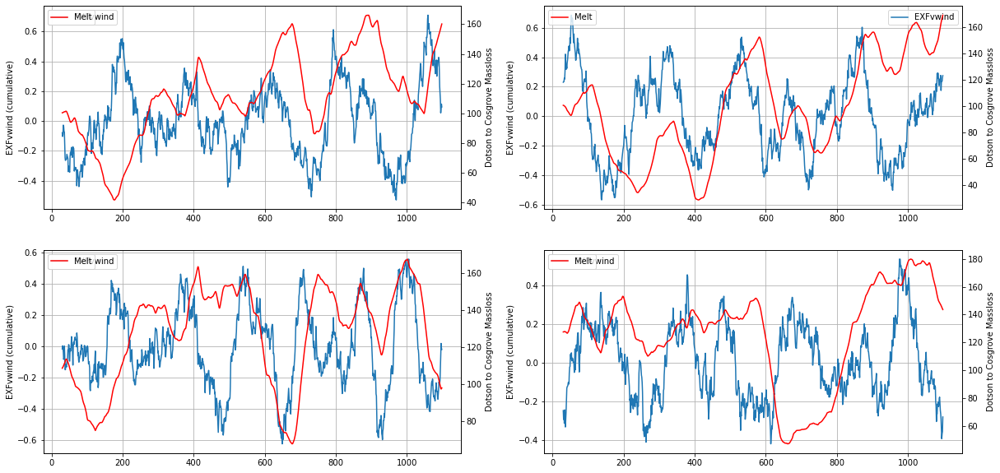

In [46]:
plt.figure(figsize=(20,10))
plt.subplot(2,2,1)
ens=1
data=xr.open_dataarray('../02_data/maps/EXFvwind_ens'+str(ens)+'.nc')
ind=data.sel(YC=slice(-72.2, -72), XC=slice(245,247)).mean(dim=['XC', 'YC'])
melt=loadTimeSeriesData(filename='timeseries_final', members=[ens-1,ens], kind='old')
indnew=-1*(ind.sel(time=slice('1920', '2013')).rolling(time=60, center=True).mean()-ind.sel(time=slice('1920', '2013')).rolling(time=25*12, center=True, min_periods=5*12).mean())
plt.plot(indnew, label='EXFvwind')
plt.grid()
plt.legend()
plt.ylabel('EXFvwind (cumulative)')
plt.twinx()
plt.plot(melt['dotson_to_cosgrove_massloss'].sel(time=slice('1920', '2013')).mean(dim='ens').rolling(time=60, center=True).mean(), c='r', label='Melt')
plt.legend()
plt.ylabel('Dotson to Cosgrove Massloss')


plt.subplot(2,2,2)
ens=2
data=xr.open_dataarray('../02_data/maps/EXFvwind_ens'+str(ens)+'.nc')
ind=data.sel(YC=slice(-72.2, -72), XC=slice(245,247)).mean(dim=['XC', 'YC'])
melt=loadTimeSeriesData(filename='timeseries_final', members=[ens-1,ens], kind='old')
indnew=-1*(ind.sel(time=slice('1920', '2013')).rolling(time=60, center=True).mean()-ind.sel(time=slice('1920', '2013')).rolling(time=25*12, center=True, min_periods=5*12).mean())
plt.plot(indnew, label='EXFvwind')
plt.grid()
plt.legend()
plt.ylabel('EXFvwind (cumulative)')
plt.twinx()
plt.plot(melt['dotson_to_cosgrove_massloss'].sel(time=slice('1920', '2013')).mean(dim='ens').rolling(time=60, center=True).mean(), c='r', label='Melt')
plt.legend()
plt.ylabel('Dotson to Cosgrove Massloss')


plt.subplot(2,2,3)
ens=3
data=xr.open_dataarray('../02_data/maps/EXFvwind_ens'+str(ens)+'.nc')
ind=data.sel(YC=slice(-72.2, -72), XC=slice(245,247)).mean(dim=['XC', 'YC'])
melt=loadTimeSeriesData(filename='timeseries_final', members=[ens-1,ens], kind='old')
indnew=-1*(ind.sel(time=slice('1920', '2013')).rolling(time=60, center=True).mean()-ind.sel(time=slice('1920', '2013')).rolling(time=25*12, center=True, min_periods=5*12).mean())
plt.plot(indnew, label='EXFvwind')
plt.grid()
plt.legend()
plt.ylabel('EXFvwind (cumulative)')
plt.twinx()
plt.plot(melt['dotson_to_cosgrove_massloss'].sel(time=slice('1920', '2013')).mean(dim='ens').rolling(time=60, center=True).mean(), c='r', label='Melt')
plt.legend()
plt.ylabel('Dotson to Cosgrove Massloss')

plt.subplot(2,2,4)
ens=4
data=xr.open_dataarray('../02_data/maps/EXFvwind_ens'+str(ens)+'.nc')
ind=data.sel(YC=slice(-72.2, -72), XC=slice(245,247)).mean(dim=['XC', 'YC'])
melt=loadTimeSeriesData(filename='timeseries_final', members=[ens-1,ens], kind='old')
indnew=-1*(ind.sel(time=slice('1920', '2013')).rolling(time=60, center=True).mean()-ind.sel(time=slice('1920', '2013')).rolling(time=25*12, center=True, min_periods=5*12).mean())
plt.plot(indnew, label='EXFvwind')
plt.grid()
plt.legend()
plt.ylabel('EXFvwind (cumulative)')
plt.twinx()
plt.plot(melt['dotson_to_cosgrove_massloss'].sel(time=slice('1920', '2013')).mean(dim='ens').rolling(time=60, center=True).mean(), c='r', label='Melt')
plt.legend()
plt.ylabel('Dotson to Cosgrove Massloss')



Loading number:0
../data/timeseries_final_PACE01.nc
Loading number:1
../data/timeseries_final_PACE02.nc
Loading number:2
../data/timeseries_final_PACE03.nc
Loading number:3
../data/timeseries_final_PACE04.nc
Loading number:4
../data/timeseries_final_PACE05.nc
Loading number:5
../data/timeseries_final_PACE06.nc
Loading number:6
../data/timeseries_final_PACE07.nc
Loading number:7
../data/timeseries_final_PACE08.nc
Loading number:8
../data/timeseries_final_PACE09.nc
Loading number:9
../data/timeseries_final_PACE10.nc
Loading number:10
../data/timeseries_final_PACE11.nc
Loading number:11
../data/timeseries_final_PACE12.nc
Loading number:12
../data/timeseries_final_PACE13.nc
Loading number:13
../data/timeseries_final_PACE14.nc
Loading number:14
../data/timeseries_final_PACE15.nc
Loading number:15
../data/timeseries_final_PACE16.nc
Loading number:16
../data/timeseries_final_PACE17.nc
Loading number:17
../data/timeseries_final_PACE18.nc
Loading number:18
../data/timeseries_final_PACE19.nc
Loa

Text(0, 0.5, 'Dotson to Cosgrove Massloss')

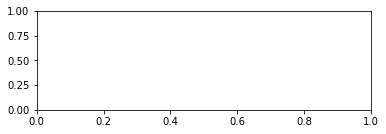

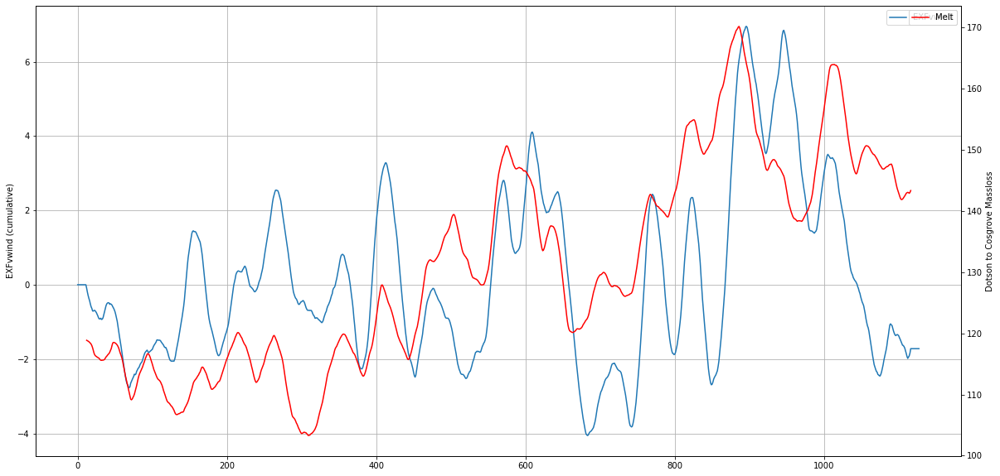

In [38]:
plt.subplot(2,1,2)
ens='all'
data=xr.open_dataarray('../02_data/maps/EXFvwind_ensmean.nc')
ind=data.sel(YC=slice(-72.2, -72), XC=slice(245,247)).mean(dim=['XC', 'YC'])
melt=loadTimeSeriesData(filename='timeseries_final', members='all', kind='old')
indnew=-1*(ind.sel(time=slice('1920', '2013')).rolling(time=24, center=True).mean()-ind.sel(time=slice('1920', '2013')).rolling(time=25*12, center=True, min_periods=5*12).mean()).cumsum()
plt.figure(figsize=(20,10))
plt.plot(indnew, label='EXFvwind')
plt.grid()
plt.legend()
plt.ylabel('EXFvwind (cumulative)')
plt.twinx()
plt.plot(melt['dotson_to_cosgrove_massloss'].sel(time=slice('1920', '2013')).mean(dim='ens').rolling(time=24, center=True).mean(), c='r', label='Melt')
plt.legend()
plt.ylabel('Dotson to Cosgrove Massloss')


In [59]:
oceFWflx=xr.open_dataset('../02_data/maps/oceFWflx_ens1.nc')
oceQnet=xr.open_dataset('../02_data/maps/oceQnet_ens1.nc')
SSS=xr.open_dataset('../02_data/maps/Z5_SALT_ens1.nc')

In [62]:
g = 9.81 #m/s^2 is gravity
tAlpha = 3.733e-5 #K^-1 is thermal expansion coefficient
Cp = 4180 #J/K/kg is specific heat of seawater
sBeta = 7.843e-4 #psu^-1 is haline contraction coefficient
#SSS is surface salinity

oceBUOY= g * (tAlpha/Cp * oceQnet['oceQnet'] + sBeta * SSS['SALT'] * oceFWflx['oceFWflx'])

oceBUOY


<xarray.DataArray (time: 1488, YC: 384, XC: 600)>
array([[[2.4433535e-05, 2.4476247e-05, 2.4518962e-05, ...,
         2.6104843e-05, 2.6096635e-05, 2.6088434e-05],
        [2.4401965e-05, 2.4444347e-05, 2.4486730e-05, ...,
         2.6092954e-05, 2.6084692e-05, 2.6076430e-05],
        [2.4370331e-05, 2.4412380e-05, 2.4454430e-05, ...,
         2.6081039e-05, 2.6072717e-05, 2.6064401e-05],
        ...,
        [4.9980255e-03, 2.7410864e-04, 1.1596665e-04, ...,
         1.8525177e-05, 1.8629249e-05, 1.9350648e-05],
        [4.9866904e-03, 3.0917849e-04, 1.6541337e-04, ...,
         1.8795197e-05, 1.8890323e-05, 1.9390267e-05],
        [4.8781135e-03, 4.9970308e-03, 4.9267695e-03, ...,
         1.9690367e-05, 1.9677933e-05, 1.9429124e-05]],

       [[1.4557219e-05, 1.4581471e-05, 1.4605724e-05, ...,
         1.6111560e-05, 1.6110294e-05, 1.6109028e-05],
        [1.4550648e-05, 1.4573929e-05, 1.4597209e-05, ...,
         1.6114109e-05, 1.6112777e-05, 1.6111448e-05],
        [1.4544062e-05, 1.4566371e-05, 1.4588678e-05, ...,
         1.6116663e-05, 1.6115267e-05, 1.6113871e-05],
...
        [1.9249462e-03, 7.8938843e-04, 4.0416812e-04, ...,
         9.7001684e-06, 9.7305137e-06, 8.7656030e-05],
        [1.9925379e-03, 8.0416753e-04, 4.4787535e-04, ...,
         9.2681339e-06, 9.3420449e-06, 5.3095475e-05],
        [2.0602320e-03, 1.9034395e-03, 1.9250755e-03, ...,
         9.7276134e-05, 9.9792393e-05, 3.0271516e-05]],

       [[2.7450502e-05, 2.7474824e-05, 2.7499147e-05, ...,
         2.7943417e-05, 2.7917875e-05, 2.7892327e-05],
        [2.7419299e-05, 2.7443661e-05, 2.7468019e-05, ...,
         2.7936912e-05, 2.7911901e-05, 2.7886887e-05],
        [2.7388032e-05, 2.7412430e-05, 2.7436827e-05, ...,
         2.7930397e-05, 2.7905917e-05, 2.7881437e-05],
        ...,
        [3.8584536e-03, 1.3925579e-03, 5.0373538e-04, ...,
         1.4120483e-05, 1.3878933e-05, 1.4612924e-05],
        [3.9384058e-03, 1.3900528e-03, 6.3884881e-04, ...,
         1.3940137e-05, 1.3782984e-05, 1.4215689e-05],
        [4.0185489e-03, 3.8697820e-03, 3.8584722e-03, ...,
         1.4966517e-05, 1.4921595e-05, 1.3815240e-05]]], dtype=float32)
Coordinates:
    iter     (time) int64 4464 8496 12960 17280 ... 6508656 6512976 6517440
  * time     (time) object 1890-02-01 00:00:00 ... 2014-01-01 00:00:00
  * XC       (XC) float32 220.1 220.1 220.2 220.4 ... 279.6 279.8 279.9 280.0
  * YC       (YC) float32 -75.64 -75.61 -75.59 -75.56 ... -62.48 -62.44 -62.39
    Depth    (YC, XC) float32 0.0 0.0 0.0 0.0 ... 4.71e+03 4.683e+03 4.673e+03
    rA       (YC, XC) float32 7.604e+06 7.604e+06 ... 2.652e+07 2.652e+07
    Z        float32 ...
    PHrefC   float32 ...
    drF      float32 ...
    hFacC    (YC, XC) float32 ...

Text(0.5, 1.0, 'SALT Z=-5')

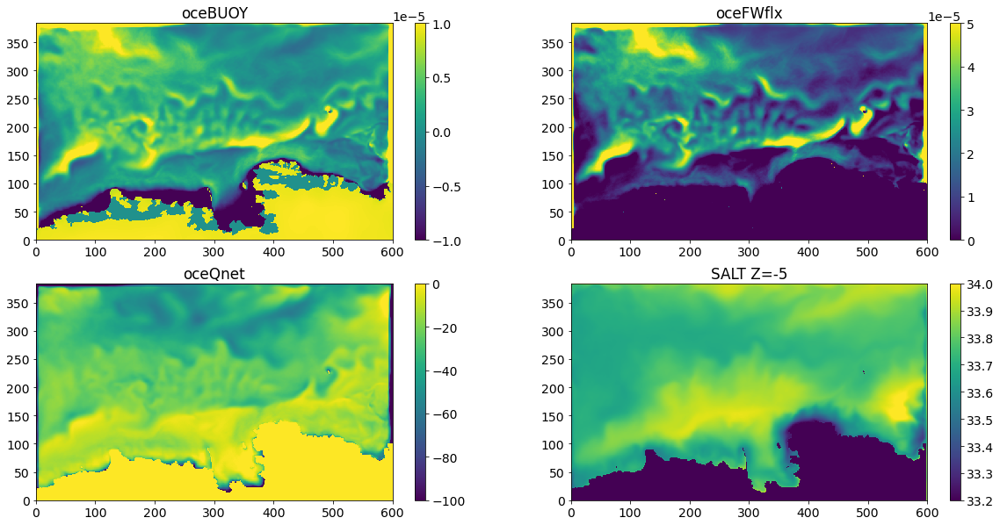

In [78]:
plt.figure(figsize=(20,10))
plt.subplot(2,2,1)
plt.pcolor(oceBUOY.mean(dim='time'), vmin=-1e-5, vmax=1e-5)
plt.title('oceBUOY')
plt.colorbar()
plt.subplot(2,2,2)
plt.pcolor(oceFWflx['oceFWflx'].mean(dim='time'), vmin=0, vmax=0.5e-4)
plt.colorbar()
plt.title('oceFWflx')
plt.subplot(2,2,3)
plt.pcolor(oceQnet['oceQnet'].mean(dim='time'), vmin=-100, vmax=0)
plt.colorbar()
plt.title('oceQnet')
plt.subplot(2,2,4)
plt.pcolor(SSS['SALT'].mean(dim='time'), vmin=33.2, vmax=34)
plt.colorbar()
plt.title('SALT Z=-5')

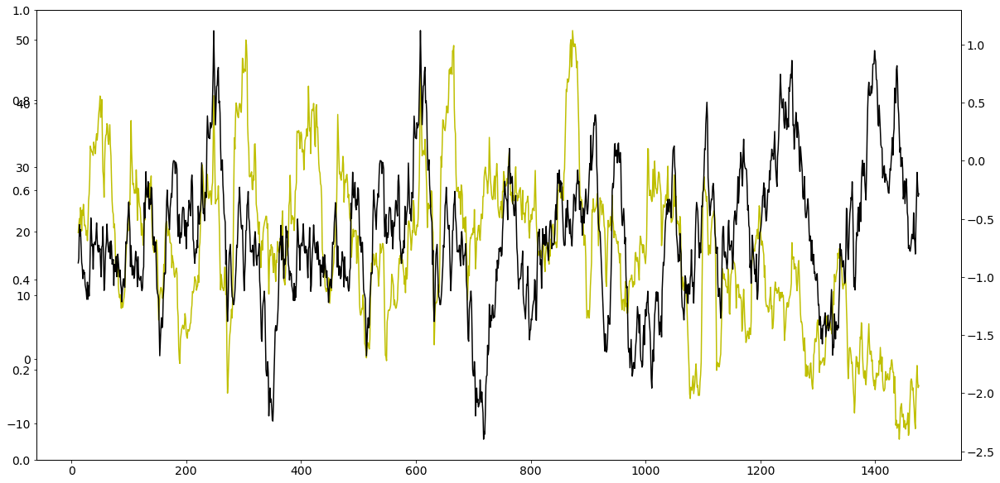

In [95]:
plt.figure(figsize=(20,10))
#plt.plot(oceBUOY.isel(XC=-10, YC=-10).rolling(time=24, center=True).mean(), c='b')
plt.twinx()
plt.plot(-1*oceQnet['oceQnet'].isel(XC=-10, YC=-10).rolling(time=24, center=True).mean(), c='y')
# plt.twinx()
# plt.plot(oceFWflx['oceFWflx'].isel(XC=-10, YC=-10).rolling(time=24, center=True).mean(), c='c')
# plt.twinx()
# plt.plot(-1*SSS['SALT'].isel(XC=-10, YC=-10).rolling(time=24, center=True).mean(), c='r')

plt.twinx()
plt.plot(melt.rolling(time=24, center=True).mean(), c='k')

In [90]:
melt=xr.open_dataset('../data/timeseries_final_PACE01.nc')['amundsen_shelf_break_uwind_avg']

In [58]:
a=xr.open_dataset('/data/oceans_output/shelf/kaight/mitgcm/PAS_PACE01/output/194001/MITgcm/output.nc')
#.sel(Z=-5)
'Z' in a[['SALT']].dims

True

In [50]:
os.listdir('/data/oceans_output/shelf/kaight/mitgcm/PAS_PACE01/output/194001/MITgcm')

['STDERR.0000',
 'STDOUT.0000',
 'bathymetry_bedmach.bin',
 'data',
 'data.diagnostics',
 'output.nc',
 'panom.bin',
 'pickup.0002628000.data',
 'pickup.0002628000.meta',
 'pickup.0002680560.data',
 'pickup.0002680560.meta',
 'pickup_seaice.0002628000.data',
 'pickup_seaice.0002628000.meta',
 'pickup_seaice.0002680560.data',
 'pickup_seaice.0002680560.meta',
 'shelfice.bin']

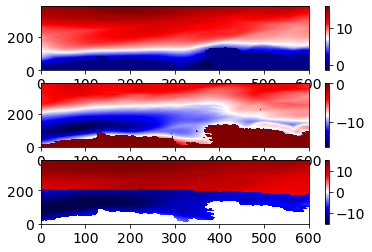

In [27]:
#plt.pcolor(c.where(np.isnan(c)), color=['green'])
plt.figure()
plt.subplot(3,1,1)
plt.pcolor(a.max(dim='time'), cmap='seismic')
plt.colorbar()
plt.subplot(3,1,2)
plt.pcolor(a.min(dim='time'), cmap='seismic')
plt.colorbar()
plt.subplot(3,1,3)
amax=a.max(dim='time')
amin=a.min(dim='time')
plt.pcolor(amax.where(amax>abs(amin)), cmap='seismic', vmin=-15, vmax=15)
plt.pcolor(amin.where(amax<abs(amin)), cmap='seismic', vmin=-15, vmax=15)
plt.colorbar()

In [42]:
b=amax.copy()
#b=b.to_numpy()

b.to_numpy()[amax<abs(amin)]=amin.to_numpy()[amax<abs(amin)]
b

<xarray.DataArray 'EXFuwind' (YC: 384, XC: 600)>
array([[ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ],
       [ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ],
       [ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ],
       ...,
       [14.605233 , 14.516318 , 14.446622 , ..., 12.909951 , 12.937702 ,
        12.969808 ],
       [14.612842 , 14.518491 , 14.426886 , ..., 12.920356 , 12.963584 ,
        13.002798 ],
       [14.621893 , 14.625246 , 14.6300335, ..., 13.06645  , 13.053728 ,
        13.035809 ]], dtype=float32)
Coordinates:
  * XC       (XC) float32 220.1 220.1 220.2 220.4 ... 279.6 279.8 279.9 280.0
  * YC       (YC) float32 -75.64 -75.61 -75.59 -75.56 ... -62.48 -62.44 -62.39
    Depth    (YC, XC) float32 ...
    rA       (YC, XC) float32 ...

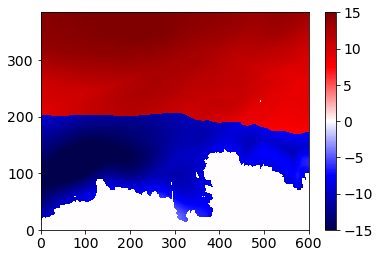

In [43]:
plt.pcolor(b, cmap='seismic', vmin=-15, vmax=15)
plt.colorbar()

In [2]:
#%%IMPORTING
import xarray as xr
import os
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import pandas as pd
import datetime
import matplotlib.colors as colors

divnorm = colors.TwoSlopeNorm(vcenter=0)

plt.rcParams.update({'font.size': 14})

from functions.loading_and_processing_data import loadMITgcmData, detrend_and_average_MITgcmData, read_all_data,loadPACEData, loadTimeSeriesData
from functions.composite_maps import createCompositeMap, createVelocityCompositeMap, defineEvents, findEvents


In [42]:
# dataU=loadMITgcmData('EXFuwind', members=[0,1])
# dataV=loadMITgcmData('EXFvwind', members=[0,1])
# data=np.sqrt(dataU['EXFuwind']**2+dataV['EXFvwind']**2)

data=loadMITgcmData('curlWIND', members=[3,4])
ts=loadTimeSeriesData(filename='timeseries_final', members=[3,4], kind='old')
data=detrend_and_average_MITgcmData(data, var='curlWIND', window=24)
ts=detrend_and_average_MITgcmData(ts, var='dotson_to_cosgrove_massloss', window=24)


Loading number:3
../02_data/maps/curlWIND_ens4.nc
Loading number:3
../data/timeseries_final_PACE04.nc


In [45]:
rs=xr.corr(data.diff('YC'), ts, dim='time')

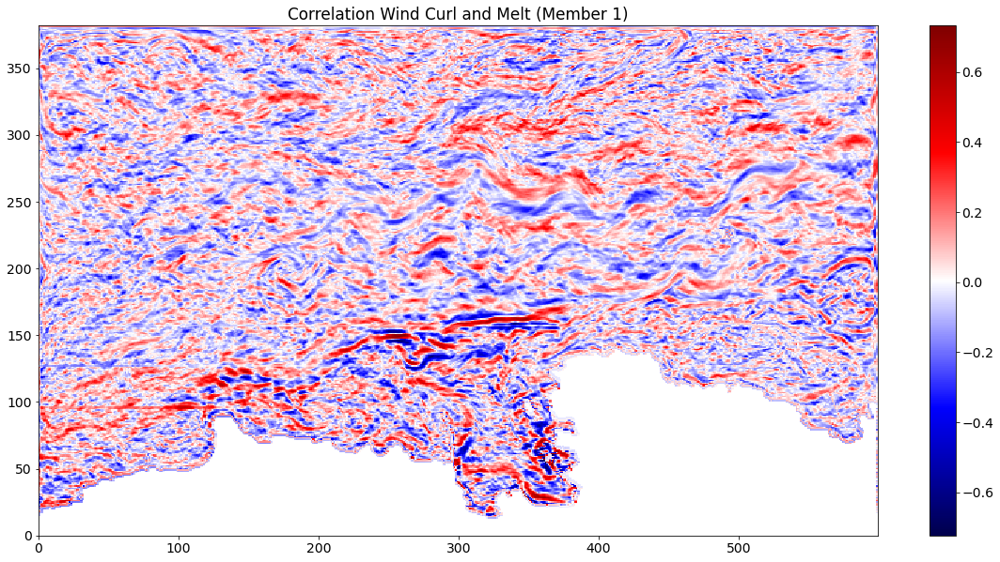

In [46]:
plt.figure(figsize=(20,10))
plt.title('Correlation Wind Curl and Melt (Member 1)')
plt.pcolor(rs.mean(dim='ens'), cmap='seismic')
plt.colorbar()

In [ ]:
#data=xr.open_dataset('/data/hpcdata/users/grejan/mitgcm/02_data/maps/curlWIND_ensmean.nc')
data=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/maps/curlWIND_ensmean.nc')
data=data.to_dataset(name='curlWIND')
ts=loadTimeSeriesData(filename='timeseries_final', members='all', kind='old')
ts=ts.mean(dim='ens')

data=detrend_and_average_MITgcmData(data, var='curlWIND', window=24)
ts=detrend_and_average_MITgcmData(ts, var='dotson_to_cosgrove_massloss', window=24)

In [27]:
rs=xr.corr(data, ts, dim='time')

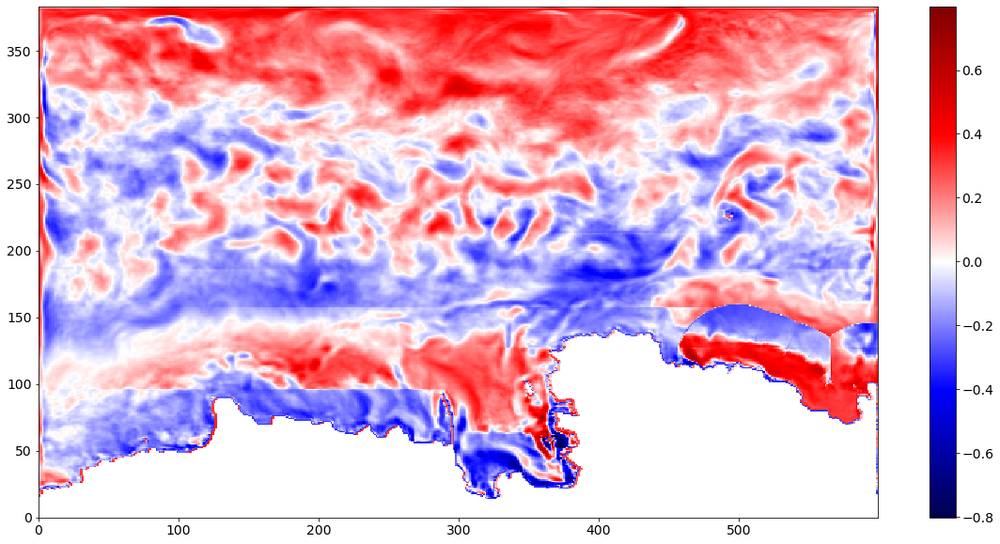

In [28]:
plt.figure(figsize=(20,10))
plt.pcolor(rs, cmap='seismic')
plt.colorbar()

In [64]:
data1=loadPACEData(var='PSL', members=[5,6])
data2=loadPACEData(var='PSL', members=[9,10])
data=xr.concat([data1, data2], dim='ens')

Loading number:5
Loading number:9


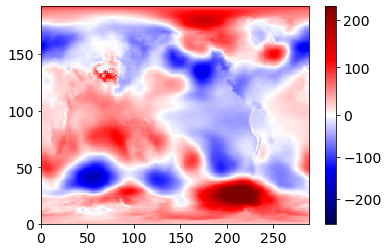

In [65]:
plt.pcolor(data['PSL'].sel(time=slice('1940', '1941')).mean(dim=['time', 'ens'])-data['PSL'].mean(dim=['time', 'ens']), cmap='seismic', norm=divnorm)
plt.colorbar()

In [61]:
data1=loadPACEData(var='PSL', members=[10,11])
data2=loadPACEData(var='PSL', members=[11,12])
data=xr.concat([data1, data2], dim='ens')

Loading number:10
Loading number:11


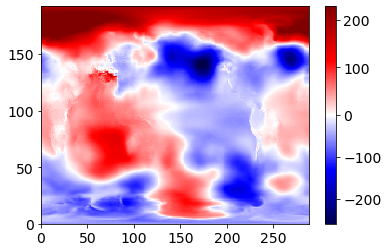

In [63]:
plt.pcolor(data['PSL'].sel(time=slice('1940', '1941')).mean(dim=['time', 'ens'])-data['PSL'].mean(dim=['time', 'ens']), cmap='seismic', norm=divnorm)
plt.colorbar()

In [46]:
q=data['PSL'].groupby('time.month')-data['PSL'].groupby('time.month').mean('time')

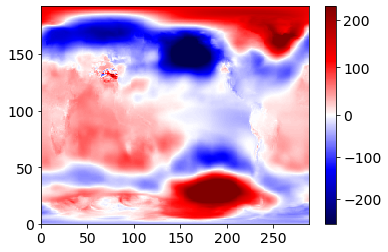

In [47]:
plt.pcolor(q.sel(time=slice('1939', '1941')).mean(dim=['time', 'ens'])-q.mean(dim=['time', 'ens']), cmap='seismic', norm=divnorm)
plt.colorbar()

In [56]:
data1=loadPACEData(var='SST', members=[5,6])
data2=loadPACEData(var='SST', members=[9,10])
data=xr.concat([data1, data2], dim='ens')

Loading number:10
Loading number:11


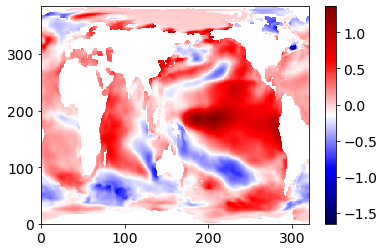

In [53]:
plt.pcolor(data['SST'].sel(time=slice('1941', '1941')).mean(dim=['time', 'ens', 'z_t'])-data['SST'].mean(dim=['time', 'ens', 'z_t']), cmap='seismic')
plt.colorbar()

In [ ]:
data1=loadPACEData(var='SST', members=[10,11])
data2=loadPACEData(var='SST', members=[11,12])
data=xr.concat([data1, data2], dim='ens')

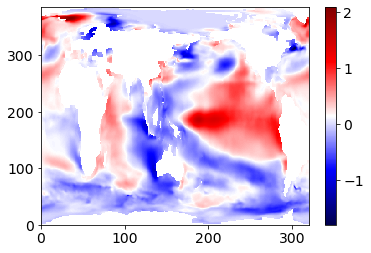

In [57]:
plt.pcolor(data['SST'].sel(time=slice('1941', '1941')).mean(dim=['time', 'ens', 'z_t'])-data['SST'].mean(dim=['time', 'ens', 'z_t']), cmap='seismic')
plt.colorbar()

In [54]:
q=data['SST'].groupby('time.month')-data['SST'].groupby('time.month').mean('time')

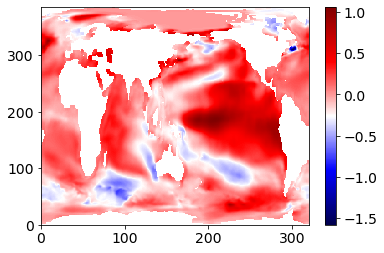

In [55]:
plt.pcolor(q.sel(time=slice('1940', '1941')).mean(dim=['time', 'ens', 'z_t'])-q.mean(dim=['time', 'ens', 'z_t']), cmap='seismic')
plt.colorbar()

In [31]:
data

<xarray.Dataset>
Dimensions:  (nlat: 384, nlon: 320, time: 1128, z_t: 1, ens: 1)
Coordinates:
    TLAT     (nlat, nlon) float64 -79.22 -79.22 -79.22 ... 72.2 72.19 72.19
    TLONG    (nlat, nlon) float64 320.6 321.7 322.8 323.9 ... 318.9 319.4 319.8
    ULAT     (nlat, nlon) float64 -78.95 -78.95 -78.95 ... 72.42 72.41 72.41
    ULONG    (nlat, nlon) float64 321.1 322.3 323.4 324.5 ... 319.2 319.6 320.0
  * time     (time) object 1920-02-01 00:00:00 ... 2014-01-01 00:00:00
  * z_t      (z_t) float32 500.0
Dimensions without coordinates: nlat, nlon, ens
Data variables:
    SST      (ens, time, z_t, nlat, nlon) float32 nan nan nan ... nan nan nan

In [9]:
import os
os.listdir('/data/oceans_input/raw_input_data/CESM/PPACE/monthly/SST/')
q=xr.open_dataset('/data/oceans_input/raw_input_data/CESM/PPACE/monthly/SST/b.e11.B20TRLENS.f09_g16.SST.restoring.ens01.pop.h.SST.192001-200512.nc')

In [12]:
np.shape(q.SST.values)

(1032, 1, 384, 320)

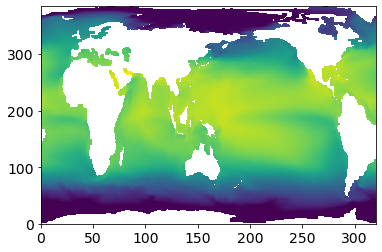

In [18]:
plt.pcolor(q.SST.to_numpy()[115, 0,:,:])

In [67]:
%%capture --no-display
#Reading the data.
full='/data/hpcdata/users/grejan/mitgcm/data'
total={}
units={}
longnames={}
#from unixFunctionsMITgcm_final import read_all_data
total, units, longnames=read_all_data(full, total, units, longnames, kind='isotherm')
total, units, longnames=read_all_data(full, total, units, longnames, kind='final')
total, units, longnames=read_all_data(full, total, units, longnames, kind='ohc')

ens12   -46.729838
ens11   -45.341774
ens16   -30.146477
ens04   -22.198125
ens05   -14.756008
ens07    -5.966495
ens19    -2.795271
ens02    -1.996647
ens01     1.124140
ens15     1.830672
ens09     4.311580
ens08     4.392000
ens20     4.479405
ens13     9.640221
ens18    10.817492
ens17    12.692858
ens03    22.847396
ens14    26.727577
ens06    28.089629
ens10    33.167024
dtype: float64
ens04     72.768018
ens02     87.161389
ens15    106.887977
ens03    117.317629
ens08    123.544257
ens18    125.554355
ens07    126.772794
ens01    128.003723
ens19    131.511343
ens20    133.634546
ens13    137.437121
ens06    140.374599
ens09    145.560923
ens11    150.127584
ens05    156.729944
ens16    161.548340
ens12    164.587300
ens10    165.635005
ens17    168.195131
ens14    179.786171
dtype: float64


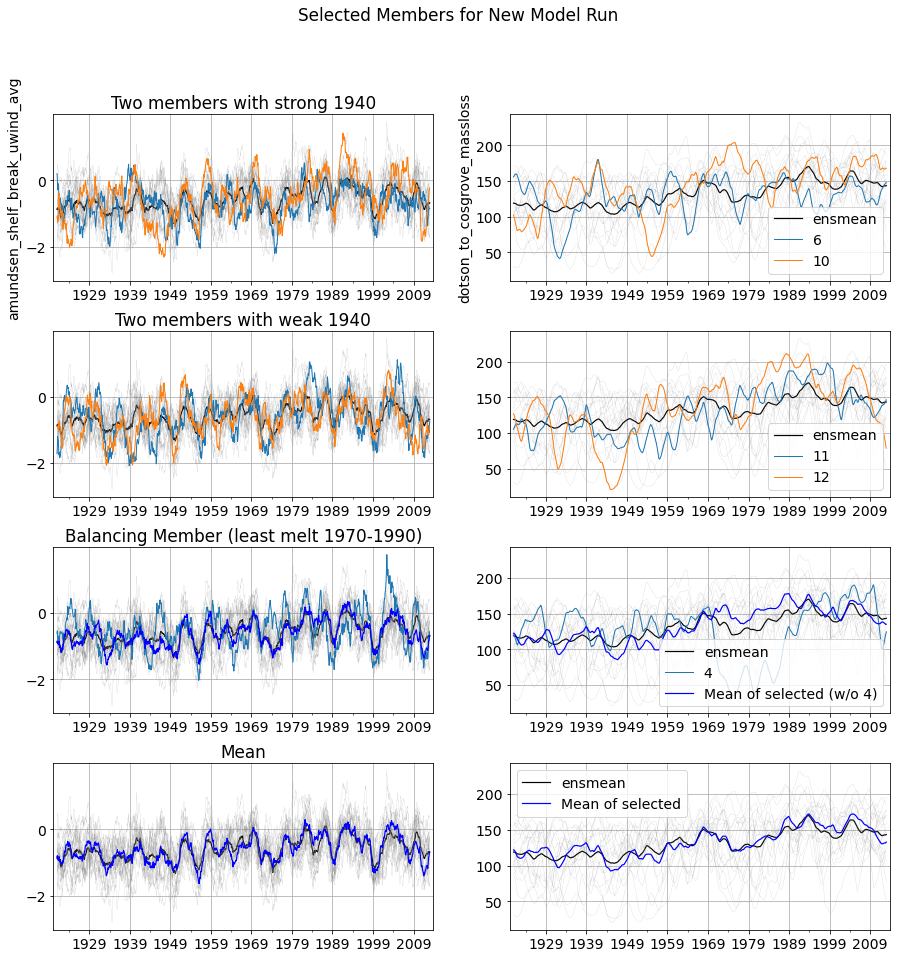

In [45]:
wishlist=[11, 12, 6, 10, 4]


print((total['dotson_to_cosgrove_massloss']['1940':'1941'].mean()-total['dotson_to_cosgrove_massloss']['1938':'1939'].mean()).sort_values())
print(total['dotson_to_cosgrove_massloss']['1970':'1990'].mean().sort_values())


plt.figure(figsize=(15,15))
plt.suptitle('Selected Members for New Model Run')
wishlist=[6, 10]#, 11, 12,  4]

plt.subplot(4,2,1)
plt.title('Two members with strong 1940')
total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean().plot(c='k', linewidth=1.2, label='ensmean')
for i in range(20):
    total['amundsen_shelf_break_uwind_avg']['1920':'2013']['ens'+str(i+1).zfill(2)].rolling(24, center=True).mean().plot(c='grey', linewidth=0.1, label='')
for i in wishlist:
    total['amundsen_shelf_break_uwind_avg']['1920':'2013']['ens'+str(i).zfill(2)].rolling(24, center=True).mean().plot(linewidth=1, label=str(i))

# wl=['ens'+str(i).zfill(2) for i in wishlist]
# total['amundsen_shelf_break_uwind_avg']['1920':'2013'][wl].mean(axis=1).rolling(24, center=True).mean().plot(c='b', linewidth=1.2, label='Mean of selected')   

plt.grid(True)
#plt.legend()
plt.ylabel('amundsen_shelf_break_uwind_avg')
plt.subplot(4,2,2)
total['dotson_to_cosgrove_massloss']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean().plot(c='k', linewidth=1.2, label='ensmean')
for i in range(20):
    total['dotson_to_cosgrove_massloss']['1920':'2013']['ens'+str(i+1).zfill(2)].rolling(24, center=True).mean().plot(c='grey', linewidth=0.1, label='')
for i in wishlist:
    total['dotson_to_cosgrove_massloss']['1920':'2013']['ens'+str(i).zfill(2)].rolling(24, center=True).mean().plot(linewidth=1, label=str(i))
# total['dotson_to_cosgrove_massloss']['1920':'2013'][wl].mean(axis=1).rolling(24, center=True).mean().plot(c='b', linewidth=1.2,label='Mean of selected')
plt.grid(True)
plt.ylabel('dotson_to_cosgrove_massloss')
plt.legend()


plt.subplot(4,2,3)
plt.title('Two members with weak 1940')
wishlist=[11, 12]
total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean().plot(c='k', linewidth=1.2, label='ensmean')
for i in range(20):
    total['amundsen_shelf_break_uwind_avg']['1920':'2013']['ens'+str(i+1).zfill(2)].rolling(24, center=True).mean().plot(c='grey', linewidth=0.1, label='')
for i in wishlist:
    total['amundsen_shelf_break_uwind_avg']['1920':'2013']['ens'+str(i).zfill(2)].rolling(24, center=True).mean().plot(linewidth=1, label=str(i))

# wl=['ens'+str(i).zfill(2) for i in wishlist]
# total['amundsen_shelf_break_uwind_avg']['1920':'2013'][wl].mean(axis=1).rolling(24, center=True).mean().plot(c='b', linewidth=1.2, label='Mean of selected')   

plt.grid(True)
#plt.legend()
#plt.ylabel('amundsen_shelf_break_uwind_avg')
plt.subplot(4,2,4)
total['dotson_to_cosgrove_massloss']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean().plot(c='k', linewidth=1.2, label='ensmean')
for i in range(20):
    total['dotson_to_cosgrove_massloss']['1920':'2013']['ens'+str(i+1).zfill(2)].rolling(24, center=True).mean().plot(c='grey', linewidth=0.1, label='')
for i in wishlist:
    total['dotson_to_cosgrove_massloss']['1920':'2013']['ens'+str(i).zfill(2)].rolling(24, center=True).mean().plot(linewidth=1, label=str(i))
# total['dotson_to_cosgrove_massloss']['1920':'2013'][wl].mean(axis=1).rolling(24, center=True).mean().plot(c='b', linewidth=1.2,label='Mean of selected')
plt.grid(True)
#plt.ylabel('dotson_to_cosgrove_massloss')
plt.legend()


plt.subplot(4,2,5)
plt.title('Balancing Member (least melt 1970-1990)')
wishlist=[11, 12, 6, 10]
total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean().plot(c='k', linewidth=1.2, label='ensmean')
for i in range(20):
    total['amundsen_shelf_break_uwind_avg']['1920':'2013']['ens'+str(i+1).zfill(2)].rolling(24, center=True).mean().plot(c='grey', linewidth=0.1, label='')
for i in [4]:
    total['amundsen_shelf_break_uwind_avg']['1920':'2013']['ens'+str(i).zfill(2)].rolling(24, center=True).mean().plot(linewidth=1, label=str(i))

wl=['ens'+str(i).zfill(2) for i in wishlist]
total['amundsen_shelf_break_uwind_avg']['1920':'2013'][wl].mean(axis=1).rolling(24, center=True).mean().plot(c='b', linewidth=1.2, label='Mean of selected (w/o 4)')   

plt.grid(True)
#plt.legend()
#plt.ylabel('amundsen_shelf_break_uwind_avg')
plt.subplot(4,2,6)
total['dotson_to_cosgrove_massloss']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean().plot(c='k', linewidth=1.2, label='ensmean')
for i in range(20):
    total['dotson_to_cosgrove_massloss']['1920':'2013']['ens'+str(i+1).zfill(2)].rolling(24, center=True).mean().plot(c='grey', linewidth=0.1, label='')
for i in [4]:
    total['dotson_to_cosgrove_massloss']['1920':'2013']['ens'+str(i).zfill(2)].rolling(24, center=True).mean().plot(linewidth=1, label=str(i))
total['dotson_to_cosgrove_massloss']['1920':'2013'][wl].mean(axis=1).rolling(24, center=True).mean().plot(c='b', linewidth=1.2,label='Mean of selected (w/o 4)')
plt.grid(True)
#plt.ylabel('dotson_to_cosgrove_massloss')
plt.legend()





plt.subplot(4,2,7)
plt.title('Mean')
wishlist=[11, 12, 6, 10, 4]
total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean().plot(c='k', linewidth=1.2, label='ensmean')
for i in range(20):
    total['amundsen_shelf_break_uwind_avg']['1920':'2013']['ens'+str(i+1).zfill(2)].rolling(24, center=True).mean().plot(c='grey', linewidth=0.1, label='')
# for i in wishlist:
#     total['amundsen_shelf_break_uwind_avg']['1920':'2013']['ens'+str(i).zfill(2)].rolling(24, center=True).mean().plot(linewidth=1, label=str(i))

wl=['ens'+str(i).zfill(2) for i in wishlist]
total['amundsen_shelf_break_uwind_avg']['1920':'2013'][wl].mean(axis=1).rolling(24, center=True).mean().plot(c='b', linewidth=1.2, label='Mean of selected')   

plt.grid(True)
#plt.legend()
#plt.ylabel('amundsen_shelf_break_uwind_avg')
plt.subplot(4,2,8)
total['dotson_to_cosgrove_massloss']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean().plot(c='k', linewidth=1.2, label='ensmean')
for i in range(20):
    total['dotson_to_cosgrove_massloss']['1920':'2013']['ens'+str(i+1).zfill(2)].rolling(24, center=True).mean().plot(c='grey', linewidth=0.1, label='')
# for i in wishlist:
#     total['dotson_to_cosgrove_massloss']['1920':'2013']['ens'+str(i).zfill(2)].rolling(24, center=True).mean().plot(linewidth=1, label=str(i))
total['dotson_to_cosgrove_massloss']['1920':'2013'][wl].mean(axis=1).rolling(24, center=True).mean().plot(c='b', linewidth=1.2,label='Mean of selected')
plt.grid(True)
#plt.ylabel('dotson_to_cosgrove_massloss')
plt.legend()


plt.subplots_adjust(hspace=0.3)
plt.savefig('/data/hpcdata/users/grejan/mitgcm/03_output/new_run/selection.png')

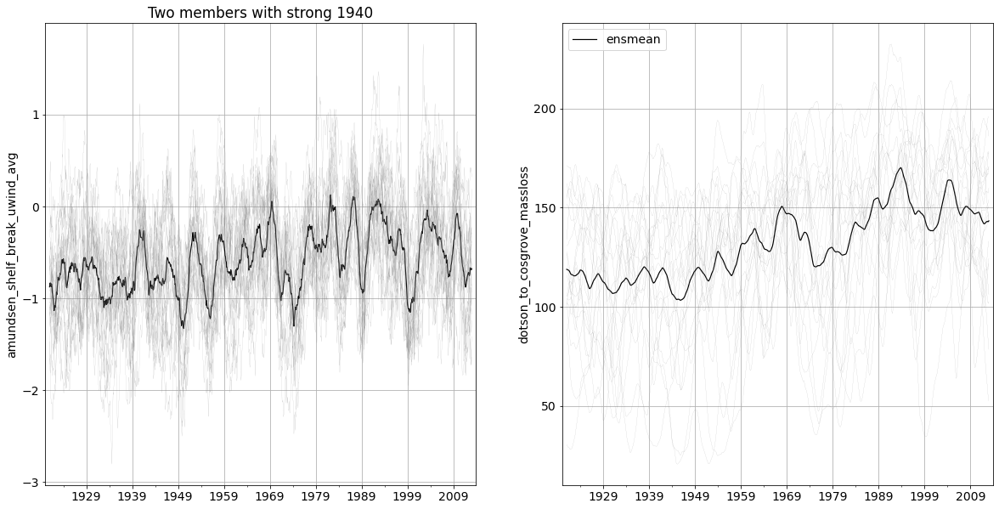

In [70]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.title('Two members with strong 1940')
total['amundsen_shelf_break_uwind_avg']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean().plot(c='k', linewidth=1.2, label='ensmean')
for i in range(20):
    total['amundsen_shelf_break_uwind_avg']['1920':'2013']['ens'+str(i+1).zfill(2)].rolling(24, center=True).mean().plot(c='grey', linewidth=0.1, label='')
# for i in wishlist:
#     total['amundsen_shelf_break_uwind_avg']['1920':'2013']['ens'+str(i).zfill(2)].rolling(24, center=True).mean().plot(linewidth=1, label=str(i))

# wl=['ens'+str(i).zfill(2) for i in wishlist]
# total['amundsen_shelf_break_uwind_avg']['1920':'2013'][wl].mean(axis=1).rolling(24, center=True).mean().plot(c='b', linewidth=1.2, label='Mean of selected')   

plt.grid(True)
#plt.legend()
plt.ylabel('amundsen_shelf_break_uwind_avg')
plt.subplot(1,2,2)
total['dotson_to_cosgrove_massloss']['1920':'2013'].mean(axis=1).rolling(24, center=True).mean().plot(c='k', linewidth=1.2, label='ensmean')
for i in range(20):
    total['dotson_to_cosgrove_massloss']['1920':'2013']['ens'+str(i+1).zfill(2)].rolling(24, center=True).mean().plot(c='grey', linewidth=0.1, label='')
# for i in wishlist:
#     total['dotson_to_cosgrove_massloss']['1920':'2013']['ens'+str(i).zfill(2)].rolling(24, center=True).mean().plot(linewidth=1, label=str(i))
# # total['dotson_to_cosgrove_massloss']['1920':'2013'][wl].mean(axis=1).rolling(24, center=True).mean().plot(c='b', linewidth=1.2,label='Mean of selected')
plt.grid(True)
plt.ylabel('dotson_to_cosgrove_massloss')
plt.legend()

In [ ]:
#01 MAKE CROSS SECTIONS A LA ALESSANDRO
lon=115
#dataS=loadMITgcmData(filename='SALT_W'+str(lon), members='all', kind='slices')
dataT=loadMITgcmData(filename='THETA_W'+str(lon), members='all', kind='slices')
dataT=dataT.where(dataT!=0, drop=True)

In [20]:
cindfile='IPO_NOAA_unfiltered.txt' 
path='../data/'
cind=pd.read_csv(os.path.join(path, cindfile), names=range(1,13), skiprows=1, skipfooter=11, delim_whitespace=True)
cind=cind.replace(-99.000, np.nan)
cind=cind.replace(-99.99, np.nan)

cind=cind.stack()
cind.index=[pd.to_datetime(str(j)+'-'+str(i)) for i, j in cind.index]

UW115=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/undercurrent_W115.nc')
UW115['time']=UW115.indexes['time'].to_datetimeindex()

adv={}
for loc in ['UW115', 'PITE', 'coastal']:
    if loc=='UW115':
        adv[loc]=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/undercurrent_W115.nc')
        #adv[loc]['time']=adv[loc].indexes['time'].to_datetimeindex()
    else:
        adv[loc]=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/ADVy_TH_'+loc+'.nc')
        adv[loc]['time']=adv[loc].indexes['time'].to_datetimeindex()
        adv[loc+'_bottom100m']=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/ADVy_TH_'+loc+'_bottom100m.nc')
        adv[loc+'_bottom100m']['time']=adv[loc+'_bottom100m'].indexes['time'].to_datetimeindex()


#baroc=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/baroclinicity_slope_farfield_W115.nc')       
#baroc=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/baroclinicity_slope_lower_W115.nc')       
#baroc=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/baroclinicity_slope_W115.nc')
baroc=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/baroclinicity_W115.nc')
try:
    baroc['time']=baroc.indexes['time'].to_datetimeindex()
except:
    print('Already Datetime')
    
#curlTAU=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/curlTAU_for_undercurrent.nc')
curlTAU=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/curlTAU_for_undercurrent_new.nc')
curlTAU['time']=curlTAU.indexes['time'].to_datetimeindex()

/tmp/ipykernel_10533/1676372778.py:3: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  cind=pd.read_csv(os.path.join(path, cindfile), names=range(1,13), skiprows=1, skipfooter=11, delim_whitespace=True)
/tmp/ipykernel_10533/1676372778.py:11: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  UW115['time']=UW115.indexes['time'].to_datetimeindex()
/tmp/ipykernel_10533/1676372778.py:20: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  adv[loc]['time']=adv[loc].in

In [17]:
adv['UW115'].mean(dim='ens')>adv['UW115'].mean(dim='ens').quantile(0.9)

<xarray.DataArray 'UVEL' (time: 1488)>
array([False, False, False, ..., False, False, False])
Coordinates:
    iter      (time) int64 ...
  * time      (time) object 1890-02-01 00:00:00 ... 2014-01-01 00:00:00
    XG        float32 ...
    quantile  float64 0.9

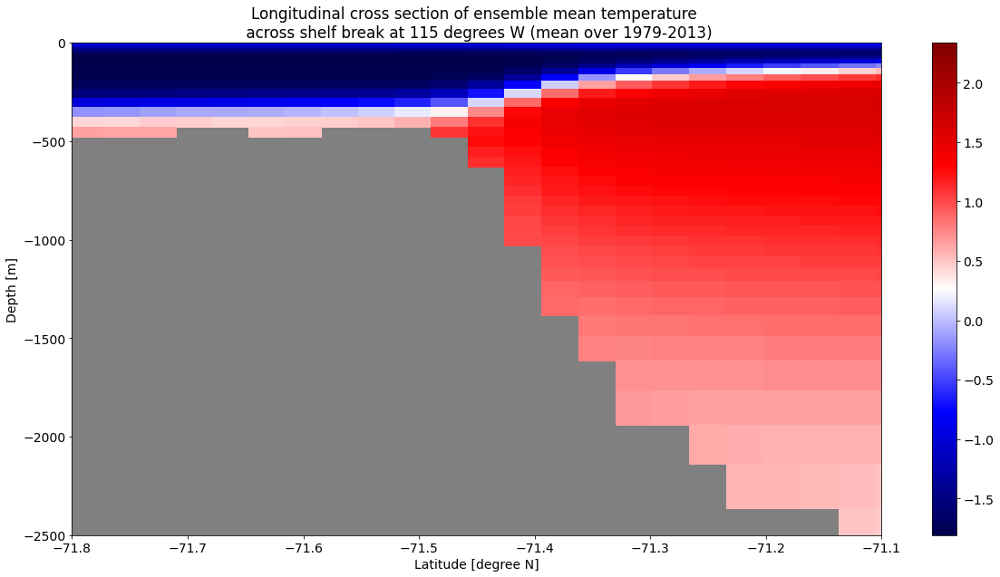

In [9]:
#01 Ensemble Mean Temperature
plt.figure(figsize=(20,10))
ax=plt.subplot(1,1,1)
ax.set_title('Longitudinal cross section of ensemble mean temperature \n across shelf break at '+str(lon)+' degrees W (mean over 1979-2013)')
img=ax.pcolor(dataT.YC, dataT.Z, dataT['THETA'].mean(dim='ens').sel(time=slice('1979', '2013')).mean(dim='time'), cmap='seismic', vmin=-2.5, vmax=2.5)
plt.colorbar(img)
ax.set_xlim([-71.8, -71.1])
#ax.set_xlim([-73, -72])
ax.set_ylim([-2500, 0])
ax.set_ylabel('Depth [m]')
ax.set_xlabel('Latitude [degree N]')
ax.set_facecolor('grey')
#plt.savefig('/data/hpcdata/users/grejan/mitgcm/03_output/slices/RHO_W'+str(lon)+'_ensemble_mean_1979-2013.png')
plt.show()

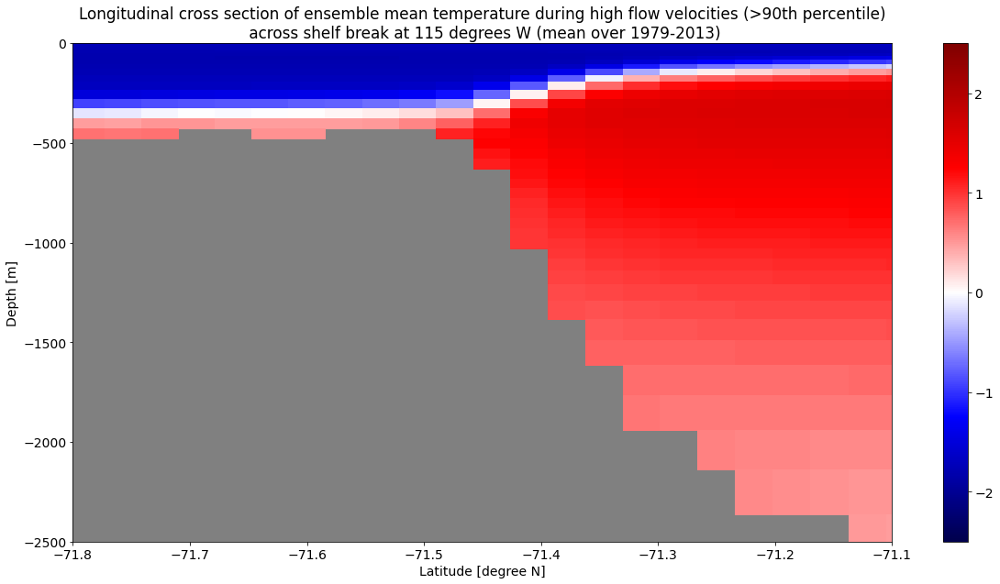

In [18]:
#01 Ensemble Mean Temperature during High Flow Velocities.
plt.figure(figsize=(20,10))
ax=plt.subplot(1,1,1)
ax.set_title('Longitudinal cross section of ensemble mean temperature during high flow velocities (>90th percentile)\n across shelf break at '+str(lon)+' degrees W (mean over 1979-2013)')
img=ax.pcolor(dataT.YC, dataT.Z, dataT['THETA'].mean(dim='ens')[adv['UW115'].mean(dim='ens')>adv['UW115'].mean(dim='ens').quantile(0.9)].sel(time=slice('1979', '2013')).mean(dim='time'), cmap='seismic', vmin=-2.5, vmax=2.5)
plt.colorbar(img)
ax.set_xlim([-71.8, -71.1])
#ax.set_xlim([-73, -72])
ax.set_ylim([-2500, 0])
ax.set_ylabel('Depth [m]')
ax.set_xlabel('Latitude [degree N]')
ax.set_facecolor('grey')
#plt.savefig('/data/hpcdata/users/grejan/mitgcm/03_output/slices/RHO_W'+str(lon)+'_ensemble_mean_1979-2013.png')
plt.show()

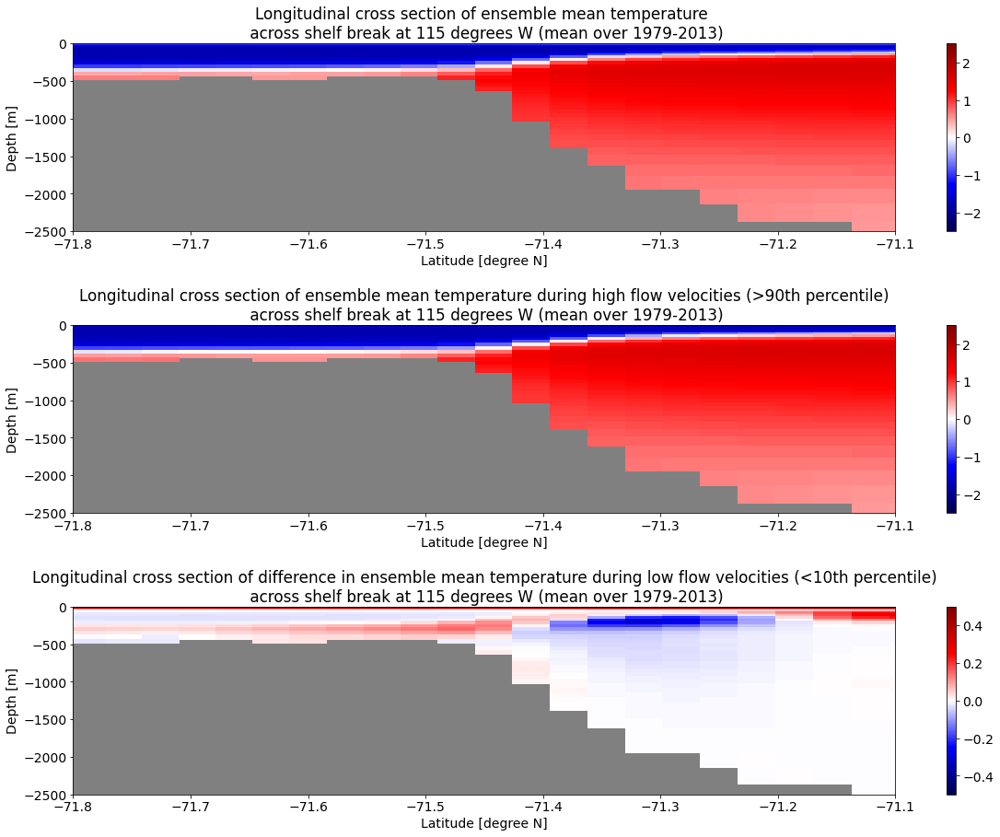

In [47]:
#01 Ensemble Mean Temperature difference between High Flow Velocities.
plt.figure(figsize=(20,15))

ax=plt.subplot(3,1,1)
ax.set_title('Longitudinal cross section of ensemble mean temperature \n across shelf break at '+str(lon)+' degrees W (mean over 1979-2013)')
img=ax.pcolor(dataT.YC, dataT.Z, dataT['THETA'].mean(dim='ens').sel(time=slice('1979', '2013')).mean(dim='time'), cmap='seismic', vmin=-2.5, vmax=2.5)
plt.colorbar(img)
ax.set_xlim([-71.8, -71.1])
#ax.set_xlim([-73, -72])
ax.set_ylim([-2500, 0])
ax.set_ylabel('Depth [m]')
ax.set_xlabel('Latitude [degree N]')
ax.set_facecolor('grey')

ax=plt.subplot(3,1,2)
ax.set_title('Longitudinal cross section of ensemble mean temperature during high flow velocities (>90th percentile)\n across shelf break at '+str(lon)+' degrees W (mean over 1979-2013)')
img=ax.pcolor(dataT.YC, dataT.Z, dataT['THETA'].mean(dim='ens')[adv['UW115'].mean(dim='ens')>adv['UW115'].mean(dim='ens').quantile(0.9)].sel(time=slice('1979', '2013')).mean(dim='time'), cmap='seismic', vmin=-2.5, vmax=2.5)
plt.colorbar(img)
ax.set_xlim([-71.8, -71.1])
#ax.set_xlim([-73, -72])
ax.set_ylim([-2500, 0])
ax.set_ylabel('Depth [m]')
ax.set_xlabel('Latitude [degree N]')
ax.set_facecolor('grey')

# ax=plt.subplot(3,1,3)
# ax.set_title('Longitudinal cross section of difference in ensemble mean temperature during high flow velocities (>90th percentile)\n across shelf break at '+str(lon)+' degrees W (mean over 1979-2013)')
# img=ax.pcolor(dataT.YC, dataT.Z, dataT['THETA'].mean(dim='ens')[adv['UW115'].mean(dim='ens')>adv['UW115'].mean(dim='ens').quantile(0.9)].sel(time=slice('1979', '2013')).mean(dim='time')
#               -dataT['THETA'].mean(dim='ens').sel(time=slice('1979', '2013')).mean(dim='time'), cmap='seismic', vmin=-0.5, vmax=0.5)
# plt.colorbar(img)
# ax.set_xlim([-71.8, -71.1])
# #ax.set_xlim([-73, -72])
# ax.set_ylim([-2500, 0])
# ax.set_ylabel('Depth [m]')
# ax.set_xlabel('Latitude [degree N]')
# ax.set_facecolor('grey')

ax=plt.subplot(3,1,3)
ax.set_title('Longitudinal cross section of difference in ensemble mean temperature during low flow velocities (<10th percentile)\n across shelf break at '+str(lon)+' degrees W (mean over 1979-2013)')
img=ax.pcolor(dataT.YC, dataT.Z, dataT['THETA'].mean(dim='ens')[adv['UW115'].mean(dim='ens')<adv['UW115'].mean(dim='ens').quantile(0.1)].sel(time=slice('1979', '2013')).mean(dim='time')
              -dataT['THETA'].mean(dim='ens').sel(time=slice('1979', '2013')).mean(dim='time'), cmap='seismic', vmin=-0.5, vmax=0.5)
plt.colorbar(img)
ax.set_xlim([-71.8, -71.1])
#ax.set_xlim([-73, -72])
ax.set_ylim([-2500, 0])
ax.set_ylabel('Depth [m]')
ax.set_xlabel('Latitude [degree N]')
ax.set_facecolor('grey')

#plt.savefig('/data/hpcdata/users/grejan/mitgcm/03_output/slices/RHO_W'+str(lon)+'_ensemble_mean_1979-2013.png')

plt.subplots_adjust(wspace=0.3, hspace=0.5)

In [23]:
from functions.loading_and_processing_data import loadMITgcmData, loadPACEData, detrend_and_average_MITgcmData, read_all_data
from functions.composite_maps import createCompositeMap, createVelocityCompositeMap, defineEvents, findEvents, createCompositeMap_2, workflowCompositeMap
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt


var='curlTAU'
data=xr.open_dataset('../02_data/maps/curlTAU_ensmean.nc')

varx='oceTAUX'
vary='oceTAUY'

dataU=xr.open_dataset('../02_data/maps/oceTAUX_ensmean.nc')
dataV=xr.open_dataset('../02_data/maps/oceTAUY_ensmean.nc')

dataU=dataU.where(dataU!=0, drop=True)
dataV=dataV.where(dataV!=0, drop=True)
data=data.where(data!=0, drop=True)


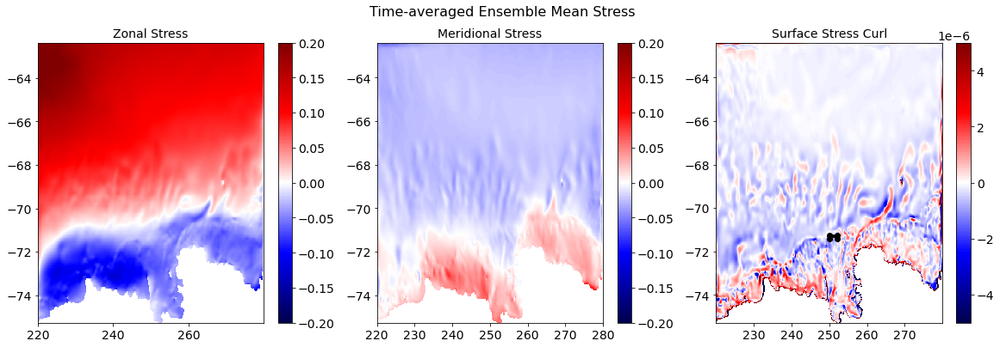

In [43]:
plt.figure(figsize=(20,6))
plt.suptitle('Time-averaged Ensemble Mean Stress', fontsize=16)
plt.subplot(1,3,1)
plt.pcolor(dataU.XG, dataU.YC, dataU[varx].mean(dim='time'), cmap='seismic', vmin=-0.2, vmax=0.2)
plt.colorbar()
plt.title('Zonal Stress', fontsize=14)
plt.subplot(1,3,2)
plt.pcolor(dataV.XC, dataV.YG, dataV[vary].mean(dim='time'), cmap='seismic', vmin=-0.2, vmax=0.2)
plt.colorbar()
plt.title('Meridional Stress', fontsize=14)
plt.subplot(1,3,3)
plt.pcolor(data.XG, data.YG, data[var].mean(dim='time'), cmap='seismic', vmin=-5e-6, vmax=5e-6)
plt.colorbar()
plt.title('Surface Stress Curl', fontsize=14)
plt.plot([250, 252, 250, 252], [-71.4, -71.25, -71.25, -71.4], 'o-k')
plt.subplots_adjust(hspace=0.5)

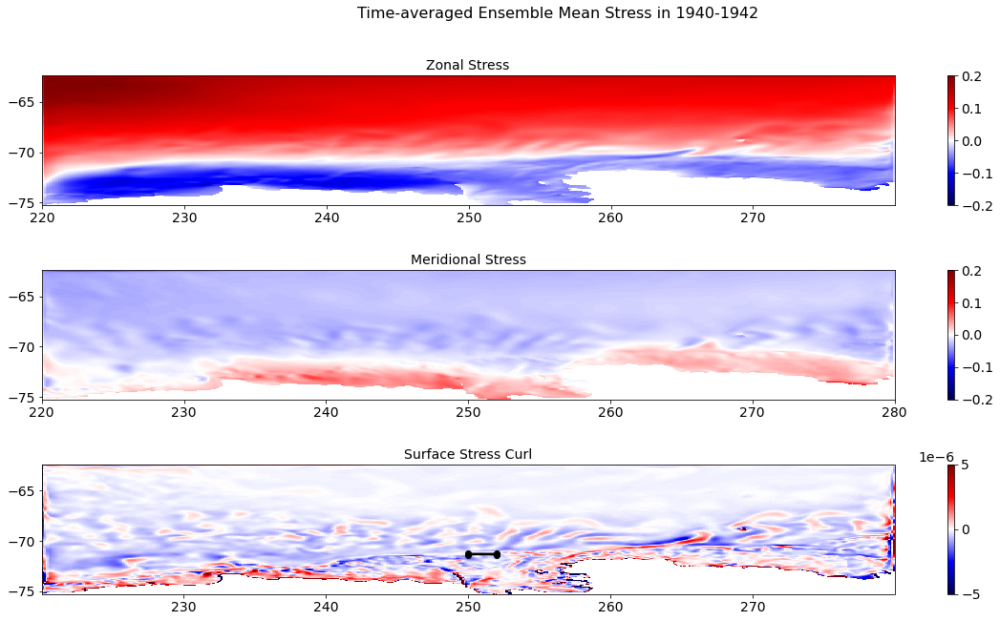

In [36]:
plt.figure(figsize=(20,10))
plt.suptitle('Time-averaged Ensemble Mean Stress in 1940-1942', fontsize=16)
plt.subplot(3,1,1)
plt.pcolor(dataU.XG, dataU.YC, dataU[varx].sel(time=slice('1940', '1942')).mean(dim='time'), cmap='seismic', vmin=-0.2, vmax=0.2)
plt.colorbar()
plt.title('Zonal Stress', fontsize=14)
plt.subplot(3,1,2)
plt.pcolor(dataV.XC, dataV.YG, dataV[vary].sel(time=slice('1940', '1942')).mean(dim='time'), cmap='seismic', vmin=-0.2, vmax=0.2)
plt.colorbar()
plt.title('Meridional Stress', fontsize=14)
plt.subplot(3,1,3)
plt.pcolor(data.XG, data.YG, data[var].sel(time=slice('1940', '1942')).mean(dim='time'), cmap='seismic', vmin=-5e-6, vmax=5e-6)
plt.colorbar()
plt.title('Surface Stress Curl', fontsize=14)
plt.plot([250, 252, 250, 252], [-71.4, -71.25, -71.25, -71.4], 'o-k')
plt.subplots_adjust(hspace=0.5)

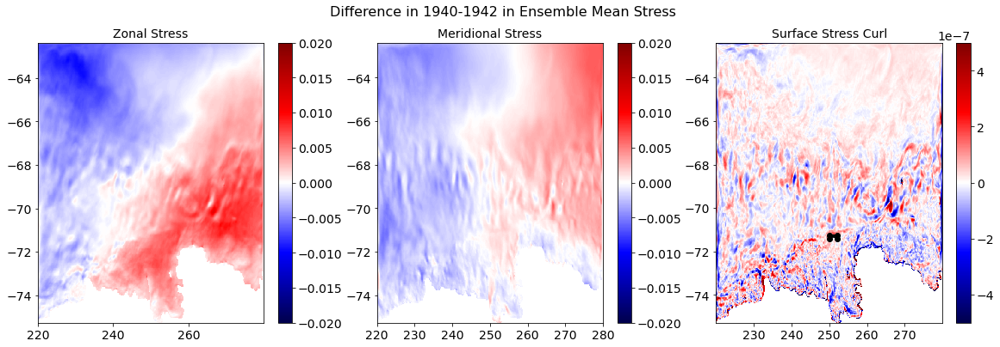

In [44]:
plt.figure(figsize=(20,6))
plt.suptitle('Difference in 1940-1942 in Ensemble Mean Stress', fontsize=16)
plt.subplot(1,3,1)
plt.pcolor(dataU.XG, dataU.YC, dataU[varx].sel(time=slice('1940', '1942')).mean(dim='time')-dataU[varx].mean(dim='time'), cmap='seismic', vmin=-0.02, vmax=0.02)
plt.colorbar()
plt.title('Zonal Stress', fontsize=14)
plt.subplot(1,3,2)
plt.pcolor(dataV.XC, dataV.YG, dataV[vary].sel(time=slice('1940', '1942')).mean(dim='time')-dataV[vary].mean(dim='time'), cmap='seismic', vmin=-0.02, vmax=0.02)
plt.colorbar()
plt.title('Meridional Stress', fontsize=14)
plt.subplot(1,3,3)
plt.pcolor(data.XG, data.YG, data[var].sel(time=slice('1940', '1942')).mean(dim='time')-data[var].mean(dim='time'), cmap='seismic', vmin=-5e-7, vmax=5e-7)
plt.colorbar()
plt.title('Surface Stress Curl', fontsize=14)
plt.plot([250, 252, 250, 252], [-71.4, -71.25, -71.25, -71.4], 'o-k')
plt.subplots_adjust(hspace=0.5)


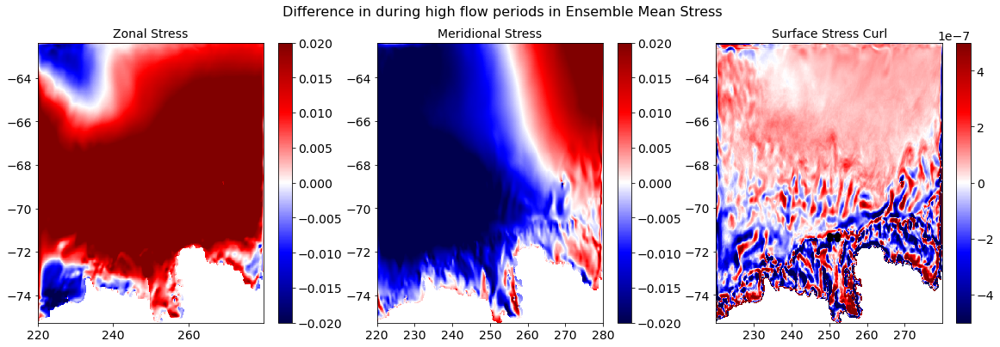

In [45]:
plt.figure(figsize=(20,6))
plt.suptitle('Difference in during high flow periods in Ensemble Mean Stress', fontsize=16)
plt.subplot(1,3,1)
plt.pcolor(dataU.XG, dataU.YC, dataU[varx][adv['UW115'].mean(dim='ens').drop('XG')>adv['UW115'].mean(dim='ens').drop('XG').quantile(0.9)].mean(dim='time')-dataU[varx].mean(dim='time'), cmap='seismic', vmin=-0.02, vmax=0.02)
plt.colorbar()
plt.title('Zonal Stress', fontsize=14)
plt.subplot(1,3,2)
plt.pcolor(dataV.XC, dataV.YG, dataV[vary][adv['UW115'].mean(dim='ens').drop('XG')>adv['UW115'].mean(dim='ens').drop('XG').quantile(0.9)].mean(dim='time')-dataV[vary].mean(dim='time'), cmap='seismic', vmin=-0.02, vmax=0.02)
plt.colorbar()
plt.title('Meridional Stress', fontsize=14)
plt.subplot(1,3,3)
plt.pcolor(data.XG, data.YG, data[var][adv['UW115'].mean(dim='ens').drop('XG')>adv['UW115'].mean(dim='ens').drop('XG').quantile(0.9)].mean(dim='time')-data[var].mean(dim='time'), cmap='seismic', vmin=-5e-7, vmax=5e-7)
plt.colorbar()
plt.title('Surface Stress Curl', fontsize=14)
plt.plot([250, 252, 250, 252], [-71.4, -71.25, -71.25, -71.4], 'o-k')
plt.subplots_adjust(hspace=0.5)

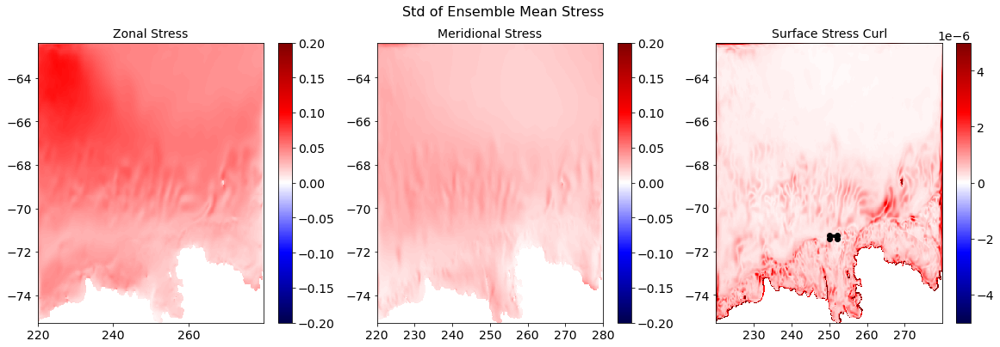

In [46]:
plt.figure(figsize=(20,6))
plt.suptitle('Std of Ensemble Mean Stress', fontsize=16)
plt.subplot(1,3,1)
plt.pcolor(dataU.XG, dataU.YC, dataU[varx].std(dim='time'), cmap='seismic', vmin=-0.2, vmax=0.2)
plt.colorbar()
plt.title('Zonal Stress', fontsize=14)
plt.subplot(1,3,2)
plt.pcolor(dataV.XC, dataV.YG, dataV[vary].std(dim='time'), cmap='seismic', vmin=-0.2, vmax=0.2)
plt.colorbar()
plt.title('Meridional Stress', fontsize=14)
plt.subplot(1,3,3)
plt.pcolor(data.XG, data.YG, data[var].std(dim='time'), cmap='seismic', vmin=-5e-6, vmax=5e-6)
plt.colorbar()
plt.title('Surface Stress Curl', fontsize=14)
plt.plot([250, 252, 250, 252], [-71.4, -71.25, -71.25, -71.4], 'o-k')
plt.subplots_adjust(hspace=0.5)

In [3]:
varx='EXFuwind'
vary='EXFvwind'

dataU=xr.open_dataset('../02_data/maps/EXFuwind_ensmean.nc')
dataV=xr.open_dataset('../02_data/maps/EXFvwind_ensmean.nc')

Text(0.5, 1.0, 'Meridional Wind')

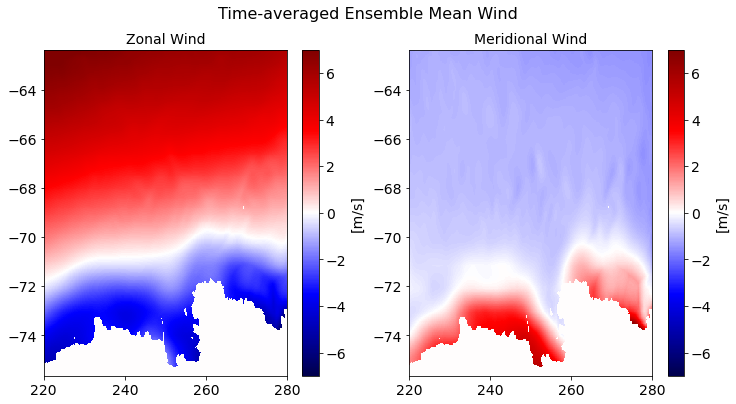

In [4]:
plt.figure(figsize=(12,6))
plt.suptitle('Time-averaged Ensemble Mean Wind', fontsize=16)
plt.subplot(1,2,1)
plt.pcolor(dataU.XC, dataU.YC, dataU[varx].mean(dim='time'), cmap='seismic', vmin=-7, vmax=7)
plt.colorbar(label='[m/s]')
plt.title('Zonal Wind', fontsize=14)
plt.subplot(1,2,2)
plt.pcolor(dataV.XC, dataV.YC, dataV[vary].mean(dim='time'), cmap='seismic', vmin=-7, vmax=7)
plt.colorbar(label='[m/s]')
plt.title('Meridional Wind', fontsize=14)

Text(0.5, 1.0, 'Meridional Wind')

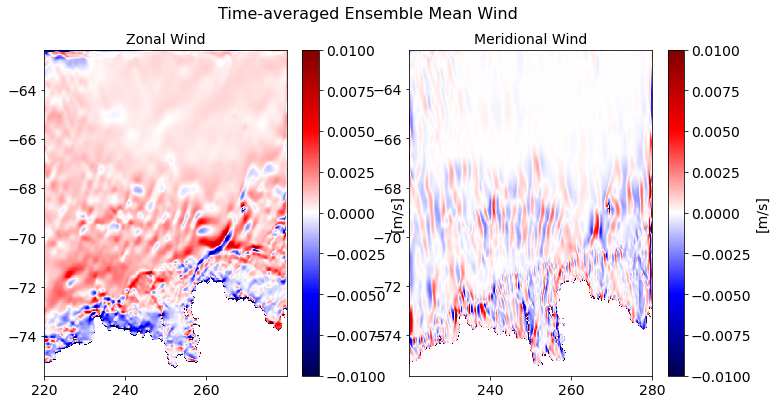

In [49]:
# plt.figure(figsize=(12,6))
# plt.suptitle('Time-averaged Ensemble Mean Wind', fontsize=16)
# plt.subplot(1,2,1)
# plt.pcolor(dataU.XC, dataU.YC[1:], dataU[varx].diff('YC').mean(dim='time'), cmap='seismic', vmin=-0.1, vmax=0.1)
# plt.colorbar(label='[m/s]')
# plt.title('Zonal Wind', fontsize=14)
# plt.subplot(1,2,2)
# plt.pcolor(dataV.XC[1:], dataV.YC, dataV[vary].diff('XC').mean(dim='time'), cmap='seismic', vmin=-0.1, vmax=0.1)
# plt.colorbar(label='[m/s]')
# plt.title('Meridional Wind', fontsize=14)

plt.figure(figsize=(12,6))
plt.suptitle('Time-averaged Ensemble Mean Wind', fontsize=16)
plt.subplot(1,2,1)
plt.pcolor(dataU.XC, dataU.YC[1:], dataU[varx].diff('YC').mean(dim='time'), cmap='seismic', vmin=-0.01, vmax=0.01)
plt.colorbar(label='[m/s]')
plt.title('Zonal Wind', fontsize=14)
plt.subplot(1,2,2)
plt.pcolor(dataV.XC[1:], dataV.YC, dataV[vary].diff('XC').mean(dim='time'), cmap='seismic', vmin=-0.01, vmax=0.01)
plt.colorbar(label='[m/s]')
plt.title('Meridional Wind', fontsize=14)

In [69]:
# indU=dataU.sel(YC=slice(-71.4, -71.25), XC=slice(250, 252)).mean(dim='YC').mean(dim='XC')
# inddUdy=dataU.diff('YC').sel(YC=slice(-71.4, -71.25), XC=slice(250, 252)).mean(dim='YC').mean(dim='XC')
# indV=dataV.sel(YC=slice(-71.4, -71.25), XC=slice(250, 252)).mean(dim='YC').mean(dim='XC')
# inddVdx=dataV.diff('XC').sel(YC=slice(-71.4, -71.25), XC=slice(250, 252)).mean(dim='YC').mean(dim='XC')


varx='EXFuwind'
vary='EXFvwind'

# dataU=xr.open_dataset('../02_data/maps/EXFuwind_ensmean.nc')
# dataV=xr.open_dataset('../02_data/maps/EXFvwind_ensmean.nc')

# varx='oceTAUX'
# vary='oceTAUY'

dataU=xr.open_dataset('../02_data/maps/'+varx+'_ensmean.nc')
dataV=xr.open_dataset('../02_data/maps/'+vary+'_ensmean.nc')
if 'XG' in dataU.dims:
    dataU=dataU.rename({'XG':'XC'})
    dataV=dataV.rename({'YG':'YC'})
    
# indU=dataU.sel(YC=slice(-71.4, -71.25), XC=slice(250, 252)).mean(dim='YC').mean(dim='XC')
# inddUdy=dataU.diff('dYC').sel(YC=slice(-71.4, -71.25), XC=slice(250, 252)).mean(dim='YC').mean(dim='XC')
# indV=dataV.sel(YC=slice(-71.4, -71.25), XC=slice(250, 252)).mean(dim='YC').mean(dim='XC')
# inddVdx=dataV.diff('dXC').sel(YC=slice(-71.4, -71.25), XC=slice(250, 252)).mean(dim='YC').mean(dim='XC')

# indU=dataU.sel(YC=slice(-71.8, -70.2), XC=slice(360-115, 360-102)).mean(dim='YC').mean(dim='XC')
# inddUdy=dataU.diff('dYC').sel(YC=slice(-71.8, -70.2), XC=slice(360-115, 360-102)).mean(dim='YC').mean(dim='XC')
# indV=dataV.sel(YC=slice(-71.8, -70.2), XC=slice(360-115, 360-102)).mean(dim='YC').mean(dim='XC')
# inddVdx=dataV.diff('dXC').sel(YC=slice(-71.8, -70.2), XC=slice(360-115, 360-102)).mean(dim='YC').mean(dim='XC')

indU=dataU.sel(YC=slice(-73, -72), XC=slice(230, 240)).mean(dim='YC').mean(dim='XC')
inddUdy=dataU.diff('YC').sel(YC=slice(-73, -72), XC=slice(230, 240)).mean(dim='YC').mean(dim='XC')
indV=dataV.sel(YC=slice(-73, -72), XC=slice(230, 240)).mean(dim='YC').mean(dim='XC')
inddVdx=dataV.diff('XC').sel(YC=slice(-73, -72), XC=slice(230, 240)).mean(dim='YC').mean(dim='XC')

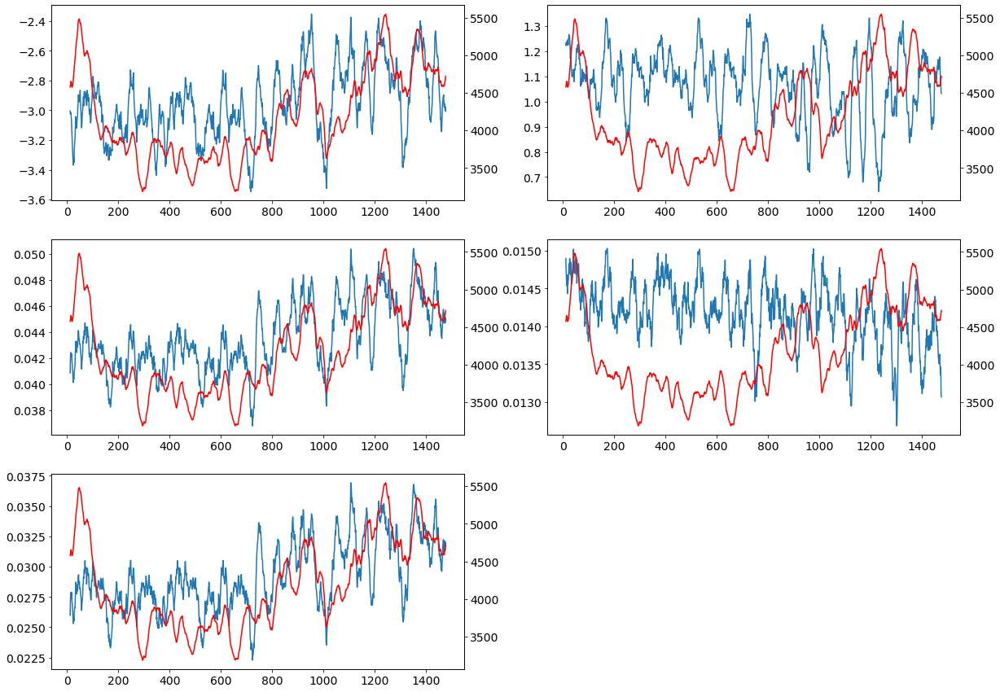

In [70]:
plt.figure(figsize=(20,15))
plt.subplot(3,2,1)
plt.plot(indU[varx].rolling(time=24, center=True).mean())
plt.twinx()
plt.plot(-1*adv['PITE'].mean(dim='ens').rolling(time=24, center=True).mean(), c='r')
plt.subplot(3,2,2)
plt.plot(indV[vary].rolling(time=24, center=True).mean())
plt.twinx()
plt.plot(-1*adv['PITE'].mean(dim='ens').rolling(time=24, center=True).mean(), c='r')
plt.subplot(3,2,3)
plt.plot(inddUdy[varx].rolling(time=24, center=True).mean())
plt.twinx()
plt.plot(-1*adv['PITE'].mean(dim='ens').rolling(time=24, center=True).mean(), c='r')
plt.subplot(3,2,4)
plt.plot(inddVdx[vary].rolling(time=24, center=True).mean())
plt.twinx()
plt.plot(-1*adv['PITE'].mean(dim='ens').rolling(time=24, center=True).mean(), c='r')
plt.subplot(3,2,5)
plt.plot((-inddVdx[vary]+inddUdy[varx]).rolling(time=24, center=True).mean())
plt.twinx()
plt.plot(-1*adv['PITE'].mean(dim='ens').rolling(time=24, center=True).mean(), c='r')

...Reading: ADVy_TH_PITE
...Detrending data
...Applying rolling mean
...Computing correlation coefficients
...Plotting


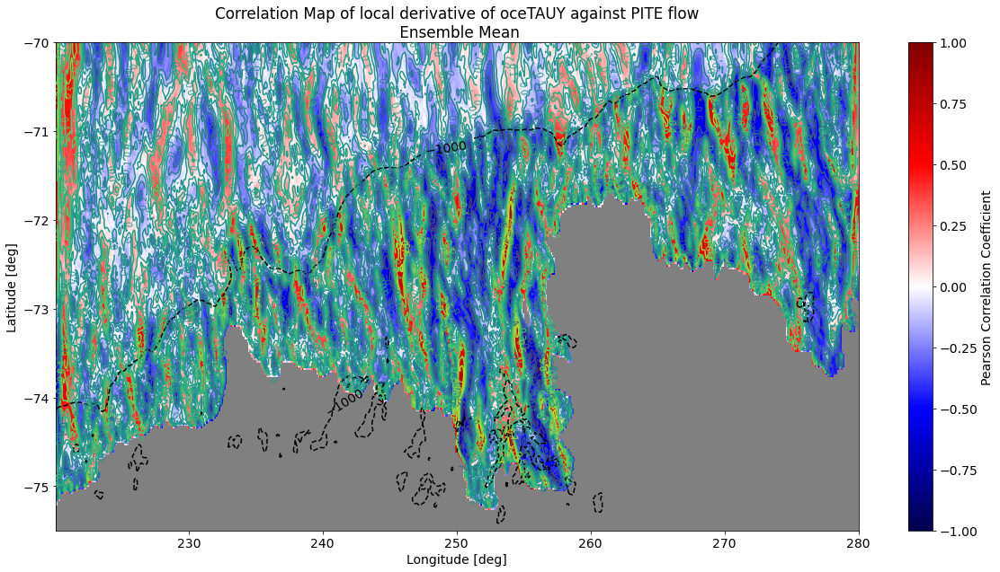

In [74]:
def simpleCorrelationMap(members='all',
                         data=None, datafn='EXFuwind', datavar='EXFuwind', datakind='maps',
                         ind=None, indfn='undercurrent_W115', indvar='UVEL',
                         detrend=True, window=24, title='Correlation Map', ymax=-70, save=False, savefn='test', cumulative=False,
                         give_back=False):
    
    plt.rcParams.update({'font.size': 14})
    if type(data)==type(None):
        data=loadMITgcmData(filename=datafn, members=members, kind=datakind)
    
    if type(ind)==type(None):
        print('...Reading: '+indfn)
        ind=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/'+indfn+'.nc')
        if members!='all':
            print('...Selecting member '+str(members[0]+1))
            ind=ind.sel(ens=[members[0]])
        
    if detrend==True:
        print('...Detrending data')
        data=detrend_and_average_MITgcmData(data, var=datavar, window=1)
        ind=ind.to_dataset()
        ind=detrend_and_average_MITgcmData(ind, var=indvar, window=1)
        
    if window!=1:
        print('...Applying rolling mean')
        data=data.rolling(time=window, center=True).mean()
        ind=ind.rolling(time=window, center=True).mean()
    
    print('...Computing correlation coefficients')
    if detrend==True:
        if cumulative==True:
            res=xr.corr(data.mean(dim='ens').cumsum(), ind.mean(dim='ens'), dim='time')
        else:
            res=xr.corr(data.mean(dim='ens'), ind.mean(dim='ens'), dim='time')
    else:
        res=xr.corr(data[datavar].mean(dim='ens'), ind.mean(dim='ens'), dim='time')
    
    print('...Plotting')
    fig, ax=plt.subplots(1,1, figsize=(20,10))
    
    if 'XG' in res.dims:
        res=res.rename({'XG':'XC'})
    if 'YG' in res.dims:
        res=res.rename({'YG':'YC'})
    
    if type(ymax)!=type(None):
        res=res.sel(YC=slice(-75.5, ymax))
        
    
    if members=='all':
        ax.set_title(title+'\n Ensemble Mean')
    else:
        ax.set_title(title+'\n Ensemble Member '+ str(members[-1]))
    
    img=ax.pcolor(res.XC, res.YC, res, cmap='seismic', vmin=-1, vmax=1)
    plt.colorbar(img, label='Pearson Correlation Coefficient')
    CS=ax.contour(res.XC, res.YC, res, np.arange(-1, 1, 0.1))
    ax.clabel(CS, CS.levels, inline=True,fontsize=10)
    
    gp='/data/oceans_output/shelf/kaight/mitgcm/PAS_grid/'
    grid = Grid(gp)
    bath=ax.contour(grid.lon_2d+360, grid.lat_2d, grid.bathy, levels=[-1000], colors=['black'])
    plt.clabel(bath, [-1000])
    if type(ymax)!=type(None):
        ax.set_ylim([-75.5, ymax])
    ax.set_facecolor('grey')
    ax.set_xlabel('Longitude [deg]')
    ax.set_ylabel('Latitude [deg]')
    if save==True:
        print('...Saving figure')
        from datetime import date
        today = date.today()
        today=today.strftime("%Y%m%d")
        if members=='all':
            fig.savefig('../03_output/correlation/'+today+'_cormap_'+savefn+'_ensmean.png')
        else:
            fig.savefig('../03_output/correlation/'+today+'_cormap_'+savefn+'_member'+str(members[-1])+'.png')
    
    if give_back==False:
        return
    else:
        return data, ind, res


    
import sys
sys.path.append('/data/hpcdata/users/grejan/mitgcm/') #Make sure we can also import Kaitlins code.
from mitgcm_python_master.grid import ERA5Grid, PACEGrid, Grid, dA_from_latlon, pierre_obs_grid
    
varx='EXFuwind'
vary='oceTAUY'

# dataU=xr.open_dataset('../02_data/maps/'+varx+'_ensmean.nc')

# simpleCorrelationMap(members='all',
#                      data=dataU.diff('YC').expand_dims('ens'), datafn=varx, datavar=varx, datakind='maps',
#                      ind=None, indfn='ADVy_TH_PITE', indvar='ADVy_TH',
#                      detrend=True, window=24, title='Correlation Map of local derivative of '+varx+' against PITE flow', ymax=-70, save=False, savefn='test', cumulative=False,
#                      give_back=False)

dataV=xr.open_dataset('../02_data/maps/'+vary+'_ensmean.nc')

simpleCorrelationMap(members='all',
                     data=dataV.diff('XC').expand_dims('ens'), datafn=vary, datavar=vary, datakind='maps',
                     ind=None, indfn='ADVy_TH_PITE', indvar='ADVy_TH',
                     detrend=True, window=24, title='Correlation Map of local derivative of '+vary+' against PITE flow', ymax=-70, save=False, savefn='test', cumulative=False,
                     give_back=False)

In [72]:
dataV

<xarray.Dataset>
Dimensions:   (time: 1488, YC: 384, XC: 600)
Coordinates:
    iter      (time) int64 ...
  * time      (time) object 1890-02-01 00:00:00 ... 2014-01-01 00:00:00
  * XC        (XC) float32 220.1 220.1 220.2 220.4 ... 279.6 279.8 279.9 280.0
  * YC        (YC) float32 -75.64 -75.61 -75.59 -75.56 ... -62.48 -62.44 -62.39
    Depth     (YC, XC) float32 ...
    rA        (YC, XC) float32 ...
Data variables:
    EXFvwind  (time, YC, XC) float32 ...

In [1]:
from functions.loading_and_processing_data import loadMITgcmData, loadPACEData, detrend_and_average_MITgcmData, read_all_data
from functions.composite_maps import createCompositeMap, createVelocityCompositeMap, defineEvents, findEvents, createCompositeMap_2, workflowCompositeMap
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt




Loading number:0
../data/new2_amundsen_shelf_temp_200to700_ens1.nc
Loading number:1
../data/new2_amundsen_shelf_temp_200to700_ens2.nc
Loading number:2
../data/new2_amundsen_shelf_temp_200to700_ens3.nc
Loading number:3
../data/new2_amundsen_shelf_temp_200to700_ens4.nc
Loading number:4
../data/new2_amundsen_shelf_temp_200to700_ens5.nc
Loading number:5
../data/new2_amundsen_shelf_temp_200to700_ens6.nc
Loading number:6
../data/new2_amundsen_shelf_temp_200to700_ens7.nc
Loading number:7
../data/new2_amundsen_shelf_temp_200to700_ens8.nc
Loading number:8
../data/new2_amundsen_shelf_temp_200to700_ens9.nc
Loading number:9
../data/new2_amundsen_shelf_temp_200to700_ens10.nc
Loading number:10
../data/new2_amundsen_shelf_temp_200to700_ens11.nc
Loading number:11
../data/new2_amundsen_shelf_temp_200to700_ens12.nc
Loading number:12
../data/new2_amundsen_shelf_temp_200to700_ens13.nc
Loading number:13
../data/new2_amundsen_shelf_temp_200to700_ens14.nc
Loading number:14
../data/new2_amundsen_shelf_temp_20

/tmp/ipykernel_41408/4258068172.py:14: UserWarning: The following kwargs were not used by contour: 'labels'
  CS=plt.contour( res.XC, res.YC, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))


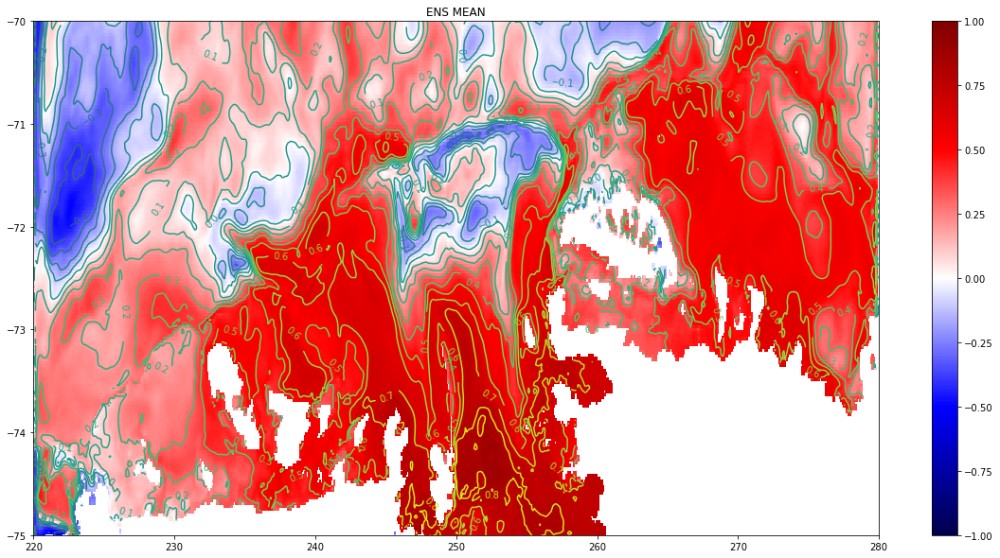

In [4]:
def simpleCorrelationMap(fn_map='EXFuwind', mapvar='EXFuwind', fn_ind='undercurrent_W115'):
    #data=loadMITgcmData(filename=fn_map, members='all', kind='maps')

    UW115=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/'+fn_ind+'.nc')
    #UW115['time']=UW115.indexes['time'].to_datetimeindex()
    x=data[mapvar].mean(dim='ens').rolling(time=24, center=True).mean()-data[mapvar].mean(dim='ens').rolling(time=25*12, center=True).mean()
    y=UW115.mean(dim='ens').rolling(time=24, center=True).mean()-UW115.mean(dim='ens').rolling(time=25*12, center=True).mean()
    res=xr.corr(x, y, dim='time')
    
    plt.figure(figsize=(20,10))
    plt.title('ENS MEAN')
    plt.pcolor( res.XC, res.YC, res, cmap='seismic', vmin=-1, vmax=1)
    plt.colorbar()
    CS=plt.contour( res.XC, res.YC, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
    plt.clabel(CS, CS.levels, inline=True,fontsize=10)
    plt.ylim([-75, -70])
    
    return

simpleCorrelationMap(fn_map='new2_amundsen_shelf_temp_200to700', mapvar='THETA', fn_ind='undercurrent_W115')

In [5]:
mean_temp=data.mean(dim='time')

In [24]:
fn_ind='undercurrent_W115'
UW115=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/'+fn_ind+'.nc')
UW115['time']=UW115.indexes['time'].to_datetimeindex()
UW115=UW115.to_dataframe()['UVEL'].unstack(0)
UW115.columns=['ens'+str(i+1).zfill(2) for i in range(20)]


/tmp/ipykernel_41408/1975119518.py:3: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  UW115['time']=UW115.indexes['time'].to_datetimeindex()


In [8]:
import sys
sys.path.append('/data/hpcdata/users/grejan/mitgcm/') 
import f
#Reading the data.
full='/data/hpcdata/users/grejan/mitgcm/data'
total={}
units={}
longnames={}
#from unixFunctionsMITgcm_final import read_all_data
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='isotherm')
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='final')

In [34]:
cor=[]
for i in UW115.columns:
    print(i)
#     cor+=[(UW115[i].rolling(24, center=True).mean()-UW115[i].rolling(25*12, center=True).mean())
#           .corr(total['amundsen_shelf_break_uwind_avg'][i].rolling(24, center=True).mean()
#                 -total['amundsen_shelf_break_uwind_avg'][i].rolling(25*12, center=True).mean())]
    cor+=[(UW115[i].rolling(24, center=True).mean())
              .corr(total['amundsen_shelf_break_uwind_avg'][i].rolling(24, center=True).mean()
                    )]

cor=xr.DataArray(data=cor, dims=('ens'), coords={'ens': np.arange(20)})

ens01
ens02
ens03
ens04
ens05
ens06
ens07
ens08
ens09
ens10
ens11
ens12
ens13
ens14
ens15
ens16
ens17
ens18
ens19
ens20


/tmp/ipykernel_41408/1978645206.py:7: UserWarning: The following kwargs were not used by contour: 'labels'
  CS=plt.contour( res.XC, res.YC, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))


<a list of 232 text.Text objects>

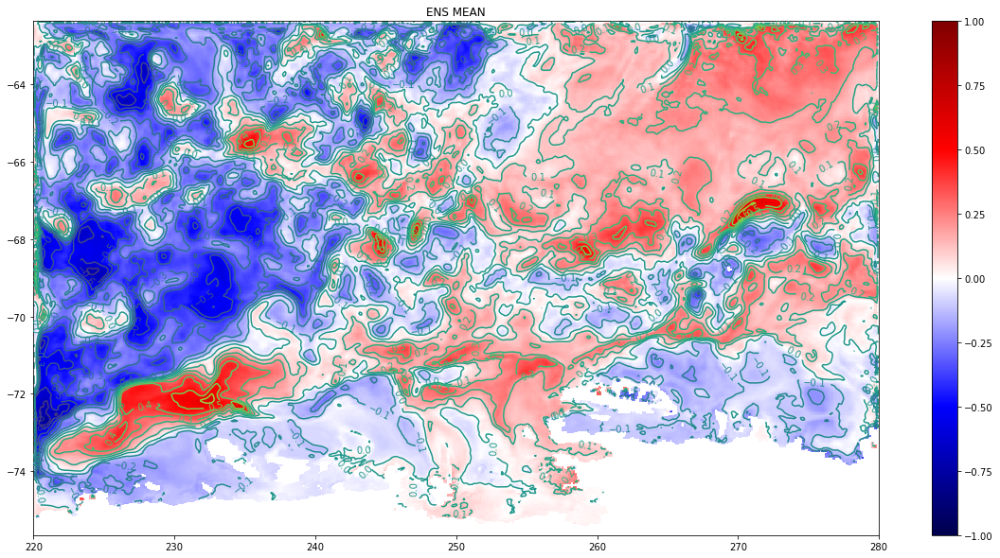

In [35]:
res=xr.corr(mean_temp['THETA'], cor, dim='ens')
    
plt.figure(figsize=(20,10))
plt.title('ENS MEAN')
plt.pcolor( res.XC, res.YC, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.XC, res.YC, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)

/tmp/ipykernel_41408/70236502.py:11: UserWarning: The following kwargs were not used by contour: 'labels'
  CS=plt.contour( res.XC, res.YC, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))


(-75.0, -70.0)

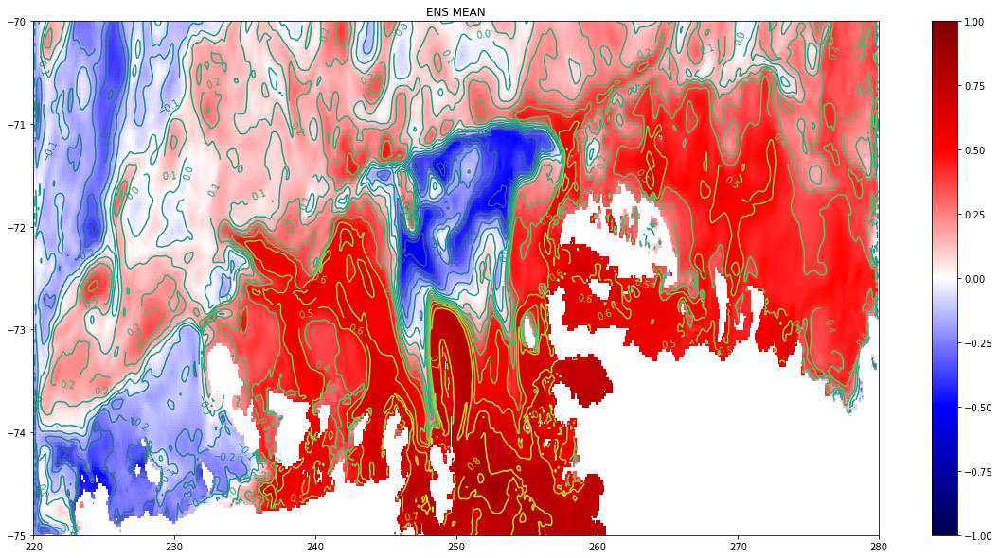

In [37]:
UW115=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/'+fn_ind+'.nc')
#UW115['time']=UW115.indexes['time'].to_datetimeindex()
x=data['THETA'].sel(ens=0).rolling(time=24, center=True).mean()-data['THETA'].sel(ens=0).rolling(time=25*12, center=True).mean()
y=UW115.sel(ens=0).rolling(time=24, center=True).mean()-UW115.sel(ens=0).rolling(time=25*12, center=True).mean()
res=xr.corr(x, y, dim='time')

plt.figure(figsize=(20,10))
plt.title('ENS MEAN')
plt.pcolor( res.XC, res.YC, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.XC, res.YC, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.ylim([-75, -70])

In [2]:
#01 MAKE CROSS SECTIONS A LA ALESSANDRO
lon=115

members='all'

dataS=loadMITgcmData(filename='SALT_W'+str(lon), members=members, kind='slices')
dataT=loadMITgcmData(filename='THETA_W'+str(lon), members=members, kind='slices')

#Convert everything to density.
import sys
sys.path.append('/data/hpcdata/users/grejan/mitgcm/') #Make sure we can also import Kaitlins code.
from mitgcm_python_master.diagnostics import density
ref_depth=0
eosType='MDJWF'
dataS=dataS.where(dataS!=0, drop=True)
dataT=dataT.where(dataT!=0, drop=True)
dataS['time']=dataT.indexes['time'].to_datetimeindex()
dataT['time']=dataT.indexes['time'].to_datetimeindex()

salt=dataS['SALT'].to_numpy()
temp=dataT['THETA'].to_numpy()
q=density (eosType, salt, temp, press=ref_depth)
q=xr.DataArray(q, dims=('ens', 'time', "Z", "YC"), coords={'ens': dataS['SALT'].ens, 'time': dataS['SALT'].time, "YC": dataS['SALT'].YC, "Z": dataS['SALT'].Z})

dataU=loadMITgcmData(filename='UVEL_W'+str(lon), members=members, kind='slices')
dataU=dataU.where(dataU!=0, drop=True)
dataU['time']=dataU.indexes['time'].to_datetimeindex()

Loading number:0
../02_data/slices/SALT_W115_ens1.nc
Loading number:1
../02_data/slices/SALT_W115_ens2.nc
Loading number:2
../02_data/slices/SALT_W115_ens3.nc
Loading number:3
../02_data/slices/SALT_W115_ens4.nc
Loading number:4
../02_data/slices/SALT_W115_ens5.nc
Loading number:5
../02_data/slices/SALT_W115_ens6.nc
Loading number:6
../02_data/slices/SALT_W115_ens7.nc
Loading number:7
../02_data/slices/SALT_W115_ens8.nc
Loading number:8
../02_data/slices/SALT_W115_ens9.nc
Loading number:9
../02_data/slices/SALT_W115_ens10.nc
Loading number:10
../02_data/slices/SALT_W115_ens11.nc
Loading number:11
../02_data/slices/SALT_W115_ens12.nc
Loading number:12
../02_data/slices/SALT_W115_ens13.nc
Loading number:13
../02_data/slices/SALT_W115_ens14.nc
Loading number:14
../02_data/slices/SALT_W115_ens15.nc
Loading number:15
../02_data/slices/SALT_W115_ens16.nc
Loading number:16
../02_data/slices/SALT_W115_ens17.nc
Loading number:17
../02_data/slices/SALT_W115_ens18.nc
Loading number:18
../02_data/

/tmp/ipykernel_55840/2814297705.py:17: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dataS['time']=dataT.indexes['time'].to_datetimeindex()
/tmp/ipykernel_55840/2814297705.py:18: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dataT['time']=dataT.indexes['time'].to_datetimeindex()
/users/kaight/MITgcm/utils/python/MITgcmutils/MITgcmutils/netcdf.py:330: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if hasattr(self, 'mode') and self.mode is 'w':
/users/kaight/MITgcm/utils/python/MITgcmutils/MITgcmutils/netcdf.py:705: SyntaxWarning: "is not" with a literal. 

Loading number:0
../02_data/slices/UVEL_W115_ens1.nc
Loading number:1
../02_data/slices/UVEL_W115_ens2.nc
Loading number:2
../02_data/slices/UVEL_W115_ens3.nc
Loading number:3
../02_data/slices/UVEL_W115_ens4.nc
Loading number:4
../02_data/slices/UVEL_W115_ens5.nc
Loading number:5
../02_data/slices/UVEL_W115_ens6.nc
Loading number:6
../02_data/slices/UVEL_W115_ens7.nc
Loading number:7
../02_data/slices/UVEL_W115_ens8.nc
Loading number:8
../02_data/slices/UVEL_W115_ens9.nc
Loading number:9
../02_data/slices/UVEL_W115_ens10.nc
Loading number:10
../02_data/slices/UVEL_W115_ens11.nc
Loading number:11
../02_data/slices/UVEL_W115_ens12.nc
Loading number:12
../02_data/slices/UVEL_W115_ens13.nc
Loading number:13
../02_data/slices/UVEL_W115_ens14.nc
Loading number:14
../02_data/slices/UVEL_W115_ens15.nc
Loading number:15
../02_data/slices/UVEL_W115_ens16.nc
Loading number:16
../02_data/slices/UVEL_W115_ens17.nc
Loading number:17
../02_data/slices/UVEL_W115_ens18.nc
Loading number:18
../02_data/

/tmp/ipykernel_55840/2814297705.py:27: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dataU['time']=dataU.indexes['time'].to_datetimeindex()


In [3]:
adv={}
for loc in ['UW115', 'PITE', 'coastal']:
    if loc=='UW115':
        adv[loc]=xr.open_dataarray('/data/hpcdata/users/grejan/mitgcm/02_data/indices/undercurrent_W115.nc')
        adv[loc]['time']=adv[loc].indexes['time'].to_datetimeindex()

/tmp/ipykernel_55840/3724531860.py:5: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  adv[loc]['time']=adv[loc].indexes['time'].to_datetimeindex()


/tmp/ipykernel_55840/905114865.py:2: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), adv['UW115'].sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), dim='time')
/tmp/ipykernel_55840/905114865.py:7: UserWarning: The following kwargs were not used by contour: 'labels'
  CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
/tmp/ipykernel_55840/905114865.py:14: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), adv['UW115'].sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), dim='time')
/tmp/ipykernel_55840/905114865.py:19: UserWarning: The following kwargs were not used by contour

(-2000.0, 0.0)

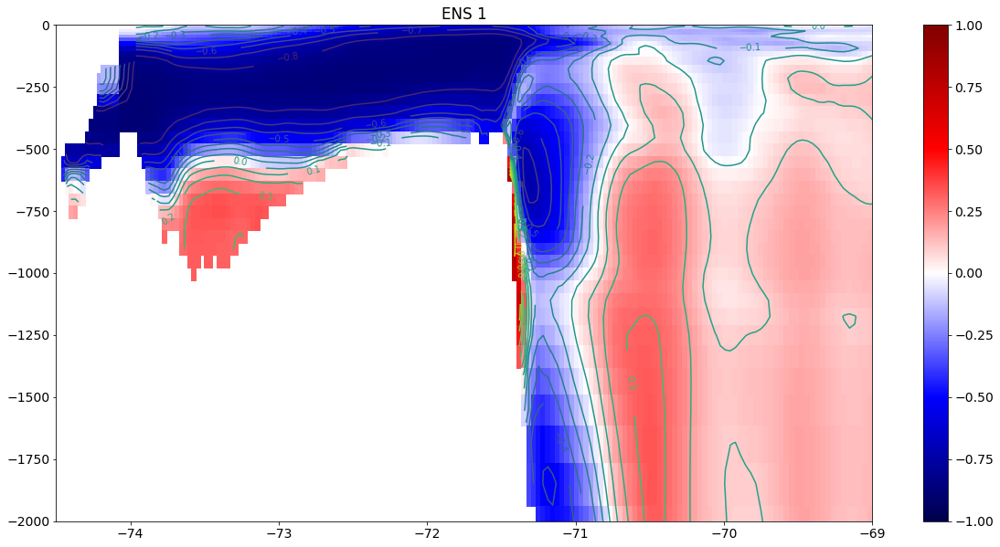

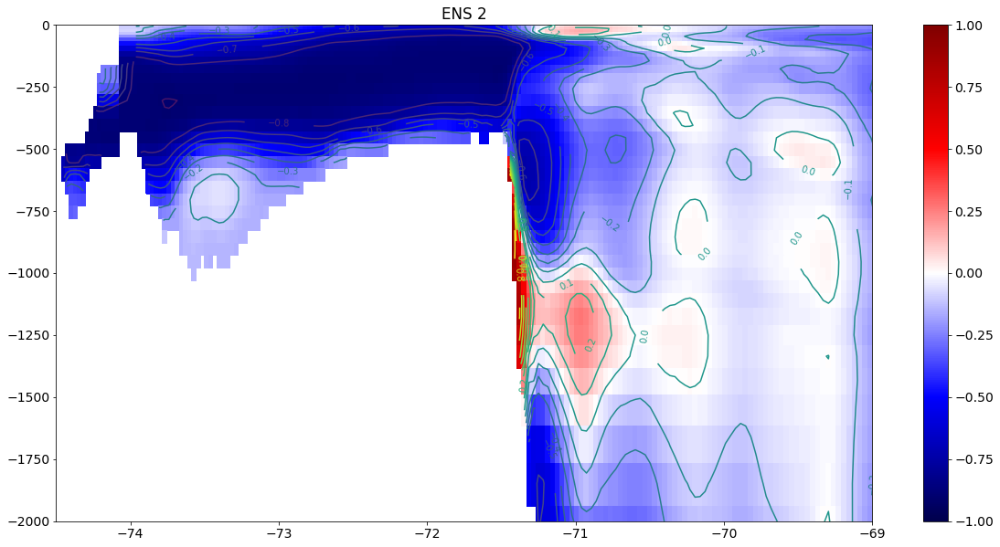

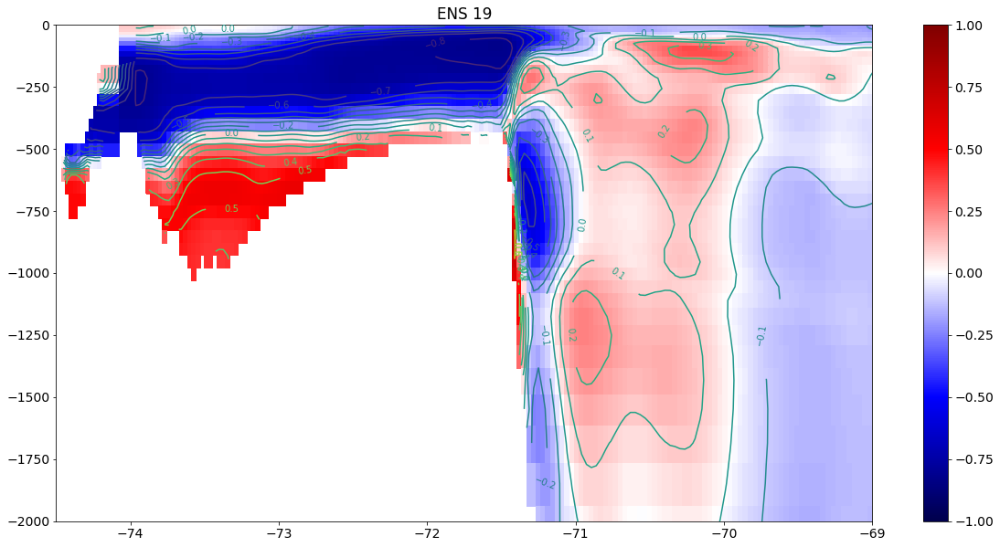

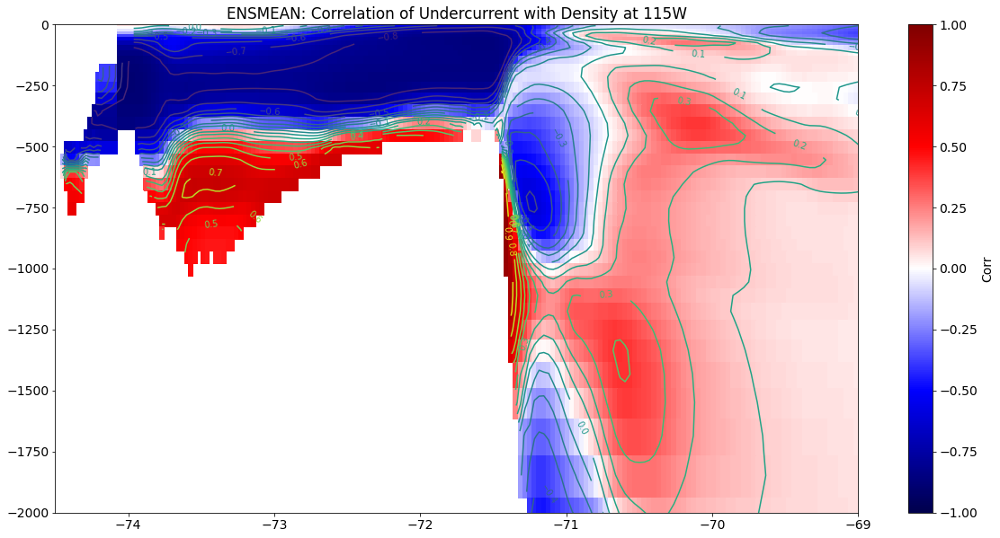

In [7]:
ens=1
res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), adv['UW115'].sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), dim='time')
plt.figure(figsize=(20,10))
plt.title('ENS '+str(ens))
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])


ens=2
res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), adv['UW115'].sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), dim='time')
plt.figure(figsize=(20,10))
plt.title('ENS '+str(ens))
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])

ens=19
res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), adv['UW115'].sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), dim='time')
plt.figure(figsize=(20,10))
plt.title('ENS '+str(ens))
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])

res=xr.corr(q.mean(dim='ens').rolling(time=24, center=True).mean(dim='time'), adv['UW115'].mean(dim='ens').rolling(time=24, center=True).mean(dim='time'), dim='time')
plt.figure(figsize=(20,10))
plt.title('ENSMEAN: Correlation of Undercurrent with Density at 115W')
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar(label='Corr')
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])

/tmp/ipykernel_55840/3808564931.py:3: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  res=xr.corr(dataS['SALT'].sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), adv['UW115'].sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), dim='time')
/tmp/ipykernel_55840/3808564931.py:8: UserWarning: The following kwargs were not used by contour: 'labels'
  CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
/tmp/ipykernel_55840/3808564931.py:13: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  res=xr.corr(dataS['SALT'].mean(dim='ens').rolling(time=24, center=True).mean(dim='time'), adv['UW115'].mean(dim='ens').rolling(time=24, center=True).mean(dim='time'), dim='time')
/tmp/ipykernel_55840/3808564931.py:13: DeprecationWarning: Reductio

(-2000.0, 0.0)

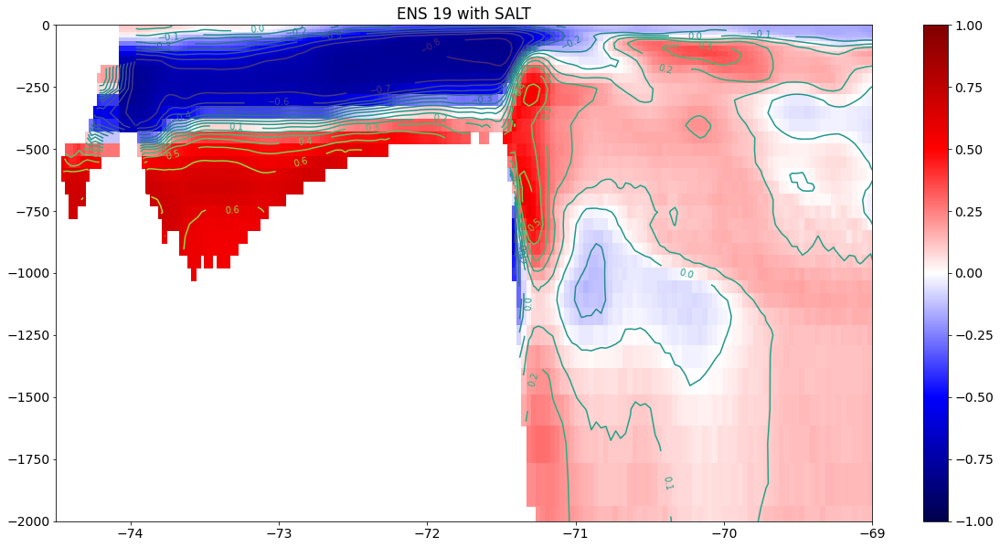

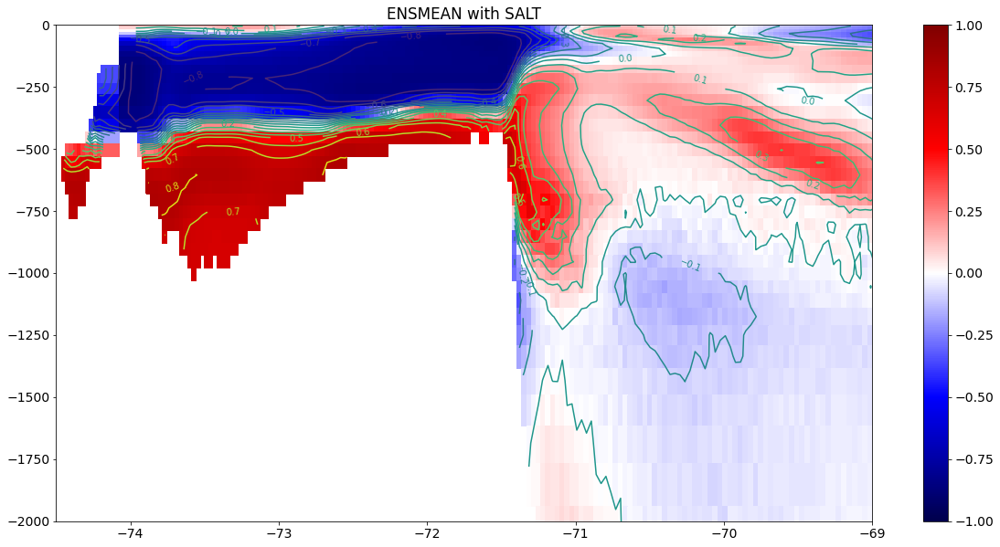

In [5]:
ens=19

res=xr.corr(dataS['SALT'].sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), adv['UW115'].sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), dim='time')
plt.figure(figsize=(20,10))
plt.title('ENS '+str(ens)+' with SALT')
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])

res=xr.corr(dataS['SALT'].mean(dim='ens').rolling(time=24, center=True).mean(dim='time'), adv['UW115'].mean(dim='ens').rolling(time=24, center=True).mean(dim='time'), dim='time')
plt.figure(figsize=(20,10))
plt.title('ENSMEAN with SALT')
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])

/tmp/ipykernel_55840/3161035029.py:3: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  res=xr.corr(dataT['THETA'].sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), adv['UW115'].sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), dim='time')
/tmp/ipykernel_55840/3161035029.py:8: UserWarning: The following kwargs were not used by contour: 'labels'
  CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
/tmp/ipykernel_55840/3161035029.py:13: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  res=xr.corr(dataT['THETA'].mean(dim='ens').rolling(time=24, center=True).mean(dim='time'), adv['UW115'].mean(dim='ens').rolling(time=24, center=True).mean(dim='time'), dim='time')
/tmp/ipykernel_55840/3161035029.py:13: DeprecationWarning: Reduct

(-2000.0, 0.0)

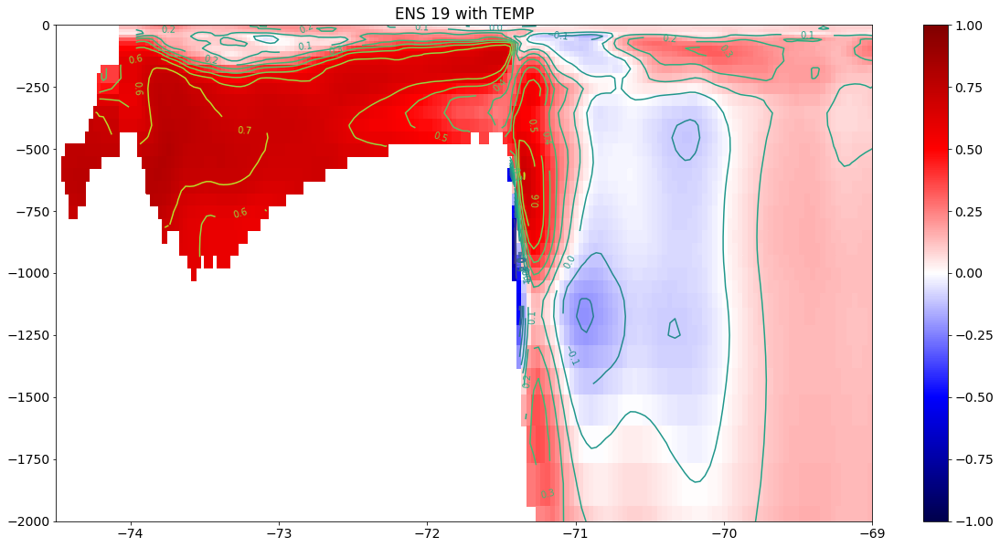

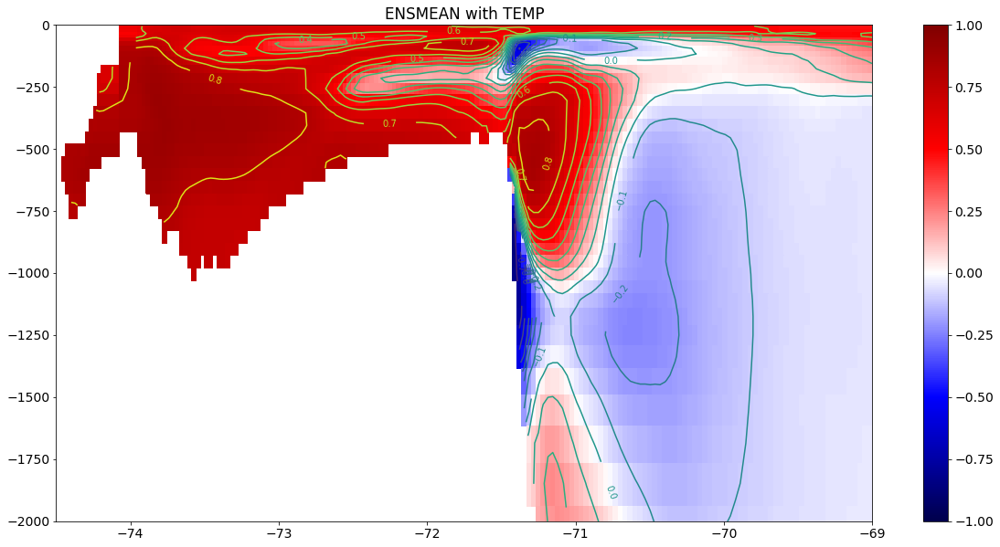

In [6]:
ens=19

res=xr.corr(dataT['THETA'].sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), adv['UW115'].sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), dim='time')
plt.figure(figsize=(20,10))
plt.title('ENS '+str(ens)+' with TEMP')
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])

res=xr.corr(dataT['THETA'].mean(dim='ens').rolling(time=24, center=True).mean(dim='time'), adv['UW115'].mean(dim='ens').rolling(time=24, center=True).mean(dim='time'), dim='time')
plt.figure(figsize=(20,10))
plt.title('ENSMEAN with TEMP')
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])

In [ ]:
res=xr.corr(dataU.rolling(time=24, center=True).mean(dim='time'), adv['UW115'].rolling(time=24, center=True).mean(dim='time'), dim='time')
plt.figure(figsize=(20,10))
plt.pcolor( res.YC, res.Z, res.mean(dim='ens'), cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res.mean(dim='ens'), np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)


<AxesSubplot:>

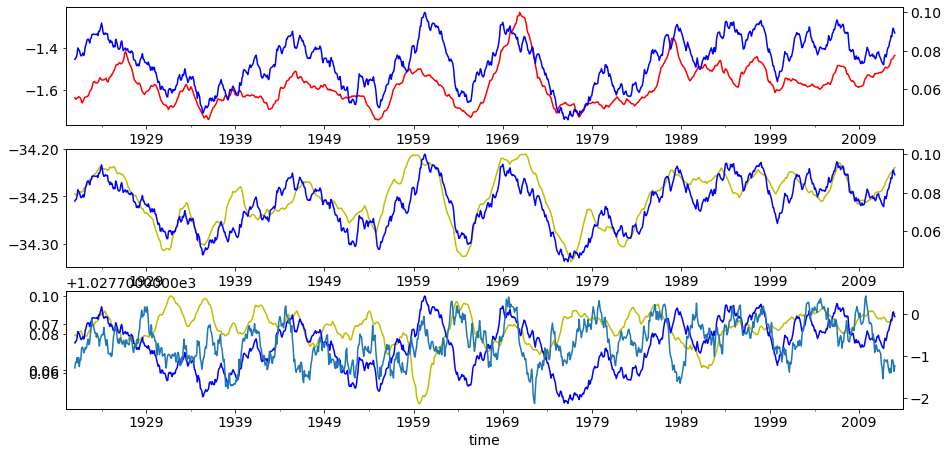

In [49]:

UW115=adv['UW115'].to_series().unstack(0)['1920':'2013']

rho=q.sel(Z=slice(-200, -250), YC=slice(-72, -71.8)).mean(dim='YC').mean(dim='Z').to_series().unstack(0)['1920':'2013']
rho

plt.figure(figsize=(15,10))
plt.subplot(4,1,1)
T=dataT['THETA'].sel(Z=slice(-250, -300), YC=slice(-74, -73.5)).mean(dim='YC').mean(dim='Z').to_series().unstack(0)['1920':'2013']
T[19].rolling(24, center=True).mean().plot(c='r')
plt.twinx()
UW115[19].rolling(24, center=True).mean().plot(c='b')


plt.subplot(4,1,2)
S=dataS['SALT'].sel(Z=slice(-250, -300), YC=slice(-74, -73.5)).mean(dim='YC').mean(dim='Z').to_series().unstack(0)['1920':'2013']
(-1*S[19].rolling(24, center=True).mean()).plot(c='y')
plt.twinx()
UW115[19].rolling(24, center=True).mean().plot(c='b')




plt.subplot(4,1,3)
rho_new=q.sel(Z=slice(-200, -250), YC=slice(-71, -70.8)).mean(dim='YC').mean(dim='Z').to_series().unstack(0)['1920':'2013']
(rho_new[19].rolling(24, center=True).mean()).plot(c='y')
plt.twinx()
UW115[19].rolling(24, center=True).mean().plot(c='b')
plt.twinx()
total['amundsen_shelf_break_uwind_avg']['ens20']['1920':'2013'].rolling(24, center=True).mean().plot()


In [ ]:
T=dataT['THETA'].sel(Z=slice(0, 100), YC=slice(-74, -73.5)).mean(dim='YC').mean(dim='Z').to_series().unstack(0)['1920':'2013']

0
ens01
1
ens02
2
ens03
3
ens04
4
ens05
5
ens06
6
ens07
7
ens08
8
ens09
9
ens10
10
ens11
11
ens12
12
ens13
13
ens14
14
ens15
15
ens16
16
ens17
17
ens18
18
ens19
19
ens20


/tmp/ipykernel_55840/1297517428.py:15: UserWarning: The following kwargs were not used by contour: 'labels'
  CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))


(-2000.0, 0.0)

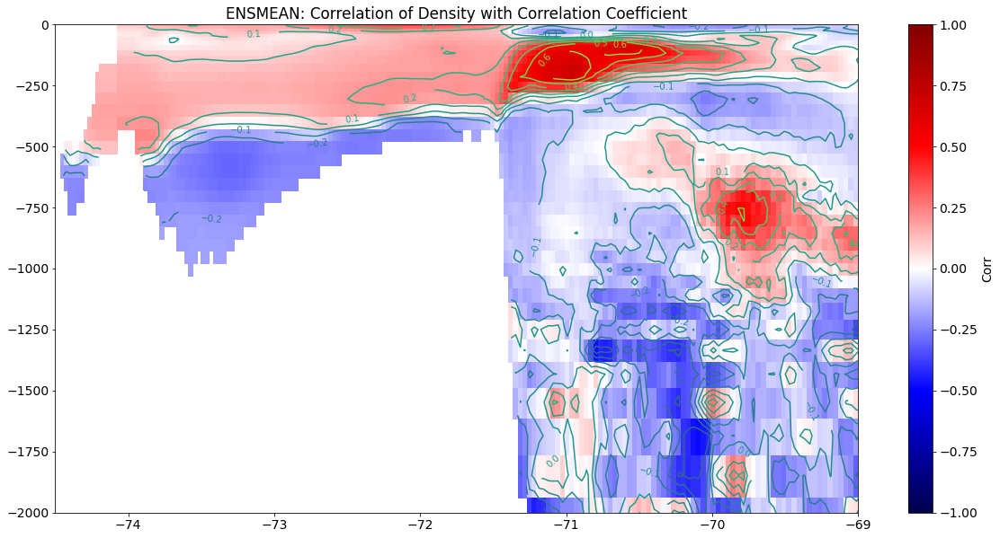

In [44]:
UW115.columns=['ens'+str(i+1).zfill(2) for i in range(20)]
cors=[]
for j, i in enumerate(UW115.columns):
    print(j)
    print(i)
    cors+=[UW115[i].rolling(24, center=True).mean().corr(total['amundsen_shelf_break_uwind_avg'][i].rolling(24, center=True).mean())]

cors=xr.DataArray(data=cors, dims=['ens'], coords=dict(ens=np.arange(20)))
    
res=xr.corr(dataS['SALT'].mean(dim='time'), cors, dim='ens')
plt.figure(figsize=(20,10))
plt.title('ENSMEAN: Correlation of Density with Correlation Coefficient')
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar(label='Corr')
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])

In [52]:
cors

<xarray.DataArray (ens: 20)>
array([0.24767001, 0.39065047, 0.26532641, 0.12785092, 0.29215901,
       0.26580127, 0.15957278, 0.40146852, 0.07758506, 0.36290936,
       0.20213648, 0.18753761, 0.24805736, 0.30456316, 0.29032143,
       0.30626523, 0.3642122 , 0.14854245, 0.27421868, 0.2719996 ])
Coordinates:
  * ens      (ens) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19

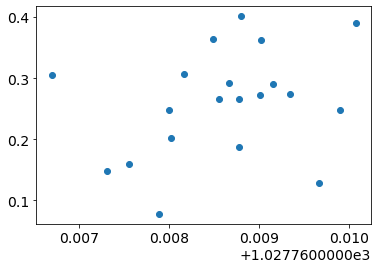

In [51]:
plt.scatter(rho_new.mean(), cors)

In [31]:
import unixFunctionsMITgcm_final as fc
#Reading the data.
full='/data/hpcdata/users/grejan/mitgcm/data'
total={}
units={}
longnames={}
#from unixFunctionsMITgcm_final import read_all_data
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='isotherm')
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='final')
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='ohc')


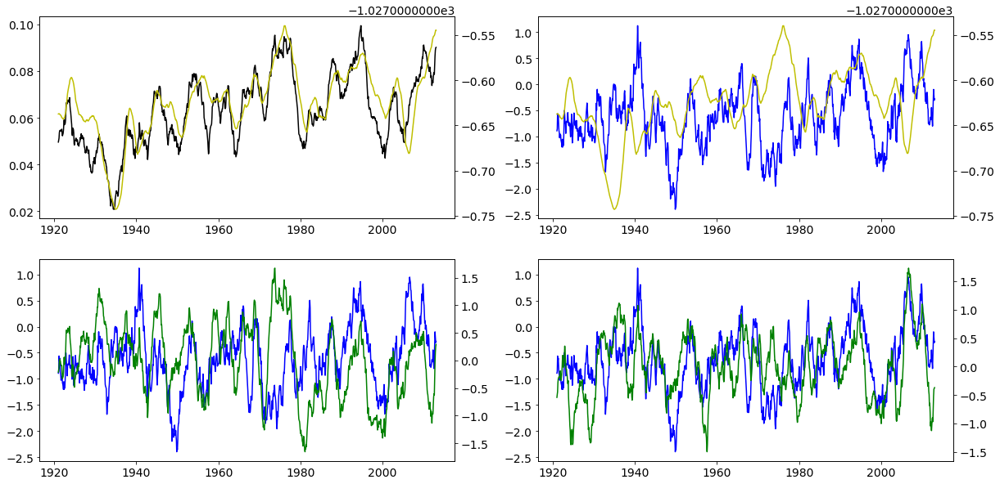

In [151]:
plt.figure(figsize=(20,10))
ens=1
UW115=adv['UW115'].to_dataframe()['UVEL'].unstack(0)['1920':'2013']
plt.subplot(2,2,1)
plt.plot(UW115[ens-1].rolling(24, center=True).mean(), c='k')
plt.twinx()
plt.plot(-1*rho[ens-1].rolling(24, center=True).mean(), c='y')

plt.subplot(2,2,2)
plt.plot(total['amundsen_shelf_break_uwind_avg']['ens'+str(ens).zfill(2)]['1920':'2013'].rolling(24, center=True).mean(), c='b')
plt.twinx()
plt.plot(-1*rho[ens-1].rolling(24, center=True).mean(), c='y')


y0=UW115[ens-1].rolling(24, center=True).mean()
x0=total['amundsen_shelf_temp_btw_200_700m']['ens'+str(ens).zfill(2)]['1920':'2013'].rolling(24, center=True).mean()

y0=(y0-y0.mean())/y0.std()
x0=(x0-x0.mean())/x0.std()
z0=y0-x0

plt.subplot(2,2,3)
plt.plot(total['amundsen_shelf_break_uwind_avg']['ens'+str(ens).zfill(2)]['1920':'2013'].rolling(24, center=True).mean(), c='b')
plt.twinx()
#plt.plot(UW115[ens-1].rolling(24, center=True).mean(), c='k')
plt.plot(z0, c='g')


y1=rho[ens-1].rolling(24, center=True).mean()
x1=UW115[ens-1].rolling(24, center=True).mean()

y1=(y1-y1.mean())/y1.std()
x1=(x1-x1.mean())/x1.std()
z1=y1+x1

plt.subplot(2,2,4)
plt.plot(total['amundsen_shelf_break_uwind_avg']['ens'+str(ens).zfill(2)]['1920':'2013'].rolling(24, center=True).mean(), c='b')
plt.twinx()
plt.plot(z1, c='g')


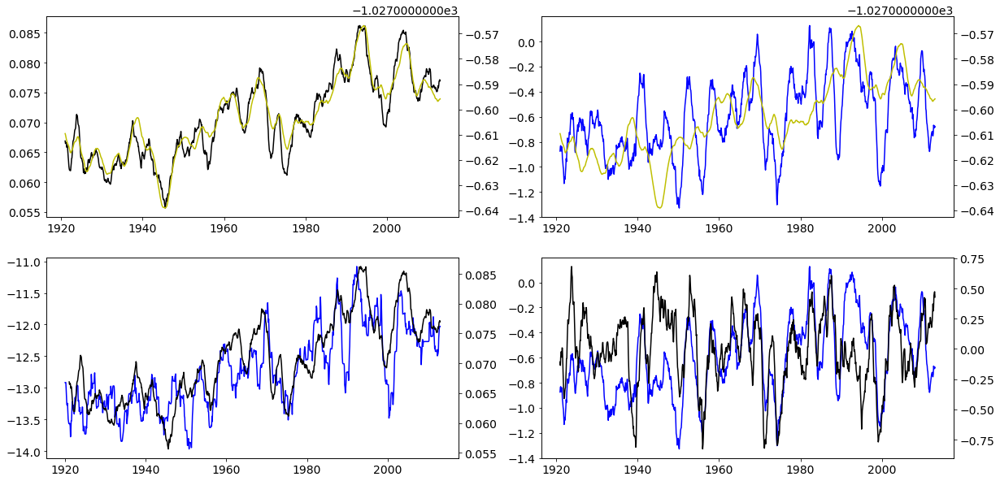

In [165]:
plt.figure(figsize=(20,10))
UW115=adv['UW115'].to_dataframe()['UVEL'].unstack(0)['1920':'2013']
plt.subplot(2,2,1)
plt.plot(UW115.mean(axis=1).rolling(24, center=True).mean(), c='k')
plt.twinx()
plt.plot(-1*rho.mean(axis=1).rolling(24, center=True).mean(), c='y')

plt.subplot(2,2,2)
plt.plot(total['amundsen_shelf_break_uwind_avg'].mean(axis=1)['1920':'2013'].rolling(24, center=True).mean(), c='b')
plt.twinx()
plt.plot(-1*rho.mean(axis=1).rolling(24, center=True).mean(), c='y')


# y0=UW115.mean(axis=1).rolling(24, center=True).mean()
# x0=total['amundsen_shelf_ohc_below_0m'].mean(axis=1)['1920':'2013'].rolling(24, center=True).mean()
x0=total['amundsen_shelf_break_uwind_avg'].mean(axis=1)['1920':'2013'].rolling(24, center=True).mean()
y0=total['amundsen_shelf_break_uwind_avg'].mean(axis=1)['1920':'2013'].rolling(24, center=True).mean().ewm(halflife=5*12).mean()

y0=(y0-y0.mean())/y0.std()
x0=(x0-x0.mean())/x0.std()
z0=y0+x0

plt.subplot(2,2,3)
plt.plot(total['amundsen_shelf_seaice_freeze'].mean(axis=1)['1920':'2013'].rolling(24, center=True).mean(), c='b')
#plt.plot(z0, c='g')
plt.twinx()
plt.plot(UW115.mean(axis=1).rolling(24, center=True).mean(), c='k')
#plt.plot(z0, c='g')



y1=rho.mean(axis=1).rolling(24, center=True).mean()
x1=UW115.mean(axis=1).rolling(24, center=True).mean()

y1=(y1-y1.mean())/y1.std()
x1=(x1-x1.mean())/x1.std()
z1=y1+x1

plt.subplot(2,2,4)
plt.plot(total['amundsen_shelf_break_uwind_avg'].mean(axis=1)['1920':'2013'].rolling(24, center=True).mean(), c='b')
plt.twinx()
plt.plot(z1, c='k')



In [32]:
import sys
sys.path.append('/data/hpcdata/users/grejan/mitgcm/') #Make sure we can also import Kaitlins code.

In [ ]:
import unixFunctionsMITgcm_final as fc
#Reading the data.
full='/data/hpcdata/users/grejan/mitgcm/data'
total={}
units={}
longnames={}
#from unixFunctionsMITgcm_final import read_all_data
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='isotherm')
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='final')
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='ohc')
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='seaice')
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='trough')

30


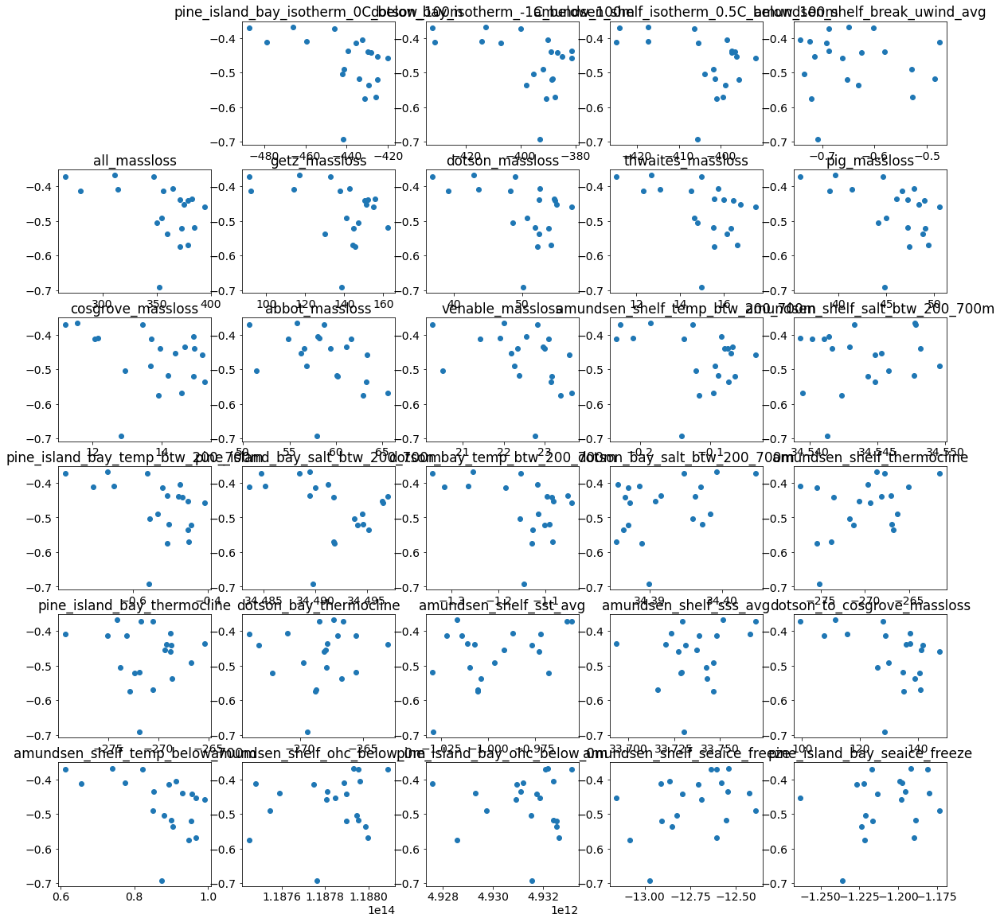

In [184]:

UW115_1=UW115.copy()
rho_1=rho.copy()

UW115_1.columns=['ens'+str(i+1).zfill(2) for i in range(20)]
rho_1.columns=['ens'+str(i+1).zfill(2) for i in range(20)]

# plt.figure()
# plt.subplot(2,2,1)
# plt.scatter(rho_1.mean(), UW115_1.mean())
# plt.subplot(2,2,2)
# plt.scatter(rho_1.mean(), [UW115_1[i].corr(total['amundsen_shelf_break_uwind_avg'][i]) for i in UW115_1.columns])

print(len(total))
plt.figure(figsize=(20,20))
for k,kl in enumerate(list(total)):
    if kl=='time':
        continue
    else:
        plt.subplot(6,5,k+1)
        plt.scatter(total[kl].mean(), [UW115_1[i].corr(rho_1[i]) for i in UW115_1.columns])
        plt.title(kl)







In [47]:
UW115.columns=['ens'+str(i+1).zfill(2) for i in range(20)]


,ens01,ens02,ens03,ens04,ens05,ens06,ens07,ens08,ens09,ens10,ens11,ens12,ens13,ens14,ens15,ens16,ens17,ens18,ens19,ens20
time,,,,,,,,,,,,,,,,,,,,
1920-01-01,0.056282,0.069093,0.072914,0.070119,0.101484,0.121837,0.045848,0.076340,0.082387,0.069002,0.071275,0.111930,0.084740,0.094616,0.022117,0.124707,0.043495,0.085824,0.103560,0.083270
1920-02-01,0.016105,0.074558,0.034375,0.042020,0.031612,0.063224,0.023908,0.055945,0.039202,0.041136,0.041008,0.052768,0.043945,0.057694,0.013883,0.046441,0.041632,0.077106,0.030304,0.069608
1920-03-01,-0.000517,0.053953,0.038039,0.025000,0.072247,0.059832,0.066617,0.095227,0.041573,0.084744,-0.006799,0.041484,0.024071,0.044893,0.012211,0.066303,0.046351,0.085037,0.062391,0.060086
1920-04-01,0.020924,0.043123,0.055330,0.103701,0.086861,0.068621,0.054244,0.108465,0.040344,0.024939,0.075134,0.046785,0.049047,0.031043,0.021586,0.075470,0.074327,0.084265,0.086753,0.025958
1920-05-01,0.063357,0.085447,0.089688,0.147728,0.090230,0.101629,0.076321,0.118306,0.053583,0.084479,0.064854,0.092017,0.090822,0.065370,0.027840,0.108578,0.086343,0.082129,0.076493,0.110281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-08-01,0.129542,0.113383,0.084871,0.111026,0.014782,0.088670,0.080422,0.004000,0.114004,0.123564,0.129286,0.085114,0.061373,0.073596,0.064330,0.144183,0.074847,0.059099,0.086126,0.111304
2013-09-01,0.133225,0.074843,0.049702,0.111517,0.043770,0.091650,0.046243,0.026569,0.077912,0.126775,0.140551,0.026630,0.083388,0.074598,0.078087,0.122531,0.036693,0.075582,0.047918,0.110112
2013-10-01,0.133314,-0.004794,0.087799,0.148269,0.035645,0.116778,0.122195,-0.002924,0.081804,0.068967,0.109674,0.029072,0.055019,0.049027,0.059095,0.050598,0.063620,0.055670,0.107216,0.094755


In [52]:
x=(UW115-UW115.rolling(25*12, center=True, min_periods=5*12).mean())/UW115.std()
y=(total['amundsen_shelf_break_uwind_avg']-total['amundsen_shelf_break_uwind_avg'].rolling(25*12, center=True, min_periods=5*12).mean())/total['amundsen_shelf_break_uwind_avg'].std()

<Figure size 432x288 with 0 Axes>

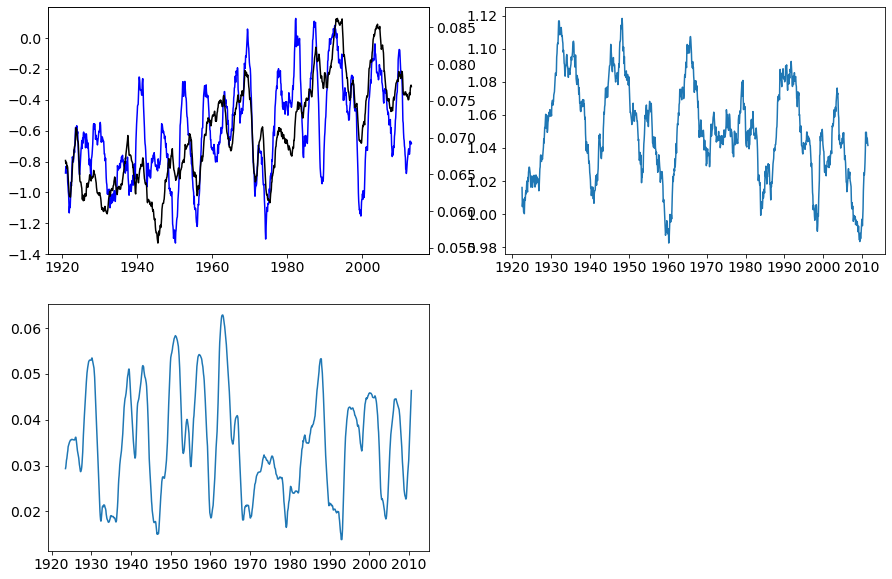

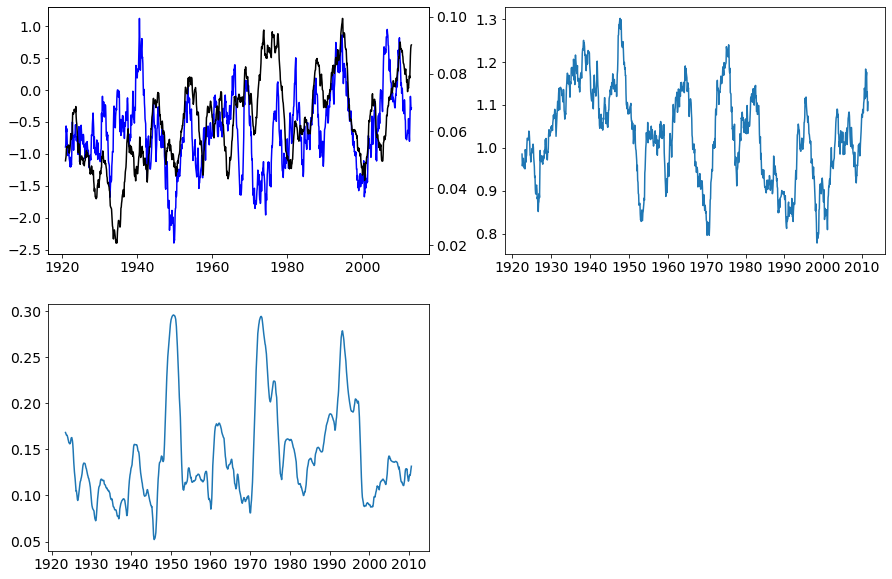

In [68]:
plt.figure()
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(total['amundsen_shelf_break_uwind_avg'].mean(axis=1)['1920':'2013'].rolling(24, center=True).mean(), c='b')
plt.twinx()
plt.plot(UW115.mean(axis=1).rolling(24, center=True).mean(), c='k')
plt.subplot(2,2,2)
plt.plot(abs(y-x).mean(axis=1).rolling(60,center=True).mean())
plt.subplot(2,2,3)
plt.plot(abs(y-x).mean(axis=1).rolling(24,center=True).mean().rolling(60, center=True).std())

ens=1
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(total['amundsen_shelf_break_uwind_avg']['ens'+str(ens).zfill(2)]['1920':'2013'].rolling(24, center=True).mean(), c='b')
plt.twinx()
plt.plot(UW115['ens'+str(ens).zfill(2)].rolling(24, center=True).mean(), c='k')
plt.subplot(2,2,2)
plt.plot(abs(y-x)['ens'+str(ens).zfill(2)].rolling(60,center=True).mean())
plt.subplot(2,2,3)
plt.plot(abs(y-x)['ens'+str(ens).zfill(2)].rolling(24,center=True).mean().rolling(60, center=True).std())



<Figure size 432x288 with 0 Axes>

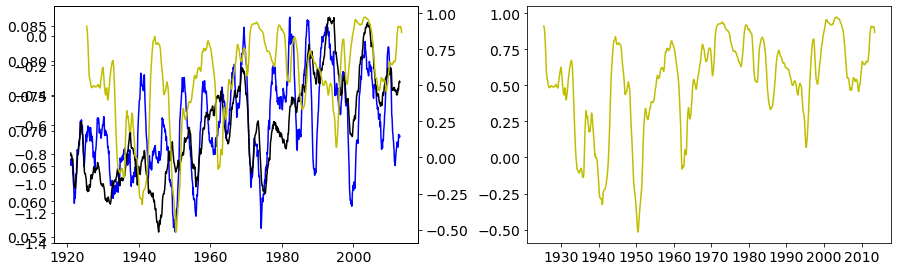

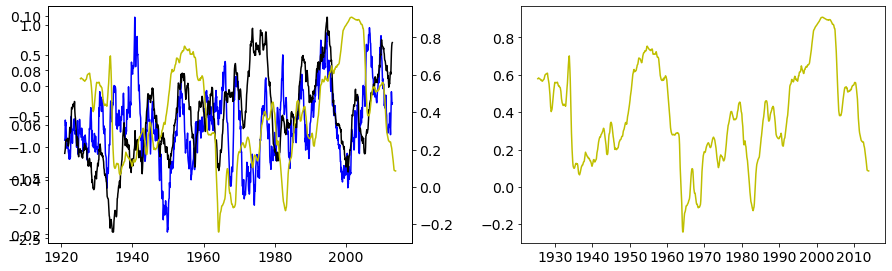

In [89]:
l=y.mean(axis=1).rolling(120, center=True).corr(x.mean(axis=1))


plt.figure()
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(total['amundsen_shelf_break_uwind_avg'].mean(axis=1)['1920':'2013'].rolling(24, center=True).mean(), c='b')
plt.twinx()
plt.plot(UW115.mean(axis=1).rolling(24, center=True).mean(), c='k')
plt.twinx()
plt.plot(y.mean(axis=1).rolling(12, center=True).mean().rolling(60, center=False, min_periods=60).corr(x.mean(axis=1).rolling(12, center=True).mean()), c='y')
plt.subplot(2,2,2)
plt.plot(y.mean(axis=1).rolling(12, center=True).mean().rolling(60, center=False, min_periods=60).corr(x.mean(axis=1).rolling(12, center=True).mean()), c='y')
plt.subplots_adjust(hspace=0.3, wspace=0.3,)

ens=1
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(total['amundsen_shelf_break_uwind_avg']['ens'+str(ens).zfill(2)]['1920':'2013'].rolling(24, center=True).mean(), c='b')
plt.twinx()
plt.plot(UW115['ens'+str(ens).zfill(2)].rolling(24, center=True).mean(), c='k')
plt.twinx()
plt.plot(y['ens'+str(ens).zfill(2)].rolling(12, center=True).mean().rolling(120, center=False, min_periods=60).corr(x['ens'+str(ens).zfill(2)].rolling(12, center=True).mean()), c='y')
plt.subplot(2,2,2)
plt.plot(y['ens'+str(ens).zfill(2)].rolling(12, center=True).mean().rolling(120, center=False, min_periods=60).corr(x['ens'+str(ens).zfill(2)].rolling(12, center=True).mean()), c='y')
plt.subplots_adjust(hspace=0.3, wspace=0.3,)

/tmp/ipykernel_70642/3389022107.py:6: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), p, dim='time')
/tmp/ipykernel_70642/3389022107.py:11: UserWarning: The following kwargs were not used by contour: 'labels'
  CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
/tmp/ipykernel_70642/3389022107.py:19: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), p, dim='time')
/tmp/ipykernel_70642/3389022107.py:24: UserWarning: The following kwargs were not used by contour: 'labels'
  CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
/tmp/ipykernel_70642/3389022107.py:33: 

(-2000.0, 0.0)

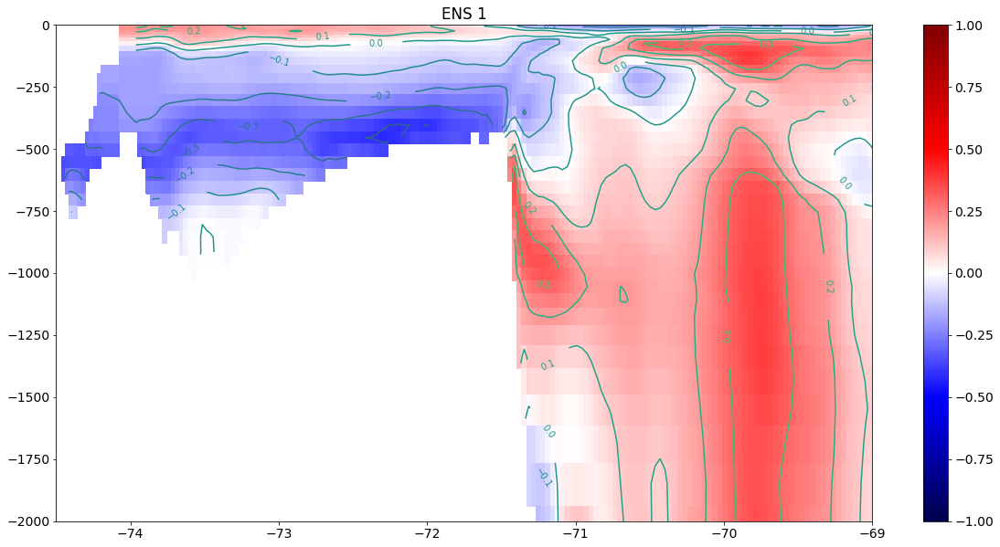

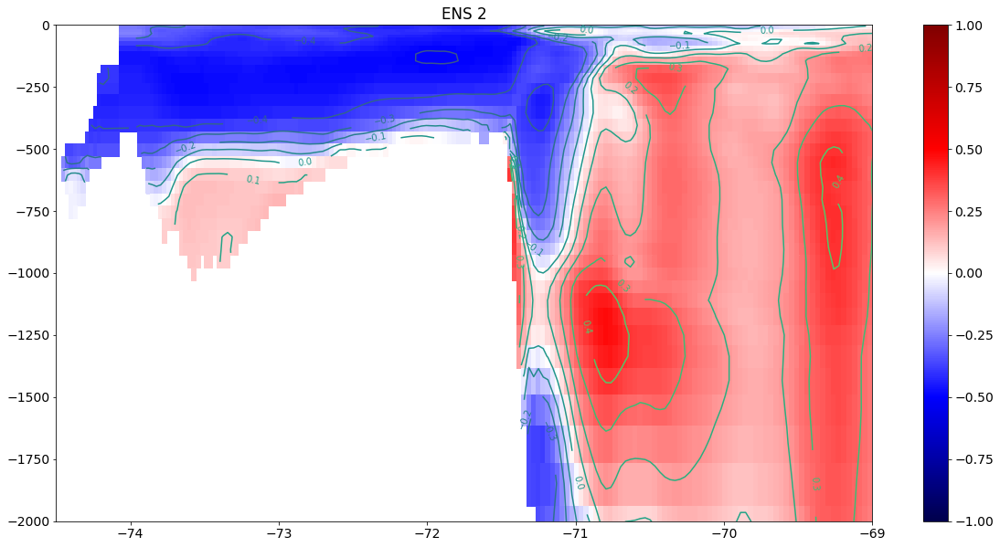

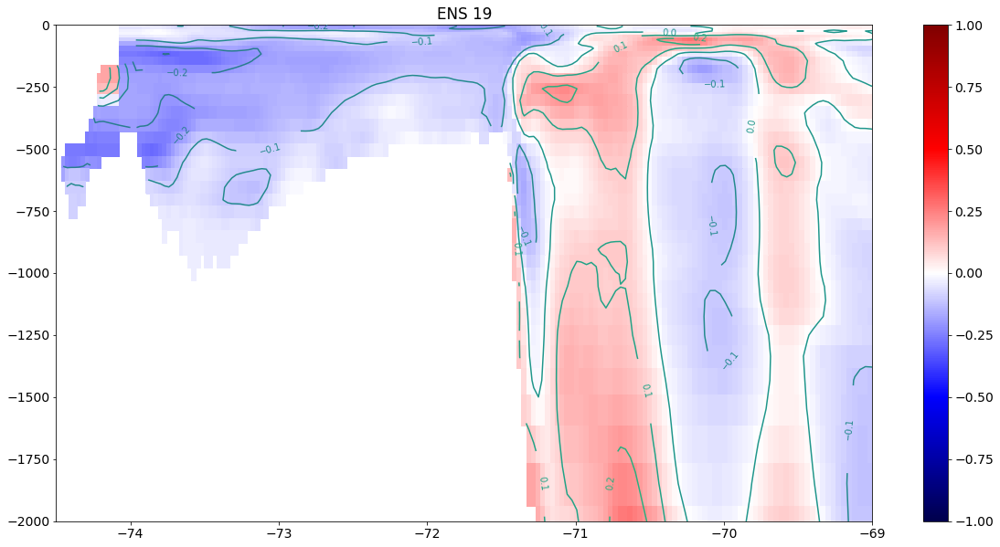

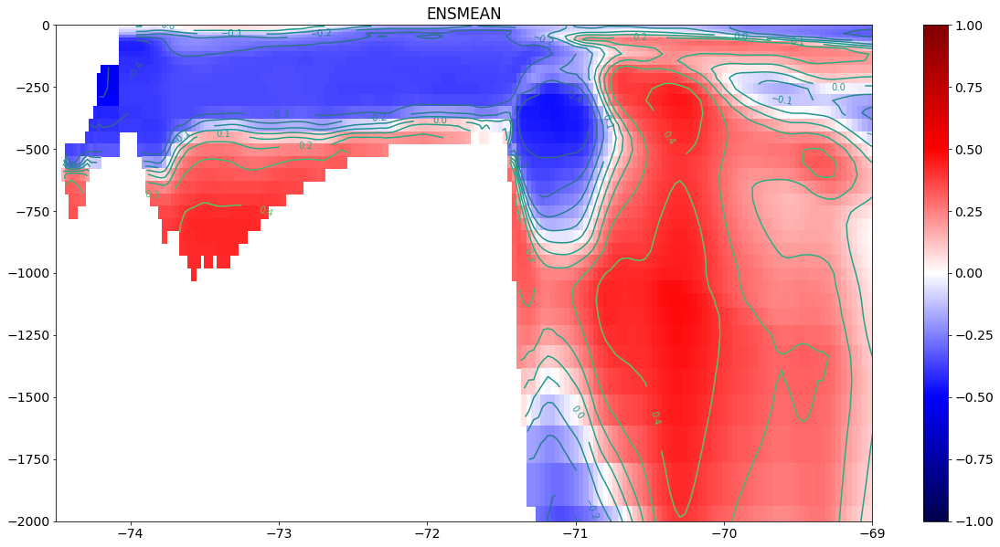

In [112]:
l=y.rolling(12, center=True).mean().rolling(120, center=True, min_periods=60).corr(x.rolling(12, center=True).mean())

ens=1
p=l['ens'+str(ens).zfill(2)].to_xarray()
p=p.rename({'index':'time'})
res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), p, dim='time')
plt.figure(figsize=(20,10))
plt.title('ENS '+str(ens))
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])

ens=2
p=l['ens'+str(ens).zfill(2)].to_xarray()
p=p.rename({'index':'time'})
res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), p, dim='time')
plt.figure(figsize=(20,10))
plt.title('ENS '+str(ens))
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])


ens=19
p=l['ens'+str(ens).zfill(2)].to_xarray()
p=p.rename({'index':'time'})
res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), p, dim='time')
plt.figure(figsize=(20,10))
plt.title('ENS '+str(ens))
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])


p=l.mean(axis=1).to_xarray()
p=p.rename({'index':'time'})
res=xr.corr(q.mean(dim='ens').rolling(time=24, center=True).mean(dim='time'), p, dim='time')
plt.figure(figsize=(20,10))
plt.title('ENSMEAN')
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])

/tmp/ipykernel_70642/751484177.py:6: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), p, dim='time')
/tmp/ipykernel_70642/751484177.py:11: UserWarning: The following kwargs were not used by contour: 'labels'
  CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
/tmp/ipykernel_70642/751484177.py:19: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), p, dim='time')
/tmp/ipykernel_70642/751484177.py:24: UserWarning: The following kwargs were not used by contour: 'labels'
  CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
/tmp/ipykernel_70642/751484177.py:33: Depre

(-2000.0, 0.0)

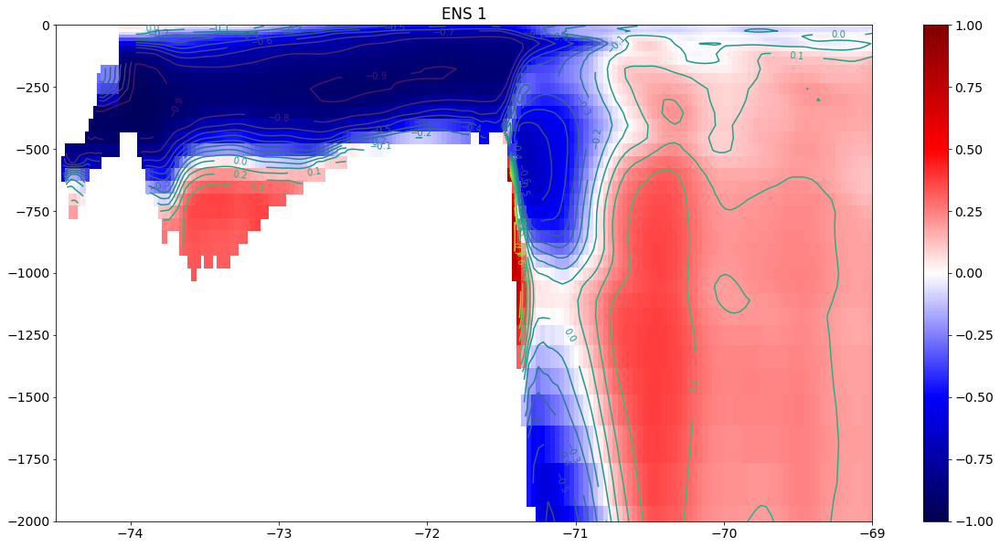

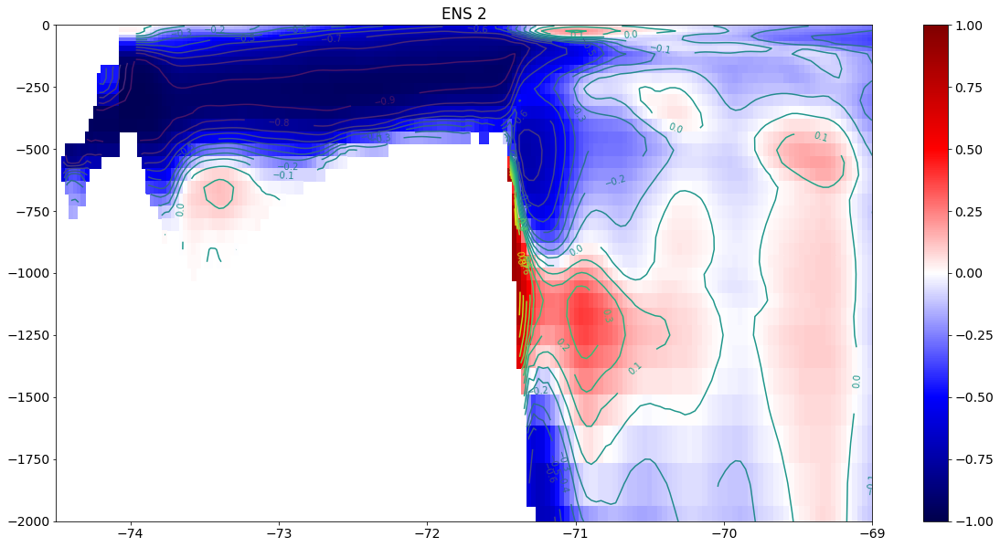

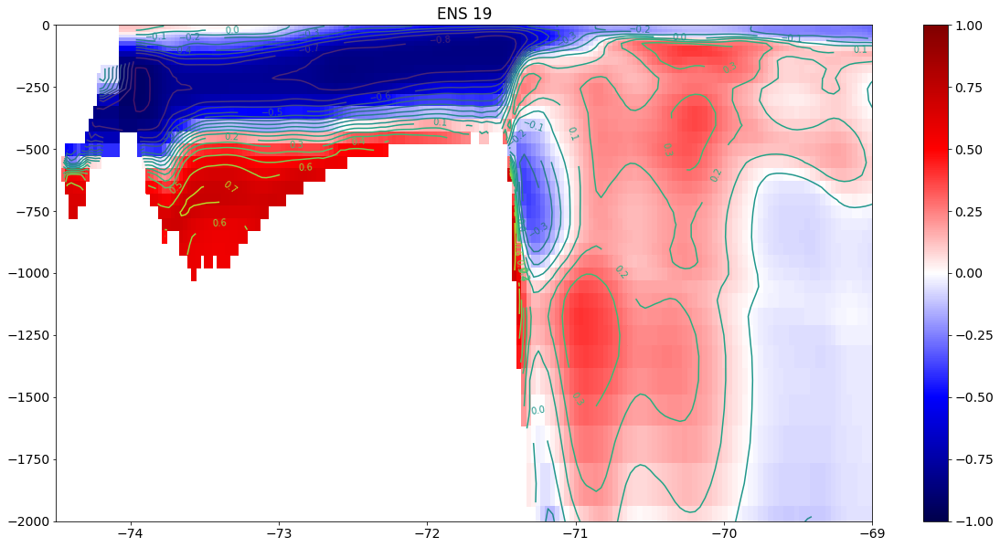

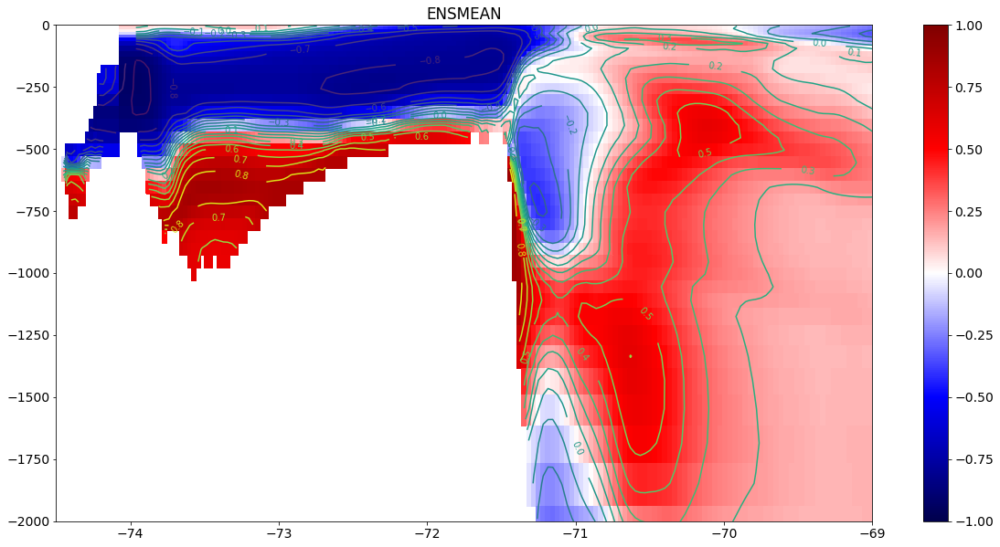

In [115]:
l=total['dotson_to_cosgrove_massloss'].rolling(24,center=True).mean()

ens=1
p=l['ens'+str(ens).zfill(2)].to_xarray()
p=p.rename({'index':'time'})
res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), p, dim='time')
plt.figure(figsize=(20,10))
plt.title('ENS '+str(ens))
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])

ens=2
p=l['ens'+str(ens).zfill(2)].to_xarray()
p=p.rename({'index':'time'})
res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), p, dim='time')
plt.figure(figsize=(20,10))
plt.title('ENS '+str(ens))
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])


ens=19
p=l['ens'+str(ens).zfill(2)].to_xarray()
p=p.rename({'index':'time'})
res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), p, dim='time')
plt.figure(figsize=(20,10))
plt.title('ENS '+str(ens))
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])


p=l.mean(axis=1).to_xarray()
p=p.rename({'index':'time'})
res=xr.corr(q.mean(dim='ens').rolling(time=24, center=True).mean(dim='time'), p, dim='time')
plt.figure(figsize=(20,10))
plt.title('ENSMEAN')
plt.pcolor( res.YC, res.Z, res, cmap='seismic', vmin=-1, vmax=1)
plt.colorbar()
CS=plt.contour( res.YC, res.Z, res, np.arange(-1, 1, 0.1), labels=np.arange(-1, 1, 0.1))
plt.clabel(CS, CS.levels, inline=True,fontsize=10)
plt.xlim([-74.5,-69])
plt.ylim([-2000,0])

In [108]:
l=y.rolling(12, center=True).mean().rolling(120, center=False, min_periods=60).corr(x.rolling(12, center=True).mean())
p=l['ens01'].to_xarray()
p=p.rename({'index':'time'})

In [98]:
res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), l['ens'+str(ens).zfill(2)]['1920':'2013'].to_xarray(), dim='time')

/tmp/ipykernel_70642/2771234168.py:1: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  res=xr.corr(q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time'), l['ens'+str(ens).zfill(2)].to_xarray(), dim='time')


KeyboardInterrupt: 

In [99]:
xr.corr(l['ens'+str(ens).zfill(2)]['1920':'2013'].to_xarray()

<xarray.DataArray 'ens19' (index: 1128)>
array([       nan,        nan,        nan, ..., 0.18828243, 0.17869583,
       0.17134979])
Coordinates:
  * index    (index) datetime64[ns] 1920-01-01 1920-02-01 ... 2013-12-01

In [100]:
q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time')

/tmp/ipykernel_70642/523750396.py:1: DeprecationWarning: Reductions are applied along the rolling dimension(s) '['time']'. Passing the 'dim' kwarg to reduction operations has no effect.
  q.sel(ens=ens-1).rolling(time=24, center=True).mean(dim='time')


<xarray.DataArray (time: 1488, Z: 50, YC: 331)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
    ens      int64 18
  * time     (time) datetime64[ns] 1890-02-01 1890-03-01 ... 2014-01-01
  * YC       (YC) float32 -74.45 -74.43 -74.4 -74.37 ... -62.48 -62.44 -62.39
  * Z        (Z) float32 -5.0 -15.0 -25.0 ... -4.86e+03 -5.16e+03 -5.46e+03

In [ ]:
from functions.loading_and_processing_data import loadMITgcmData, loadPACEData, detrend_and_average_MITgcmData, read_all_data
from functions.composite_maps import createCompositeMap, createVelocityCompositeMap, defineEvents, findEvents, createCompositeMap_2, workflowCompositeMap
import numpy as np
import xarray as xr

#00-INITIALISATION------------------------------------------------------------

members=[0,1]
months=[-5, 3]
deseasonalize=True
window=1
output_filename='test_overview'


#First, read time series so that we can define events.
full='/data/hpcdata/users/grejan/mitgcm/data'
total={}
units={}
longnames={}
total, units, longnames=read_all_data(full, total, units, longnames, kind='isotherm')
total, units, longnames=read_all_data(full, total, units, longnames, kind='final')
total, units, longnames=read_all_data(full, total, units, longnames, kind='ohc')

#Select events that we are interested in.
threshold=defineEvents(total=total, longnames=longnames, units=units, wvar='amundsen_shelf_ohc_below_0m', larger_than=True, pct=75, detrend=True, window=12*2, filename='warm75_colored_in')
print(threshold)
selected,_=findEvents(total=total, longnames=longnames, units=units, threshold=threshold, wvar='amundsen_shelf_ohc_below_0m', larger_than=True, detrend=True, window=12*2, filename='warm75_colored_in')

In [2]:
#02-Overview-Composites------------------------------------------------

#Load Data that we already have
data={}
data_dt={}

var_list=['EXFuwind', 'THETA', 'THETAPITE', 'UVELW115', 'UVEL', 'VVEL', 'UVELB', 'VVELB', 'PSL']

filenames={'EXFuwind':'zonal_winds',
           'THETA':'THETA_depth_integrated',
           'UVEL':'depth_averaged_UVEL', 
           'VVEL':'depth_averaged_VVEL',
           'curlTAU':'curl_tau', 
           'THETAW106':'theta_W106', 
           'THETAW120':'theta_W120',
           'UVELW115':'UVEL_W115',
           'THETAW103-5':'theta_W103-5',
           'THETAW100':'theta_W100',
           'THETAS72-5':'theta_S72-5',
           'THETAPITE':['THETA_transect_PITE_full_0', 'THETA_transect_PITE_full_1', 
                        'THETA_transect_PITE_full_2', 'THETA_transect_PITE_full_3', 
                        'THETA_transect_PITE_full_4'],
           'UVELB':'bottom100m_averaged_UVEL', 
           'VVELB':'bottom100m_averaged_VVEL'}
#'THETA':'new2_amundsen_shelf_temp_200to700',

for var in var_list: 
    kind='maps'
    print('Starting with: '+var)
    if var=='THETAPITE':
        kind='transects'
        for fn in filenames[var]:
            data[var+'_'+fn[-1]]=loadMITgcmData(filename=fn, members=members, kind=kind)
    elif var=='PSL':
        data[var]=loadPACEData(var=var, members=members)    
    else:
        if var in ['EXFuwind', 'UVEL', 'VVEL', 'UVELB','VVELB']:
            kind='old'
        elif ('W1' in var) or ('S7' in var):
            kind='slices'
        data[var]=loadMITgcmData(filename=filenames[var], members=members, kind=kind)    
    

Starting with: EXFuwind
Loading number:0
../data/zonal_winds_ens1.nc
Starting with: THETA
Loading number:0
../02_data/maps/THETA_depth_integrated_ens1.nc
Starting with: THETAPITE
Loading number:0
../02_data/transects/THETA_transect_PITE_full_0_ens1.nc
Loading number:0
../02_data/transects/THETA_transect_PITE_full_1_ens1.nc
Loading number:0
../02_data/transects/THETA_transect_PITE_full_2_ens1.nc
Loading number:0
../02_data/transects/THETA_transect_PITE_full_3_ens1.nc
Loading number:0
../02_data/transects/THETA_transect_PITE_full_4_ens1.nc
Starting with: UVELW115
Loading number:0
../02_data/slices/UVEL_W115_ens1.nc
Starting with: UVEL
Loading number:0
../data/depth_averaged_UVEL_ens1.nc
Starting with: VVEL
Loading number:0
../data/depth_averaged_VVEL_ens1.nc
Starting with: UVELB
Loading number:0
../data/bottom100m_averaged_UVEL_ens1.nc
Starting with: VVELB
Loading number:0
../data/bottom100m_averaged_VVEL_ens1.nc
Starting with: PSL
Loading number:0


In [3]:
for var in var_list:
    print('Starting with: '+var)
    if 'VELB' in var:
        if 'U' in var:
            data[var]=data[var]-data['UVEL']
            data_dt[var]=detrend_and_average_MITgcmData(data[var], 'UVEL', window=window)
        elif 'VVEL' in var:
            data[var]=data[var]-data['VVEL']
            data_dt[var]=detrend_and_average_MITgcmData(data[var], 'VVEL', window=window)
    elif ('W1' in var) or ('S7' in var):
        new = ''.join([i for i in var if not i.isdigit()])[:-1]
        data_dt[var]=detrend_and_average_MITgcmData(data[var], new, window=window)
    elif 'THETAPITE' in var:
        for fn in filenames[var]:
            data_dt[var+'_'+fn[-1]]=detrend_and_average_MITgcmData(data[var+'_'+fn[-1]], 'THETA', window=window)
            #Introduce shitty absolute data
            print('Adding absolute '+var)
            data_dt[var+'_abs_'+fn[-1]]=data[var+'_'+fn[-1]]['THETA']
    else:
        data_dt[var]=detrend_and_average_MITgcmData(data[var], var, window=window)
    print('Ended with: '+var)
    
for vel in ['VEL', 'VELB']:
    varxy=['U'+vel, 'V'+vel]
    x=data[varxy[0]]['UVEL'].values
    y=data[varxy[1]]['VVEL'].values
    vfield=np.sqrt(x**2+y**2)  
    data[vel+'field'] = xr.DataArray(vfield, coords=[data[varxy[0]].ens, data[varxy[0]].time, data[varxy[0]].YC, data[varxy[1]].XC], dims=[ "ens", "time", "YC", "XC"])
    data[vel+'field']=data[vel+'field'].to_dataset(name=vel+'field')
    data_dt[vel+'field']=detrend_and_average_MITgcmData(data[vel+'field'], vel+'field', window=window) 
    
if deseasonalize==True:
    print('Deseasonalize it')
    for var in list(data_dt):
        print('Deseasonalize: '+var)
        if 'abs' in var:
            relvar=var
            removal_list = ['_abs']
            for word in removal_list:
                relvar = relvar.replace(word, "")
            data_dt[var] = data_dt[var].groupby("time.month")-data_dt[relvar].groupby("time.month").mean(dim="time")
        else:
            data_dt[var] = data_dt[var].groupby("time.month")-data_dt[var].groupby("time.month").mean(dim="time")

Starting with: EXFuwind
Ended with: EXFuwind
Starting with: THETA
Ended with: THETA
Starting with: THETAPITE
Adding absolute THETAPITE
Adding absolute THETAPITE
Adding absolute THETAPITE
Adding absolute THETAPITE
Adding absolute THETAPITE
Ended with: THETAPITE
Starting with: UVELW115
Ended with: UVELW115
Starting with: UVEL
Ended with: UVEL
Starting with: VVEL
Ended with: VVEL
Starting with: UVELB
Ended with: UVELB
Starting with: VVELB
Ended with: VVELB
Starting with: PSL
Ended with: PSL
Deseasonalize it
Deseasonalize: EXFuwind
Deseasonalize: THETA
Deseasonalize: THETAPITE_0
Deseasonalize: THETAPITE_abs_0
Deseasonalize: THETAPITE_1
Deseasonalize: THETAPITE_abs_1
Deseasonalize: THETAPITE_2
Deseasonalize: THETAPITE_abs_2
Deseasonalize: THETAPITE_3
Deseasonalize: THETAPITE_abs_3
Deseasonalize: THETAPITE_4
Deseasonalize: THETAPITE_abs_4
Deseasonalize: UVELW115
Deseasonalize: UVEL
Deseasonalize: VVEL
Deseasonalize: UVELB
Deseasonalize: VVELB
Deseasonalize: PSL
Deseasonalize: VELfield
Deseas

In [93]:
import pandas as pd
import cftime


startyr='1920'
endyr='2013'

def month_diff(a, b):
    return round(((a - b)/np.timedelta64(1, 'M')))

#Find the start date per ensemble member.
start_list=pd.DataFrame()
for ens in selected.columns:
    start=np.array([False,]*len(selected[ens]))
    for i in range(len(selected[ens])):
        if (selected[ens].iloc[i]==True) & (selected[ens].iloc[i-1]==False):
            start[i]=True
    start_list[ens]=pd.Series(start, index=selected[ens].index)


#Load the correct data and give it a relative time name.
columns=start_list.columns
columns=columns.sort_values()

if members!='all':
    columns=columns[members[0]:members[-1]]

months=np.arange(months[0], months[-1])

data_new={}
for var in list(data_dt):
    print('Start with: '+var)
    data_new[var]=None
    try:
        data_dt[var]['time']=data_dt[var].indexes['time'].to_datetimeindex()
    except:
        print(var+': already datetime index')
    for month in months:
        b=None
        print('Month is:'+str(month))
        for ensnum, col in enumerate(columns):
            print(col)
            print(ensnum)
            true_list=start_list[col][start_list[col]==True]
            tlist=true_list.index+pd.DateOffset(months=month)
            tlist=[t for t in tlist if (t>pd.to_datetime(startyr)) & (t<pd.to_datetime(endyr))] #Check that all values are within the correct time window
            a=data_dt[var].sel(ens=ensnum).sel(time=tlist)
            a=a.rename({'time':'events'})
            a=a.expand_dims("time")
            a['time']=[month]
            if type(b)==type(None):
                b=a
            else:
                b=xr.concat([b,a], dim='events')
        if type(data_new[var])==type(None):
            data_new[var]=b
        else:
            data_new[var]=xr.concat([data_new[var], b], dim='time')
    data_new[var]=data_new[var].mean(dim='events')
    
    
total_dt=total['amundsen_shelf_ohc_below_0m']-total['amundsen_shelf_ohc_below_0m'].rolling(25*12, center=True, min_periods=5*12).mean()
events=pd.DataFrame()
for col in columns:
    for i in start_list[col][start_list[col]==True].index:
        events[col+'_'+str(i.year)+'-'+str(i.month)]=total_dt[col].rolling(24, center=True).mean()[i+pd.DateOffset(months=months[0]):i+pd.DateOffset(months=months[-1])].values

Start with: EXFuwind
EXFuwind: already datetime index
Month is:-5
ens01
0
Month is:-4
ens01
0
Month is:-3
ens01
0
Month is:-2
ens01
0
Month is:-1
ens01
0
Month is:0
ens01
0
Month is:1
ens01
0
Start with: THETA
THETA: already datetime index
Month is:-5
ens01
0
Month is:-4
ens01
0
Month is:-3
ens01
0
Month is:-2
ens01
0
Month is:-1
ens01
0
Month is:0
ens01
0
Month is:1
ens01
0
Start with: THETAPITE_0
THETAPITE_0: already datetime index
Month is:-5
ens01
0
Month is:-4
ens01
0
Month is:-3
ens01
0
Month is:-2
ens01
0
Month is:-1
ens01
0
Month is:0
ens01
0
Month is:1
ens01
0
Start with: THETAPITE_abs_0
THETAPITE_abs_0: already datetime index
Month is:-5
ens01
0
Month is:-4
ens01
0
Month is:-3
ens01
0
Month is:-2
ens01
0
Month is:-1
ens01
0
Month is:0
ens01
0
Month is:1
ens01
0
Start with: THETAPITE_1
THETAPITE_1: already datetime index
Month is:-5
ens01
0
Month is:-4
ens01
0
Month is:-3
ens01
0
Month is:-2
ens01
0
Month is:-1
ens01
0
Month is:0
ens01
0
Month is:1
ens01
0
Start with: THETAPIT

In [94]:
# year='194001'
# start_year=1930

# import matplotlib.pyplot as plt
# import matplotlib.colors as colors
# import cartopy.crs as ccrs
# from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

# plt.rcParams.update({'font.size': 14})
# from mitgcm_python_master.grid import ERA5Grid, PACEGrid, Grid, dA_from_latlon, pierre_obs_grid
# gp='/data/oceans_output/shelf/kaight/mitgcm/PAS_grid/'
# grid = Grid(gp)

# def plotSimpleMap(var, ax, title='Zonal Wind', unit='[m/s]', ymax=None):
#     xcor=[m for m in data_dt[var].coords if 'X' in m][0]
#     ycor=[m for m in data_dt[var].coords if 'Y' in m][0]
#     data_dt[var]=data_dt[var].where(data_dt[var]!=0)
#     divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(data_dt[var], 1), vmax=np.nanpercentile(data_dt[var], 99))
#     img=ax.pcolor(data_dt[var][xcor], data_dt[var][ycor], data_dt[var].sel(time=year).mean(dim='time').mean(dim='ens').values, cmap='seismic', norm=divnorm)
#     ax.set_facecolor('grey')
#     bath=ax.contour(data_dt[var][xcor], data_dt[var][ycor], grid.bathy, levels=[-1000], colors=['black'])
#     plt.clabel(bath, [-1000])
#     if type(ymax)!=None:
#         ax.set_ylim([-75.5, ymax])
#     plt.colorbar(img, label=unit, ax=ax)
#     ax.set_title(title)
#     return

# def plotGlobalMap(var, ax_nr=331, title='Sea Level Pressure', unit='[Pa]'):
#     ax = plt.subplot(ax_nr, projection=ccrs.PlateCarree())
#     data_dt[var]=data_dt[var].where(data_dt[var]!=0)
#     divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(data_dt[var], 1), vmax=np.nanpercentile(data_dt[var], 99))
#     img=ax.pcolor(data_dt[var].lon, data_dt[var].lat, data_dt[var].sel(time=year).mean(dim='time').mean(dim='ens').values, 
#                   cmap='seismic', norm=divnorm, transform=ccrs.PlateCarree())
#     ax.set_facecolor('grey')
#     plt.colorbar(img, label=unit, ax=ax)
#     ax.coastlines()
#     #ax.set_global()
#     ax.set_title(title)
#     ax.set_xticks([-180, -120, -60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
#     ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=ccrs.PlateCarree())
#     #lon_formatter = LongitudeFormatter(zero_direction_label=True)
#     #lat_formatter = LatitudeFormatter()
#     #ax.xaxis.set_major_formatter(lon_formatter)
#     #ax.yaxis.set_major_formatter(lat_formatter)

#     return

# def plotLonSlice(var, ax, unit='[K]', title='Zonal Velocity', x=106, xlim=[-71.8, -71.1], ylim=[-2500, 0]):
#     import matplotlib.colors as colors 
    
#     a=data_dt[var].sel(time=year).mean(dim='time').mean(dim='ens')
#     a=a.where(a != 0) 

#     ax.set_xlim(xlim)
#     ax.set_ylim(ylim)

#     divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(data_dt[var], 1), vmax=np.nanpercentile(data_dt[var], 99))
#     img=ax.pcolormesh(a.YC, a.Z, a, cmap='seismic', norm=divnorm)
#     plt.colorbar(img, label=unit, ax=ax)
#     ax.set_facecolor('grey')
#     ax.set_title(title+' at {} deg W'.format(str(x)), fontsize=15)
#     ax.set_xlabel('Latitude [deg]', fontsize=14)
#     ax.set_ylabel('Depth [m]', fontsize=14)

#     return

# def plotTransect(var, ax, unit='[K]', title='Theta through PITE trough', absolute=False):
#     sublist=[k for k in data_dt if var in k]
#     for i, sub in enumerate(sublist):
#         if absolute:
#             if i==0:
#                 dat=data[sub]['THETA'].sel(time=year).mean(dim='time').mean(dim='ens')
#             else:
#                 dat1=data[sub]['THETA'].sel(time=year).mean(dim='time').mean(dim='ens')
#                 dat1['Dist']=dat1.Dist+np.max(dat.Dist)
#                 dat1['Z']=dat.Z
#                 dat=xr.concat([dat, dat1], dim='Dist')
#         else:
#             if i==0:
#                 dat=data_dt[sub].sel(time=year).mean(dim='time').mean(dim='ens')
#             else:
#                 dat1=data_dt[sub].sel(time=year).mean(dim='time').mean(dim='ens')
#                 dat1['Dist']=dat1.Dist+np.max(dat.Dist)
#                 dat1['Z']=dat.Z
#                 dat=xr.concat([dat, dat1], dim='Dist')
#     dat=dat.where(dat!=0)
#     ax.set_ylim([-2000, 0])
#     im=ax.pcolor(dat.Dist, dat.Z, dat, cmap='seismic')
#     plt.colorbar(im, ax=ax)
#     ax.set_facecolor('grey')
#     return

# def plotVelMap(var, varxy, ax, title='Depth integrated velocity', unit='[m/s]', ymax=None):
#     xcor=[m for m in data_dt[var].coords if 'X' in m][0]
#     ycor=[m for m in data_dt[var].coords if 'Y' in m][0]
#     data_dt[var]=data_dt[var].where(data_dt[var]!=0)
#     divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(data_dt[var], 1), vmax=np.nanpercentile(data_dt[var], 99))
#     img=ax.pcolor(data_dt[var][xcor], data_dt[var][ycor], data_dt[var].sel(time=year).mean(dim='time').mean(dim='ens').values, cmap='seismic', norm=divnorm)
#     ax.set_facecolor('grey')
#     bath=ax.contour(data_dt[var][xcor], data_dt[var][ycor], grid.bathy, levels=[-1000], colors=['black'])
#     plt.clabel(bath, [-1000])
#     if type(ymax)!=None:
#         ax.set_ylim([-75.5, ymax])
#     plt.colorbar(img, label=unit, ax=ax)
#     ax.set_title(title)
    
#     step=10
#     ax.quiver(data_dt[var][xcor][::step], data_dt[var][ycor][::step], 
#                data_dt[varxy[0]].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
#                data_dt[varxy[1]].sel(time=year).mean(dim='time').mean(dim='ens').values[::step, ::step], 
#                color='black')
#     return



# fig, ax=plt.subplots(3,3,figsize=(20,10))
# plotGlobalMap(var='PSL', ax_nr=331, title='Sea Level Pressure', unit='[Pa]')
# plotSimpleMap(var='EXFuwind', ax=ax[0,1], title='Zonal Wind', unit='[m/s]')
# plotLonSlice(var='UVELW115', ax=ax[0,2], unit='[m/s]', title='Zonal Velocity', x=115)
# plotSimpleMap(var='THETA', ax=ax[1,0], title='Depth Integrated THETA', unit='[K]', ymax=-70)

# plotVelMap(var='VELfield', varxy=['UVEL', 'VVEL'], ax=ax[1,1], title='Depth averaged velocity', unit='[m/s]', ymax=-70)
# plotVelMap(var='VELBfield', varxy=['UVELB', 'VVELB'], ax=ax[1,2], title='Bottom 100m velocity -depth averaged', unit='[m/s]', ymax=-70)

# plotTransect(var='THETAPITE', ax=ax[2,0], unit='[K]', title='Abs Theta through PITE trough', absolute=True)
# plotTransect(var='THETAPITE', ax=ax[2,1], unit='[K]', title='Delta Theta through PITE trough', absolute=False)

# total['amundsen_shelf_ohc_below_0m']['ens%02d' % (members[-1],)].rolling(24).mean()[str(start_year):str(start_year+10)].plot(grid=True, ax=ax[2,2], rot=90)
# ax[2,2].set_ylabel('OHC')
# ax[2,2].set_title('Ocean Heat Content in Event of Interest', pad=20)
# newyear=year[:4]+'-'+year[4:]
# ax[2,2].axvline(x=total['amundsen_shelf_ohc_below_0m'].loc[newyear].index[0], color='r')

# fig.subplots_adjust(wspace=0.4, hspace=0.4)


-5
0
-5
0
-5


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


1
-4
2
-3


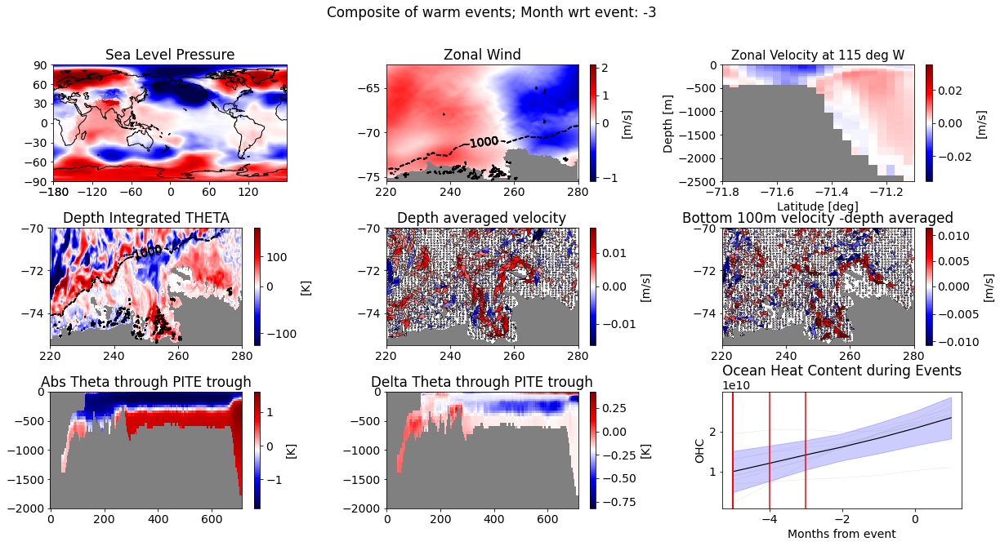

In [95]:
#ANIMATION
def OverviewAnimation_new(data_dt, suptitle='', filename='test'):
    from matplotlib.animation import FuncAnimation
    import matplotlib.animation as animation
    import matplotlib.pyplot as plt
    import matplotlib.colors as colors
    import cartopy.crs as ccrs
    from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

    plt.rcParams.update({'font.size': 14})
    from mitgcm_python_master.grid import ERA5Grid, PACEGrid, Grid, dA_from_latlon, pierre_obs_grid
    gp='/data/oceans_output/shelf/kaight/mitgcm/PAS_grid/'
    grid = Grid(gp)

    year=months[0]

    def plotSimpleMap(var, ax, year, title='Zonal Wind', unit='[m/s]', ymax=None, cbar=False):
        xcor=[m for m in data_dt[var].coords if 'X' in m][0]
        ycor=[m for m in data_dt[var].coords if 'Y' in m][0]
        data_dt[var]=data_dt[var].where(data_dt[var]!=0)
        divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(data_dt[var], 1), vmax=np.nanpercentile(data_dt[var], 99))
        img=ax.pcolor(data_dt[var][xcor], data_dt[var][ycor], data_dt[var].sel(time=year).values, cmap='seismic', norm=divnorm)
        ax.set_facecolor('grey')
        bath=ax.contour(data_dt[var][xcor], data_dt[var][ycor], grid.bathy, levels=[-1000], colors=['black'])
        plt.clabel(bath, [-1000])
        if type(ymax)!=None:
            ax.set_ylim([-75.5, ymax])
        if cbar:
            plt.colorbar(img, label=unit, ax=ax)
        ax.set_title(title)
        return

    def plotGlobalMap(var,  year, ax_nr=331, title='Sea Level Pressure', unit='[Pa]', cbar=False):
        ax = plt.subplot(ax_nr, projection=ccrs.PlateCarree(central_longitude=180.0))
        data_dt[var]=data_dt[var].where(data_dt[var]!=0)
        divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(data_dt[var], 1), vmax=np.nanpercentile(data_dt[var], 99))
        print(year)
        img=ax.pcolor(data_dt[var].lon, data_dt[var].lat, 
                      data_dt[var].sel(time=year).values, 
                      cmap='seismic', norm=divnorm, transform=ccrs.PlateCarree())
        ax.set_facecolor('grey')
        if cbar:
            plt.colorbar(img, label=unit, ax=ax)
        ax.coastlines()
        #ax.set_global()
        ax.set_title(title)
        #ax.set_xticks([-180, -120, -60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
        ax.set_xticks([0, 60, 120, 180, 240, 300, 360], crs=ccrs.PlateCarree())
        ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=ccrs.PlateCarree())
        #lon_formatter = LongitudeFormatter(zero_direction_label=True)
        #lat_formatter = LatitudeFormatter()
        #ax.xaxis.set_major_formatter(lon_formatter)
        #ax.yaxis.set_major_formatter(lat_formatter)

        return

    def plotLonSlice(var, ax,  year, unit='[K]', title='Zonal Velocity', x=106, 
                     xlim=[-71.8, -71.1], ylim=[-2500, 0], cbar=False):
        import matplotlib.colors as colors 

        a=data_dt[var].sel(time=year)
        a=a.where(a != 0) 

        ax.set_xlim(xlim)
        ax.set_ylim(ylim)

        divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(data_dt[var], 1), vmax=np.nanpercentile(data_dt[var], 99))
        img=ax.pcolormesh(a.YC, a.Z, a, cmap='seismic', norm=divnorm)
        if cbar:
            plt.colorbar(img, label=unit, ax=ax)
        ax.set_facecolor('grey')
        ax.set_title(title+' at {} deg W'.format(str(x)), fontsize=15)
        ax.set_xlabel('Latitude [deg]', fontsize=14)
        ax.set_ylabel('Depth [m]', fontsize=14)

        return

    def plotTransect(var, ax,  year, unit='[K]', title='Theta through PITE trough', cbar=False):
        if 'abs' in var:
            sublist=[k for k in data_dt if var in k]
        else:
            sublist=[k for k in data_dt if (var in k) & ('abs' not in k)]
        for i, sub in enumerate(sublist):
            if i==0:
                dat=data_dt[sub].sel(time=year)
            else:
                dat1=data_dt[sub].sel(time=year)
                dat1['Dist']=dat1.Dist+np.max(dat.Dist)
                dat1['Z']=dat.Z
                dat=xr.concat([dat, dat1], dim='Dist')
        dat=dat.where(dat!=0)
        ax.set_ylim([-2000, 0])
        img=ax.pcolor(dat.Dist, dat.Z, dat, cmap='seismic')
        if cbar:
            plt.colorbar(img, label=unit, ax=ax)
        ax.set_facecolor('grey')
        ax.set_title(title)
        return

    def plotVelMap(var, varxy,  year, ax, title='Depth integrated velocity', unit='[m/s]', ymax=None, cbar=False):
        xcor=[m for m in data_dt[var].coords if 'X' in m][0]
        ycor=[m for m in data_dt[var].coords if 'Y' in m][0]
        data_dt[var]=data_dt[var].where(data_dt[var]!=0)
        divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(data_dt[var], 1), vmax=np.nanpercentile(data_dt[var], 99))
        z=data_dt[var].sel(time=year).values.copy()
        z[np.isfinite(z)]=0
        img=ax.pcolor(data_dt[var][xcor], data_dt[var][ycor], z, cmap='seismic', norm=divnorm)
        ax.set_facecolor('grey')
        #bath=ax.contour(data_dt[var][xcor], data_dt[var][ycor], grid.bathy, levels=[-1000], colors=['black'])
        #plt.clabel(bath, [-1000])
        if type(ymax)!=None:
            ax.set_ylim([-75.5, ymax])

        ax.set_title(title)

        #     ax.quiver(data_dt[var][xcor][::step], data_dt[var][ycor][::step], 
        #                data_dt[varxy[0]].sel(time=year).values[::step, ::step], 
        #                data_dt[varxy[1]].sel(time=year).values[::step, ::step], edgecolor='white',width=0.02, headwidth=2, minshaft=5, headlength=5, linewidth = 0.5,
        #                color='black')
        step=4
        step2=10
        img=ax.quiver(data_dt[var][xcor][::step2], data_dt[var][ycor][::step], 
                   data_dt[varxy[0]].sel(time=year).values[::step, ::step2], 
                   data_dt[varxy[1]].sel(time=year).values[::step, ::step2], data_dt[var].sel(time=year).values[::step, ::step2], scale=0.2, width=0.01, edgecolor='black', linewidth = 0.5, cmap='seismic', norm=divnorm)
        if cbar:
            plt.colorbar(img, label=unit, ax=ax)
        return


    fig, ax=plt.subplots(3,3,figsize=(20,10))
    plotGlobalMap(var='PSL', ax_nr=331, year=year, title='Sea Level Pressure', unit='[Pa]', cbar=True)
    plotSimpleMap(var='EXFuwind', ax=ax[0,1], year=year, title='Zonal Wind', unit='[m/s]', cbar=True)
    plotLonSlice(var='UVELW115', ax=ax[0,2], year=year, unit='[m/s]', title='Zonal Velocity', x=115, cbar=True)
    plotSimpleMap(var='THETA', ax=ax[1,0], year=year, title='Depth Integrated THETA', unit='[K]', ymax=-70, cbar=True)

    plotVelMap(var='VELfield', varxy=['UVEL', 'VVEL'], year=year, ax=ax[1,1], title='Depth averaged velocity', 
               unit='[m/s]', ymax=-70, cbar=True)
    plotVelMap(var='VELBfield', varxy=['UVELB', 'VVELB'], year=year, ax=ax[1,2], 
               title='Bottom 100m velocity -depth averaged', unit='[m/s]', ymax=-70, cbar=True)

    plotTransect(var='THETAPITE_abs', ax=ax[2,0], year=year, unit='[K]', title='Abs Theta through PITE trough', cbar=True)
    plotTransect(var='THETAPITE', year=year, ax=ax[2,1], unit='[K]', title='Delta Theta through PITE trough', cbar=True)

    for ev in list(events):
        ax[2,2].plot(months, events[ev] ,linewidth=0.1, c='grey')
    ax[2,2].plot(months, events.mean(axis=1) ,linewidth=1.2, c='k')
    ax[2,2].fill_between(months, events.mean(axis=1)-events.std(axis=1), events.mean(axis=1)+events.std(axis=1), color='b', alpha=0.2)
    ax[2,2].set_ylabel('OHC')
    ax[2,2].set_title('Ocean Heat Content during Events', pad=20)
    ax[2,2].set_xlabel('Months from event')
    ax[2,2].axvline(x=year, color='r')

    fig.subplots_adjust(wspace=0.4, hspace=0.4)
    fig.suptitle(suptitle+'; Month wrt event: '+str(year))
    
    def animate(i):
        print(i)
        year=i+months[0]
        #fig, ax=plt.subplots(3,3,figsize=(20,10))
        plotGlobalMap(var='PSL', ax_nr=331, year=year, title='Sea Level Pressure', unit='[Pa]')
        plotSimpleMap(var='EXFuwind', ax=ax[0,1], year=year, title='Zonal Wind', unit='[m/s]')
        plotLonSlice(var='UVELW115', ax=ax[0,2], year=year, unit='[m/s]', title='Zonal Velocity', x=115)
        plotSimpleMap(var='THETA', ax=ax[1,0], year=year, title='Depth Integrated THETA', unit='[K]', ymax=-70)

        plotVelMap(var='VELfield', varxy=['UVEL', 'VVEL'], year=year, ax=ax[1,1], title='Depth averaged velocity', unit='[m/s]', ymax=-70)
        plotVelMap(var='VELBfield', varxy=['UVELB', 'VVELB'], year=year, ax=ax[1,2], title='Bottom 100m velocity -depth averaged', unit='[m/s]', ymax=-70)

        plotTransect(var='THETAPITE_abs', ax=ax[2,0], year=year, unit='[K]', title='Abs Theta through PITE trough')
        plotTransect(var='THETAPITE', ax=ax[2,1], year=year, unit='[K]', title='Delta Theta through PITE trough')

#         for ev in list(events):
#             ax[2,2].plot(months, events[ev] ,linewidth=0.1, c='grey')
#         ax[2,2].plot(months, events.mean(axis=1) ,linewidth=1.2, c='k')
#         ax[2,2].fill_between(months, events.mean(axis=1)-events.std(axis=1), events.mean(axis=1)+events.std(axis=1), color='b', alpha=0.2)
#         ax[2,2].set_ylabel('OHC')
#         ax[2,2].set_title('Ocean Heat Content during Events', pad=20)
#         ax[2,2].set_xlabel('Months from event')
        ax[2,2].axvline(x=year, color='r')
        
        fig.suptitle(suptitle+'; Month wrt event: '+str(year))
        return


    from datetime import date
    today = date.today()
    today=today.strftime("%Y%m%d")
    anim = animation.FuncAnimation(fig, animate, frames=months[-1]-months[0], repeat=False, interval=5000)
    writergif = animation.PillowWriter(fps=1)
    anim.save('../03_output/composite/'+today+'_animation_overview_composite_'+filename+'_.gif', writer=writergif)
    return

OverviewAnimation_new(data_dt=data_new, suptitle='Composite of warm events', filename='newtest')

posx and posy should be finite values


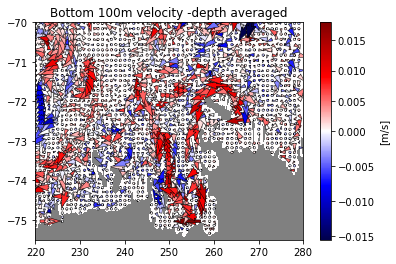

In [47]:
data_new['VELfield'][(np.isnan(data_new['VELfield']))]

IndexError: 3-dimensional boolean indexing is not supported. 

In [152]:
plt.contourf(data_new['THETAPITE_1'].Dist, data_new['THETAPITE_1'].Z,  data_dt['THETAPITE_1'].sel(time='1940-01-01').sel(ens=0).where(data_new['THETAPITE_1'].sel(time=0)!=0), cmap='seismic')
plt.ylim([-2000,0])
plt.colorbar()

In [156]:
import matplotlib
matplotlib.use('TkAgg')

ImportError: Cannot load backend 'TkAgg' which requires the 'tk' interactive framework, as 'headless' is currently running

In [132]:

        data_dt['THETAPITE_0'].sel(time='1940-01-01').sel(ens=0)

<xarray.DataArray 'THETA' (Z: 50, Dist: 141)>
array([[ 0.        ,  0.        ,  0.        , ...,  1.04608647,
         1.27937027,  1.28428657],
       [ 0.        ,  0.        ,  0.        , ...,  0.12543995,
         0.17303887,  0.16580421],
       [ 0.        ,  0.        ,  0.        , ..., -0.11951454,
        -0.1005157 , -0.10742176],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])
Coordinates:
    time     datetime64[ns] 1940-01-01
  * Z        (Z) float64 -5.0 -15.0 -25.0 ... -4.86e+03 -5.16e+03 -5.46e+03
  * Dist     (Dist) float64 0.09986 3.757 4.044 7.518 ... 288.8 290.6 293.7
    month    int64 1

In [159]:
events=pd.DataFrame()
for col in columns:
    for i in start_list[col][start_list[col]==True].index:
        events[col+'_'+str(i.year)+'-'+str(i.month)]=total['amundsen_shelf_ohc_below_0m'][col].rolling(24, center=True).mean()[i+pd.DateOffset(months=months[0]):i+pd.DateOffset(months=months[-1])].values

In [126]:
start_list

,ens01,ens02,ens03,ens04,ens05,ens06,ens07,ens08,ens09,ens10,ens11,ens12,ens13,ens14,ens15,ens16,ens17,ens18,ens19,ens20
1920-01-01,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1920-02-01,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1920-03-01,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1920-04-01,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1920-05-01,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-08-01,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2013-09-01,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2013-10-01,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2013-11-01,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [114]:
q.sel(time=true_list.index-pd.DateOffset(months=1))

<xarray.Dataset>
Dimensions:  (time: 8, YC: 384, XC: 600, ens: 1)
Coordinates:
  * time     (time) datetime64[ns] 1920-12-01 1941-04-01 ... 2009-08-01
  * YC       (YC) float32 -75.64 -75.61 -75.59 -75.56 ... -62.48 -62.44 -62.39
  * XC       (XC) float32 220.1 220.1 220.2 220.4 ... 279.6 279.8 279.9 280.0
Dimensions without coordinates: ens
Data variables:
    THETA    (ens, time, YC, XC) float64 0.0 0.0 0.0 ... 5.879e+03 5.939e+03

In [118]:
tlist=true_list.index+pd.DateOffset(months=-15)

In [119]:
7         print(np.shape(data_dt[var].sel(time=year).mean(dim='time').values))
---> 38         img=ax.pcolor(data_dt[var].lon, data_dt[var].lat, 
     39                       data_dt[var].sel(time=year).mean(dim='time').values,
     40                       cmap='seismic', norm=divnorm, transform=ccrs.PlateCarree())

DatetimeIndex(['1919-10-01', '1940-02-01', '1945-11-01', '1952-01-01',
               '1968-03-01', '1987-02-01', '1992-01-01', '2008-06-01'],
              dtype='datetime64[ns]', freq=None)

In [179]:
data_new['PSL'].sel(time=-10).mean(dim='time').mean(dim='events')

<xarray.DataArray 'PSL' (events: 1, lat: 192, lon: 288)>
array([[[ -37.982647 ,  -37.982555 ,  -37.982555 , ...,  -37.982525 ,
          -37.982616 ,  -37.982513 ],
        [ -75.645294 ,  -75.782135 ,  -75.897446 , ...,  -74.97271  ,
          -75.21485  ,  -75.48315  ],
        [-102.0446   , -103.21415  , -104.38226  , ...,  -97.929306 ,
          -99.3638   , -100.75876  ],
        ...,
        [   1.4992523,    1.7480011,    2.025776 , ...,    0.8905487,
            1.0441704,    1.2569313],
        [  15.862873 ,   16.126652 ,   16.376999 , ...,   15.073341 ,
           15.315796 ,   15.577694 ],
        [  25.543116 ,   25.543116 ,   25.543116 , ...,   25.543116 ,
           25.543116 ,   25.543116 ]]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
Dimensions without coordinates: events

In [123]:
tlist

[Timestamp('1940-02-01 00:00:00'),
 Timestamp('1945-11-01 00:00:00'),
 Timestamp('1952-01-01 00:00:00'),
 Timestamp('1968-03-01 00:00:00'),
 Timestamp('1987-02-01 00:00:00'),
 Timestamp('1992-01-01 00:00:00'),
 Timestamp('2008-06-01 00:00:00')]

In [167]:
total_dt=total['amundsen_shelf_ohc_below_0m']-total['amundsen_shelf_ohc_below_0m'].rolling(25*12, center=True, min_periods=5*12).mean()
events=pd.DataFrame()
for col in columns:
    for i in start_list[col][start_list[col]==True].index:
        events[col+'_'+str(i.year)+'-'+str(i.month)]=total_dt[col].rolling(24, center=True).mean()[i+pd.DateOffset(months=months[0]):i+pd.DateOffset(months=months[-1])].values

In [168]:
events

,ens01_1921-1,ens01_1941-5,ens01_1947-2,ens01_1953-4,ens01_1969-6,ens01_1988-5,ens01_1993-4,ens01_2009-9
0,6.324247e+09,4.839629e+09,5.859416e+09,-1.646407e+09,7.286572e+08,-1.188587e+10,1.910734e+10,2.519520e+09
1,5.667672e+09,6.067498e+09,7.587153e+09,-2.336998e+08,1.863702e+09,-9.319929e+09,1.895190e+10,4.423587e+09
2,5.349873e+09,7.738584e+09,8.778666e+09,1.449315e+09,2.996907e+09,-6.833533e+09,1.886214e+10,5.968670e+09
3,5.955070e+09,9.153543e+09,1.003120e+10,3.636675e+09,4.522779e+09,-4.247892e+09,1.875839e+10,7.022368e+09
4,6.472281e+09,1.102412e+10,1.146440e+10,6.173012e+09,6.160836e+09,-1.070678e+09,1.874490e+10,7.980274e+09
5,6.886885e+09,1.278271e+10,1.320810e+10,8.691928e+09,7.813888e+09,2.138683e+09,1.938640e+10,8.959469e+09
6,7.391891e+09,1.473343e+10,1.470404e+10,1.136085e+10,1.019468e+10,6.922861e+09,2.036278e+10,1.067615e+10
7,8.026189e+09,1.674409e+10,1.595793e+10,1.404012e+10,1.298620e+10,1.201659e+10,2.050547e+10,1.284086e+10
8,8.441634e+09,1.835530e+10,1.697678e+10,1.686609e+10,1.617400e+10,1.647380e+10,1.985403e+10,1.577922e+10
9,9.023279e+09,2.081261e+10,1.877677e+10,1.946014e+10,1.941271e+10,1.946982e+10,2.016465e+10,1.938661e+10


In [181]:
data_dt[]

{'EXFuwind': <xarray.DataArray 'EXFuwind' (events: 1, time: 120, YC: 384, XC: 600)>
 array([[[[        nan,         nan,         nan, ...,         nan,
                   nan,         nan],
          [        nan,         nan,         nan, ...,         nan,
                   nan,         nan],
          [        nan,         nan,         nan, ...,         nan,
                   nan,         nan],
          ...,
          [ 5.3347344 ,  5.315454  ,  5.302271  , ...,  1.0085728 ,
            1.0220491 ,  1.0274632 ],
          [ 5.3349795 ,  5.3159127 ,  5.297748  , ...,  1.0160944 ,
            1.0279348 ,  1.0331435 ],
          [ 5.335022  ,  5.3425517 ,  5.3503675 , ...,  1.052804  ,
            1.0457375 ,  1.0386835 ]],
 
         [[        nan,         nan,         nan, ...,         nan,
                   nan,         nan],
          [        nan,         nan,         nan, ...,         nan,
                   nan,         nan],
          [        nan,         nan,         nan, 

In [202]:
import pandas as pd
import cftime

months=[-10, 5]
startyr='1920'
endyr='2013'

def month_diff(a, b):
    return round(((a - b)/np.timedelta64(1, 'M')))

#Find the start date per ensemble member.
start_list=pd.DataFrame()
for ens in selected.columns:
    start=np.array([False,]*len(selected[ens]))
    for i in range(len(selected[ens])):
        if (selected[ens].iloc[i]==True) & (selected[ens].iloc[i-1]==False):
            start[i]=True
    start_list[ens]=pd.Series(start, index=selected[ens].index)


#Load the correct data and give it a relative time name.
columns=start_list.columns
columns=columns.sort_values()
columns=['ens01']
months=np.arange(months[0], months[-1])

data_new={}
for var in ['PSL']:#list(data_dt):
    print('Start with: '+var)
    data_new[var]=None
    try:
        data_dt[var]['time']=data_dt[var].indexes['time'].to_datetimeindex()
    except:
        print(var+': already datetime index')
    for month in months:
        b=None
        print('Month is:'+str(month))
        for ensnum, col in enumerate(columns):
            print(col)
            print(ensnum)
            true_list=start_list[col][start_list[col]==True]
            tlist=true_list.index+pd.DateOffset(months=month)
            tlist=[t for t in tlist if (t>pd.to_datetime(startyr)) & (t<pd.to_datetime(endyr))] #Check that all values are within the correct time window
            a=data_dt[var].sel(ens=ensnum).sel(time=tlist)
            #a['time']=[month,]*len(a.time)
            a=a.rename({'time':'events'})
            a=a.expand_dims("time")
            a['time']=[month]
            if type(b)==type(None):
                b=a
            else:
                b=xr.concat([b,a], dim='events')
        if type(data_new[var])==type(None):
            data_new[var]=b
        else:
            data_new[var]=xr.concat([data_new[var], b], dim='time')
    data_new[var].mean(dim='events')
    
    
# total_dt=total['amundsen_shelf_ohc_below_0m']-total['amundsen_shelf_ohc_below_0m'].rolling(25*12, center=True, min_periods=5*12).mean()
# events=pd.DataFrame()
# for col in columns:
#     for i in start_list[col][start_list[col]==True].index:
#         events[col+'_'+str(i.year)+'-'+str(i.month)]=total_dt[col].rolling(24, center=True).mean()[i+pd.DateOffset(months=months[0]):i+pd.DateOffset(months=months[-1])].values

Start with: PSL
PSL: already datetime index
Month is:-10
ens01
0
Month is:-9
ens01
0
Month is:-8
ens01
0
Month is:-7
ens01
0
Month is:-6
ens01
0
Month is:-5
ens01
0
Month is:-4
ens01
0
Month is:-3
ens01
0
Month is:-2
ens01
0
Month is:-1
ens01
0
Month is:0
ens01
0
Month is:1
ens01
0
Month is:2
ens01
0
Month is:3
ens01
0
Month is:4
ens01
0


In [194]:
data_new['PSL2']=data_new['PSL'].copy()

In [203]:
data_new['PSL']

<xarray.DataArray 'PSL' (time: 15, events: 120, lat: 192, lon: 288)>
array([[[[ -359.98737 ,  -359.98712 ,  -359.98703 , ...,  -359.98712 ,
           -359.98737 ,  -359.98703 ],
         [ -331.0882  ,  -331.0147  ,  -331.14404 , ...,  -331.39105 ,
           -331.27246 ,  -331.23746 ],
         [ -303.83786 ,  -303.222   ,  -302.7337  , ...,  -305.42212 ,
           -304.97614 ,  -304.48636 ],
         ...,
         [-1728.4022  , -1732.4478  , -1736.5895  , ..., -1716.2887  ,
          -1720.4048  , -1724.3993  ],
         [-1785.3165  , -1787.1322  , -1789.1694  , ..., -1779.8315  ,
          -1781.7444  , -1783.5164  ],
         [-1829.7478  , -1829.7478  , -1829.7478  , ..., -1829.7478  ,
          -1829.7478  , -1829.7478  ]],

        [[         nan,          nan,          nan, ...,          nan,
                   nan,          nan],
         [         nan,          nan,          nan, ...,          nan,
                   nan,          nan],
         [         nan,          nan,          nan, ...,          nan,
                   nan,          nan],
...
         [         nan,          nan,          nan, ...,          nan,
                   nan,          nan],
         [         nan,          nan,          nan, ...,          nan,
                   nan,          nan],
         [         nan,          nan,          nan, ...,          nan,
                   nan,          nan]],

        [[  579.10925 ,   579.10925 ,   579.10925 , ...,   579.10925 ,
            579.10925 ,   579.10925 ],
         [  577.7312  ,   577.4812  ,   577.1113  , ...,   577.6896  ,
            577.8594  ,   577.765   ],
         [  585.2212  ,   585.25653 ,   585.13666 , ...,   584.6504  ,
            584.8713  ,   585.0937  ],
         ...,
         [  401.34528 ,   399.24487 ,   397.13022 , ...,   407.5972  ,
            405.7143  ,   403.49133 ],
         [  396.42422 ,   395.03427 ,   393.89053 , ...,   400.42825 ,
            399.28336 ,   397.77808 ],
         [  381.63397 ,   381.63397 ,   381.63397 , ...,   381.63397 ,
            381.63397 ,   381.63397 ]]]], dtype=float32)
Coordinates:
  * events   (events) datetime64[ns] 1920-03-01 1920-04-01 ... 2010-01-01
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
    month    (time, events) float64 3.0 nan nan nan nan ... nan nan nan nan 1.0
  * time     (time) int64 -10 -9 -8 -7 -6 -5 -4 -3 -2 -1 0 1 2 3 4

In [96]:
data_new

{'EXFuwind': <xarray.DataArray 'EXFuwind' (time: 7, YC: 384, XC: 600)>
 array([[[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         ...,
         [-1.3122772 , -1.3044056 , -1.2975394 , ...,  0.03522021,
           0.04429317,  0.05166712],
         [-1.3147848 , -1.3068334 , -1.2981145 , ...,  0.0414877 ,
           0.04755887,  0.05306774],
         [-1.3171058 , -1.3173201 , -1.3175157 , ...,  0.04823719,
           0.05127518,  0.05435494]],
 
        [[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
             

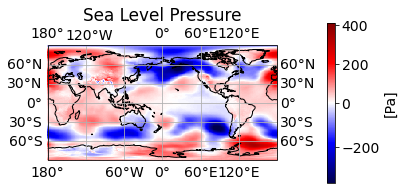

In [109]:
import cartopy.crs as ccrs
def plotGlobalMap(data_dt, var,  year, ax_nr=331, title='Sea Level Pressure', unit='[Pa]', cbar=False):
    ax = plt.subplot(ax_nr, projection=ccrs.PlateCarree(central_longitude=180.0))
    data_dt[var]=data_dt[var].where(data_dt[var]!=0)
    divnorm = colors.TwoSlopeNorm(vcenter=0, vmin=np.nanpercentile(data_dt[var], 1), vmax=np.nanpercentile(data_dt[var], 99))
    img=ax.pcolor(data_dt[var].lon, data_dt[var].lat, 
                  data_dt[var].sel(time=year).values, 
                  cmap='seismic', norm=divnorm, transform=ccrs.PlateCarree())
    ax.set_facecolor('grey')
    if cbar:
        plt.colorbar(img, label=unit, ax=ax, pad=0.15)
    ax.coastlines()
    ax.set_title(title)
    ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree(central_longitude=180.0))

    return
   
year=-4
plt.figure(figsize=(20,10))
plotGlobalMap(data_dt=data_new, var='PSL', ax_nr=331, year=year, title='Sea Level Pressure', unit='[Pa]', cbar=True)

In [135]:
list(total)

['time',
 'pine_island_bay_isotherm_0C_below_100m',
 'dotson_bay_isotherm_-1C_below_100m',
 'amundsen_shelf_isotherm_0.5C_below_100m',
 'amundsen_shelf_break_uwind_avg',
 'all_massloss',
 'getz_massloss',
 'dotson_massloss',
 'thwaites_massloss',
 'pig_massloss',
 'cosgrove_massloss',
 'abbot_massloss',
 'venable_massloss',
 'amundsen_shelf_temp_btw_200_700m',
 'amundsen_shelf_salt_btw_200_700m',
 'pine_island_bay_temp_btw_200_700m',
 'pine_island_bay_salt_btw_200_700m',
 'dotson_bay_temp_btw_200_700m',
 'dotson_bay_salt_btw_200_700m',
 'amundsen_shelf_thermocline',
 'pine_island_bay_thermocline',
 'dotson_bay_thermocline',
 'amundsen_shelf_sst_avg',
 'amundsen_shelf_sss_avg',
 'dotson_to_cosgrove_massloss',
 'amundsen_shelf_temp_below_700m',
 'amundsen_shelf_ohc_below_0m',
 'pine_island_bay_ohc_below_0m',
 'amundsen_shelf_seaice_freeze',
 'pine_island_bay_seaice_freeze']